# Particle Swarm Optimization (PSO)

The Particle Swarm Optimization (PSO) algorithm is a population-based search technique inspired by the social behavior of birds in a flock. Originally developed to visually simulate the elegant and unpredictable movements of birds, PSO aims to uncover the patterns that enable these creatures to fly in synchrony and swiftly change direction while maintaining an optimal formation. This foundational idea has evolved into a highly effective optimization algorithm that leverages the collective dynamics of a group.

The Particle Swarm Optimization (PSO) algorithm operates with a swarm of particles, where each particle symbolizes a potential solution to the optimization problem at hand. Drawing parallels with evolutionary computation, the swarm functions like a population, while each particle represents an individual within that population.

<figure><center>
    <img src="pics/pso/pso.jpg" alt="missing">
</center></figure>

In PSO, individual solutions, known as particles, navigate through a hyperdimensional search space. The movement of these particles is influenced by their own experiences as well as the successes of their neighbors, reflecting a social-psychological tendency to imitate effective behaviors. This cooperative mechanism allows particles to return stochastically to previously successful areas in the search space, enhancing the likelihood of discovering optimal solutions. As each particle emulates both its own achievements and those of its peers, the swarm collectively converges on high-quality regions within the complex search landscape, demonstrating the power of simple behavioral rules in achieving sophisticated outcomes.

## **Contents**

<a href="#know-how">01. How it works?</a>

<a href="#gbest">02. Global Best PSO</a>

<a href="#lbest">03. Local Best PSO</a>

<a href="#implement">04. Implementing Global and Local Best PSO</a>

<a href="#compare">05. Comparing gbest and lbest PSO</a>

<a href="#practice">06. PSO in Practice</a>

<a href="#velocity">07. Velocity Components</a>

<a href="#turbulence">08. Turbulence Factor</a>

<a href="#geometric">09. Geometric Illustration</a>

<a href="#aspects">10. Algorithm Aspects</a>

<a href="#termination">11. Termination Criteria</a>

<a href="#structure">12. Social Network Structures</a>

<a href="#versus">13. Comparing Synchronous and Asynchronous Updates</a>

<a href="#params">14. Basic PSO Parameters</a>

<a href="#variation">15. Variations of PSO</a>

<a href="#hybrid">16. Hybrid Methods</a>

<a href="#binary">17. Binary PSO</a>

<a href="#constraint">18. Constraint Handling Approaches</a>

<a href="#multi">19. Multi-Objective Optimization</a>

<a href="#many">20. Many-Objective Optimization</a>

<a href="#dynamic">21. Dynamic Environments</a>

<a href="#apps">22. Applications</a>

<a href="#citations">23. Citations</a>



## <a id='know-how'>How it works?</a>

To illustrate this process, let $x_i(t)$  represent the position of particle $i$ in the search space at discrete time step $t$. The movement of each particle is determined by updating its position through the addition of a velocity term, $v_i(t)$, to its current position. This dynamic allows particles to explore the search space effectively, leveraging both personal and collective knowledge to converge on optimal solutions.


$$x_i(t + 1) = x_i(t) + v_i(t + 1) \hspace{10pt} (1)$$


with $$x_i(0) ∼ U(x_{min},x_{max}).$$

The velocity vector is crucial to the optimization process in Particle Swarm Optimization (PSO), as it encapsulates both the individual experiences of each particle and the socially shared information from its neighborhood. The individual experience, known as the **cognitive component**, is influenced by the particle's distance from its personal best position—its optimal solution discovered since the beginning of the search. In contrast, the **social component** reflects the influence of neighboring particles' successes. Two primary variations of the PSO algorithm have been developed based on neighborhood size: gbest PSO, which considers the global best position among all particles, and lbest PSO, which focuses on the best positions within a localized neighborhood. These distinctions shape how particles update their velocities and positions during the optimization process.

## <a id='gbest'>Global Best PSO</a>

<figure><center>
    <img src="pics/pso/gbest.jpg" alt="missing">
</center></figure>

In the global best PSO, commonly referred to as gbest PSO, each particle's neighborhood encompasses the entire swarm. This configuration utilizes a star topology for its social network, where the central node represents the collective best position identified by all particles in the swarm. Consequently, during the velocity update process, the social component of each particle's movement is influenced by this global best position, denoted as $\hat{y}(t)$ at time step $t$. This approach allows each particle to draw on the successes of the entire swarm, promoting a more unified search for optimal solutions across the multidimensional search space.

The velocity in gbest PSO is calculated as:

$$v_{ij} (t + 1) = v_{ij} (t) + c_1 r_{1j} (t)[y_{ij} (t) - x_{ij} (t)] + c_2 r_{2j} (t)[\hat{y_j}(t) - x_{ij} (t)] \hspace{10pt} (2)$$


In the gbest PSO framework, the velocity of particle $i$ in dimension $j$ at time step $t$ is represented as $v_{ij}(t)$, while its position in the same dimension is denoted as $x_{ij}(t)$. The algorithm incorporates two positive acceleration constants, $c_1$ and $c_2$, which scale the contributions of the cognitive and social components of the velocity update, respectively. These constants play a critical role in balancing individual exploration and collective exploitation of the search space. Additionally, random values $r_{1j}(t)$ and $r_{2j}(t)$, drawn from a uniform distribution within the range $[0, 1]$, introduce a stochastic element to the algorithm. This randomness enhances the diversity of particle movements, allowing for a more thorough exploration of potential solutions.

The personal best position $y_i$ for particle $i$ is the optimal position it has visited from the start. In minimization problems, the personal best position for the next time step, $t+1$, is determined as follows:

$$
y_i(t+1)=
\begin{cases}
y_i(t) & \text{if} \hspace{5pt} f(x_i(t+1)) \geq f(y_i(t)) \\
x_i(t+1) & \text{if} \hspace{5pt} f(x_i(t+1)) < f(y_i(t))
\end{cases}  \hspace{10pt} (3)
$$

In the context of Particle Swarm Optimization, the fitness function, denoted as $f: \mathbb{R}^{n_x} \rightarrow \mathbb{R}$, serves a crucial role similar to that in evolutionary algorithms. It evaluates how close a given solution is to the optimal value, effectively quantifying the performance or quality of each particle within the swarm. The positions of particles are represented by $x$ and $y$, with $y_{ij}(t)$ indicating the best personal position achieved by particle $i$ in dimension $j$ at time step $t$. This fitness assessment guides the optimization process by allowing particles to identify and move toward more promising regions of the search space, thereby enhancing their chances of converging on optimal solutions.

The global best position $\hat{y}(t)$ at time step $t$ is described as:

$$
\hat{y}(t) \in {y_0(t),...,y_{n_s}(t)}|f(\hat{y}(t)) = min\{f(y_0(t)),..., f(y_{n_s}(t))\}  \hspace{10pt} (4)
$$

Where $n_s$ represents the total number of particles in the swarm. Notably, according to equation (4), $\hat{y}$ is defined as the best position identified by any particle up to that point, generally calculated as the top personal best position. The global best position can also be chosen from the particles of the current swarm. In this scenario, we have:

$$
\hat{y}(t) = min\{f(x_0(t)),..., f(x_{n_s}(t))\}  \hspace{10pt} (5)
$$

In the swarm, the overall best position is the highest among all individual particles' personal bests. Each particle has its personal best, but the swarm's best is the ultimate pinnacle. A particle that heavily relies on its personal best demonstrates a strong cognitive component, while one that leans towards the swarm's best position shows a pronounced social component.

### Pseudo Code for Global Best PSO

**1. Initialize Parameters:**

- Define constants: `omega` (inertia weight), `phi_p` (personal best coefficient), `phi_g` (global best coefficient)
- Set the number of particles `num_particles`
- Set the number of dimensions `num_dimensions`
- Set the number of iterations `num_iterations`
- Define boundaries for positions and velocities

**2. Initialize the Swarm:**

- For each particle:
    - Initialize particle's position randomly within the boundaries
    - Initialize particle's velocity randomly within the boundaries
    - Initialize particle's personal best position to its current position
    - Initialize particle's personal best fitness to a high value (worst possible fitness)
- Initialize the global best position and global best fitness

**3. Iterate Over the Number of Iterations:**

- For each particle:
    - Evaluate the fitness of the particle's current position
    - Update particle's personal best position and fitness if the current fitness is better
    - Update the global best position and fitness if the current fitness is the best found so far

**4. Update the Particles' Velocities and Positions:**

- For each particle:
    - Update the velocity using the formula:
      $$
      v = \omega \cdot v + \phi_p \cdot r_p \cdot (p_{\text{best}} - p) + \phi_g \cdot r_g \cdot (g_{\text{best}} - p)
      $$
      where:
      - $v$ is the velocity
      - $p$ is the current position
      - $p_{\text{best}}$ is the personal best position
      - $g_{\text{best}}$ is the global best position
      - $r_p$ and $r_g$ are random numbers between 0 and 1
    - Update the position using the formula:
      $$
      p = p + v
      $$
    - Ensure the new position is within the boundaries

**5. Return the Global Best Position and Fitness:**

- After all iterations, return the global best position and fitness

Here is how the pseudo code looks in a structured format:

<hr style="border: 2px solid #fff;">

```plaintext
Initialize omega, phi_p, phi_g, num_particles, num_dimensions, num_iterations
Define position and velocity boundaries

Initialize swarm:
    For each particle in the swarm:
        Initialize position randomly within boundaries
        Initialize velocity randomly within boundaries
        Initialize personal best position to current position
        Initialize personal best fitness to a high value
    Initialize global best position and fitness

For iter in range(num_iterations):
    For each particle in the swarm:
        Evaluate fitness of the current position
        If current fitness is better than personal best fitness:
            Update personal best fitness
            Update personal best position
        If current fitness is better than global best fitness:
            Update global best fitness
            Update global best position

    For each particle in the swarm:
        Update velocity using the formula:
            v = omega * v + phi_p * r_p * (personal best position - current position) + phi_g * r_g * (global best position - current position)
        Update position using the formula:
            position = position + velocity
        Ensure the new position is within boundaries

Return global best position and fitness
```
<hr style="border: 2px solid #fff;">

## <a id='lbest'>Local Best PSO</a>

<figure><center>
    <img src="pics/pso/lbest.jpg" alt="missing">
</center></figure>

The local best PSO, or lbest PSO, employs a ring social network topology, which establishes smaller neighborhoods for each particle within the swarm. This configuration allows particles to exchange information solely within their immediate vicinity, reflecting localized knowledge of the search environment. In terms of the velocity update equation, the social component of a particle's velocity is determined by the distance between that particle and the best position identified by its neighborhood. This approach ensures that each particle's movement is influenced by the successes of its closest peers, fostering collaboration while maintaining a degree of independence in exploring the search space.

$$
v_{ij}(t+1) = v_{ij}(t) + c_1r_{1j}(t)[y_{ij}(t) - x_{ij}(t)] + c_2r_{2j}(t)[\hat{y}_{ij}(t)-x_{ij}(t)] \hspace{10pt} (6)
$$

In the above equation, everything mirrors the velocity equation for the global best, with one exception: the global best parameter ($\hat{y}$) is replaced with the local neighborhood's best position ($\hat{y}_{ij}$) for particle $i$ in dimension $j$. Essentially, $y_{ij}$ represents the best position particle $i$ has ever experienced in dimension $j$, while $\hat{y}_{ij}$   denotes the best position ever encountered in its local neighborhood.

The local best particle position $\hat{y}_i$, which is the optimal position discovered within the neighborhood $N_i$, is defined as:



$$
\hat{y}_i(t+1) \in {N_i|f(\hat{y}_i(t+1))=min\{f(x)\}, \forall x \in N_i} \hspace{10pt} (7)
$$

The equation indicates that for each particle $x$ within the neighborhood, the algorithm calculates $f(x)$ and identifies the particle with the minimum fitness value, which then becomes the current best position, denoted as $\hat{y}_i(t + 1)$, for particle $i$ at the next time step. Importantly, this does not refer to the best position ever experienced by the neighborhood but rather to the best position at that specific moment, reflecting a snapshot of the search space rather than a cumulative history of experiences. This local optimization strategy enhances exploration of the search space and helps prevent premature convergence to local minima, distinguishing it from global best PSO approaches.

In equation (7), the neighborhood of size $n_{N_i}$ is defined as:

$$
N_i = {y_{i-nN_i}(t), y_{i-nN_i+1}(t),..., y_{i-1}(t), y_i(t), y_{i+1}(t),..., y_{i+nN_i}(t)} \hspace{10pt} (8)
$$

The local best position will also be referred to as the neighborhood best position.

The decision to incorporate historical data is ultimately left to the discretion of the developer. Traditional definitions of gBest (global best) and lBest (local best) PSO have distinct characteristics regarding how they utilize information. In gBest PSO, each particle is influenced by the best position found by any particle in the entire swarm throughout the optimization process, maintaining a memory of the best position across all iterations. Conversely, lBest PSO focuses on the best position found within a smaller neighborhood, using historical positions from its local neighborhood rather than the entire swarm.

While these definitions are standard, developers have the flexibility to modify or create variations of PSO algorithms. For instance, a version of gBest might only consider the best position found in the current iteration for specific scenarios or optimizations, and variations of lBest could be designed to include different neighborhood topologies or rules for updating best positions. This flexibility allows for adaptations to specific applications or research purposes, potentially leading to different performance characteristics.

For the basic PSO, particles within a neighborhood are not interconnected. Neighborhood selection is based on particle indices. However, there are strategies where neighborhoods are created based on spatial similarity.


There are primarily two reasons why neighborhoods based on particle indices are favored: 

(1) This approach is computationally efficient, as it does not require the spatial ordering of particles. In contrast, methods that rely on the distance between particles necessitate calculating the Euclidean distance for all pairs, resulting in a complexity of $O(n_{s}^2)$, where $n_s$ represents the number of particles. 

(2) Using indexed neighborhoods facilitates the dissemination of information about promising solutions to all particles, regardless of their current positions in the search space.

It's also worth noting that neighborhoods overlap. A particle can belong to multiple neighborhoods. This overlapping allows for information sharing between neighborhoods, ensuring the swarm converges on a single point—the global best particle. The gbest PSO is a specific instance of the lbest PSO where $n_{N_i} = n_s$.


### Pseudo Code for Local Best PSO

**1. Initialize Parameters:**

- Define constants: `omega` (inertia weight), `phi_p` (personal best coefficient), `phi_l` (local best coefficient)
- Set the number of particles `num_particles`
- Set the number of dimensions `num_dimensions`
- Set the number of iterations `num_iterations`
- Define boundaries for positions and velocities

**2. Initialize the Swarm:**

- For each particle:
    - Initialize particle's position randomly within the boundaries
    - Initialize particle's velocity randomly within the boundaries
    - Initialize particle's personal best position to its current position
    - Initialize particle's personal best fitness to a high value (worst possible fitness)
- Initialize each particle's neighborhood (typically, each particle can be influenced by a few neighboring particles)

**3. Iterate Over the Number of Iterations:**

- For each particle:
    - Evaluate the fitness of the particle's current position
    - Update particle's personal best position and fitness if the current fitness is better
    - Determine the local best position and fitness by evaluating the best fitness among the particle's neighborhood

**4. Update the Particles' Velocities and Positions:**

- For each particle:
    - Update the velocity using the formula:
      $$
      v = \omega \cdot v + \phi_p \cdot r_p \cdot (p_{\text{best}} - p) + \phi_l \cdot r_l \cdot (l_{\text{best}} - p)
      $$
      where:
      - $v$ is the velocity
      - $p$ is the current position
      - $p_{\text{best}}$ is the personal best position
      - $l_{\text{best}}$ is the local best position
      - $r_p$ and $r_l$ are random numbers between 0 and 1
    - Update the position using the formula:
      $$
      p = p + v
      $$
    - Ensure the new position is within the boundaries

**5. Return the Best Position and Fitness in the Swarm:**

- After all iterations, return the best position and fitness found in the swarm

Here is how the pseudo code looks in a structured format:

<hr style="border: 2px solid #fff;">

```plaintext
Initialize omega, phi_p, phi_l, num_particles, num_dimensions, num_iterations
Define position and velocity boundaries

Initialize swarm:
    For each particle in the swarm:
        Initialize position randomly within boundaries
        Initialize velocity randomly within boundaries
        Initialize personal best position to current position
        Initialize personal best fitness to a high value
    Define neighborhood for each particle

For iter in range(num_iterations):
    For each particle in the swarm:
        Evaluate fitness of the current position
        If current fitness is better than personal best fitness:
            Update personal best fitness
            Update personal best position

    For each particle in the swarm:
        Determine local best position and fitness from neighborhood
        Update velocity using the formula:
            v = omega * v + phi_p * r_p * (personal best position - current position) + phi_l * r_l * (local best position - current position)
        Update position using the formula:
            position = position + velocity
        Ensure the new position is within boundaries

Return the best position and fitness in the swarm
```
<hr style="border: 2px solid #fff;">

## <a id='implement'>Implementing Global and Local Best PSO</a>


In the following, we test both Global and Local Particle Swarm Optimization on optimizing the Rastrigin function. Rastrigin function is a non-convex function used as a performance test problem for optimization algorithms and is known for having a large number of local minima, providing a challenging landscape for optimization. 

The Rastrigin function is defined as:

$$
f(x) = A + x^2 - A \cdot \cos(2 \pi x)
$$

where $A = 10$. The global minimum occurs at $x = 0$, where $f(0) = 0$. 



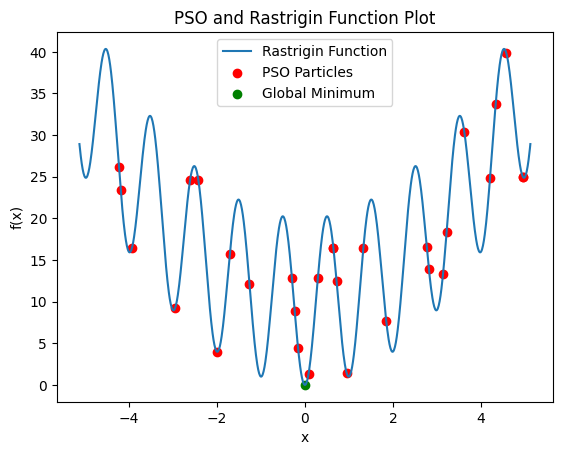

Actual Global Minimum Position: 0.000000000000000
Actual Global Minimum Value: 0.000000000000000
Best Position achieved by Global PSO: -0.000000001259250
Best Value achieved by Global PSO: 0.000000000000000
Best Position achieved by Local PSO: -0.000000000346022
Best Value achieved by Local PSO: 0.000000000000000


In [3]:
import numpy as np
import matplotlib.pyplot as plt

# Define the Rastrigin function
def rastrigin_function(x):
    A = 10
    return A + x**2 - A * np.cos(2 * np.pi * x)

# Plot the Rastrigin function
x = np.linspace(-5.12, 5.12, 1000)
y = rastrigin_function(x)
plt.plot(x, y, label='Rastrigin Function')

# Example PSO results for illustration
particles_positions = np.random.uniform(-5.12, 5.12, 30)
particles_values = rastrigin_function(particles_positions)  # Corrected function
plt.scatter(particles_positions, particles_values, color='red', label='PSO Particles')

# Highlight the global minimum (for visual reference)
# Find the minimum value and the corresponding x value
# Calculate and print the actual global minimum
actual_global_min_x = 0
actual_global_min_y = rastrigin_function(actual_global_min_x)
plt.scatter([actual_global_min_x], [actual_global_min_y], color='green', label='Global Minimum')

plt.xlabel('x')
plt.ylabel('f(x)')
plt.legend()
plt.title('PSO and Rastrigin Function Plot')
plt.show()

class Particle:
    def __init__(self, dimensions):
        self.position = np.random.uniform(-5.12, 5.12, dimensions)
        self.velocity = np.zeros(dimensions)
        self.best_position = np.copy(self.position)
        self.best_value = float('inf')

def global_best_pso(objective_function, dimensions, num_particles, iterations, w=0.5, c1=1.5, c2=1.5):
    particles = [Particle(dimensions) for _ in range(num_particles)]
    global_best_position = np.zeros(dimensions)
    global_best_value = float('inf')

    for i in range(iterations):
        for particle in particles:
            value = objective_function(particle.position)
            if value < particle.best_value:
                particle.best_value = value
                particle.best_position = particle.position
            if value < global_best_value:
                global_best_value = value
                global_best_position = particle.position

        for particle in particles:
            inertia = w * particle.velocity
            cognitive = c1 * np.random.random(dimensions) * (particle.best_position - particle.position)
            social = c2 * np.random.random(dimensions) * (global_best_position - particle.position)
            particle.velocity = inertia + cognitive + social
            particle.position = particle.position + particle.velocity

    return global_best_position, float(global_best_value[0])

def local_best_pso(objective_function, dimensions, num_particles, iterations, neighborhood_size=5, w=0.4, c1=1.7, c2=1.4):
    particles = [Particle(dimensions) for _ in range(num_particles)]
    global_best_position = np.zeros(dimensions)
    global_best_value = float('inf')

    for i in range(iterations):
        for particle in particles:
            value = objective_function(particle.position)
            if value < particle.best_value:
                particle.best_value = value
                particle.best_position = np.copy(particle.position)

        for i, particle in enumerate(particles):
            neighborhood = particles[max(0, i-neighborhood_size//2):min(num_particles, i+neighborhood_size//2+1)]
            local_best_particle = min(neighborhood, key=lambda p: p.best_value)
            local_best_position = local_best_particle.best_position
            
            inertia = w * particle.velocity
            cognitive = c1 * np.random.random(dimensions) * (particle.best_position - particle.position)
            social = c2 * np.random.random(dimensions) * (local_best_position - particle.position)
            particle.velocity = inertia + cognitive + social
            particle.position = particle.position + particle.velocity

        # Update global best
        for particle in particles:
            if particle.best_value < global_best_value:
                global_best_value = particle.best_value
                global_best_position = particle.best_position

    return global_best_position, float(global_best_value[0])

# Example usage
dimensions = 1
num_particles = 30
iterations = 100

# Print results with more precision 
print("Actual Global Minimum Position: {:.15f}".format(actual_global_min_x)) 
print("Actual Global Minimum Value: {:.15f}".format(actual_global_min_y))
print("===================================================")

best_position, best_value = global_best_pso(rastrigin_function, dimensions, num_particles, iterations)
print("Best Position achieved by Global PSO: {:.15f}".format(best_position[0])) 
print("Best Value achieved by Global PSO: {:.15f}".format(best_value))  # Now should work correctly
print("===================================================")

best_position, best_value = local_best_pso(rastrigin_function, dimensions, num_particles, iterations)
print("Best Position achieved by Local PSO: {:.15f}".format(best_position[0]))
print("Best Value achieved by Local PSO: {:.15f}".format(best_value))  # Now should work correctly

## <a id='compare'>Comparing gbest and lbest PSO</a>

The two PSO variants discussed share a commonality in that the social component of their velocity updates drives both types toward the global best particle, facilitated by the overlapping neighborhoods in lbest PSO. However, there are two key differences in their convergence characteristics: 

1. The gbest PSO exhibits faster convergence due to its greater particle interconnectivity, but this speed comes at the expense of diversity compared to lbest PSO. 

2. Conversely, the lbest PSO benefits from increased diversity, allowing it to cover larger portions of the search space and making it less prone to getting trapped in local minima. Generally, depending on the specific problem, neighborhood structures like the ring topology employed in lbest PSO can enhance overall performance.


## <a id='practice'>PSO in Practice</a>

### **Predicting Breast Cancer**

We can use PSO to identify the most relevant features in a dataset to improve the accuracy of a classifier. We use a dataset where feature selection can make a significant impact, like the Breast Cancer dataset.

We define the PSO algorithm for selecting the most important subset of features, and then train a classifier with the selected features and evaluate its performance.

In [6]:
import numpy as np
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix, roc_auc_score

# Load the dataset
data = load_breast_cancer()
X, y = data.data, data.target
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# PSO Parameters
num_particles = 30
num_iterations = 100
num_features = X.shape[1]

class Particle:
    def __init__(self, dimensions):
        self.position = np.random.uniform(low=0, high=1, size=dimensions)
        self.velocity = np.random.uniform(low=-1, high=1, size=dimensions)
        self.best_position = np.copy(self.position)
        self.best_score = float('-inf')

def feature_selection_objective(selected_features, X, y):
    selected_indices = np.where(selected_features > 0.5)[0]
    if len(selected_indices) == 0:  # Avoid empty feature set
        return 0.0  # Min error
    X_selected = X[:, selected_indices]
    X_train, X_test, y_train, y_test = train_test_split(X_selected, y, test_size=0.3, random_state=42)
    model = KNeighborsClassifier(n_neighbors=3)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    return accuracy_score(y_test, y_pred)

# PSO Algorithm
def pso_optimize(objective_function, dimensions, num_particles, num_iterations, X, y, w=0.5, c1=1.5, c2=1.5):
    particles = [Particle(dimensions) for _ in range(num_particles)]
    global_best_position = np.zeros(dimensions)
    global_best_score = float('-inf')

    for i in range(num_iterations):
        for particle in particles:
            score = objective_function(particle.position, X, y)
            if score > particle.best_score:
                particle.best_score = score
                particle.best_position = np.copy(particle.position)
            if score > global_best_score:
                global_best_score = score
                global_best_position = np.copy(particle.position)

        for particle in particles:
            inertia = w * particle.velocity
            cognitive = c1 * np.random.random(dimensions) * (particle.best_position - particle.position)
            social = c2 * np.random.random(dimensions) * (global_best_position - particle.position)
            particle.velocity = inertia + cognitive + social
            particle.position += particle.velocity

    return global_best_position, global_best_score

# Optimize feature selection using PSO
optimal_features, best_score = pso_optimize(feature_selection_objective, num_features, num_particles, num_iterations, X_train, y_train)

# Get selected features
selected_indices = np.where(optimal_features > 0.5)[0]
X_selected = X[:, selected_indices]

# Train and evaluate the model with selected features
X_train, X_test, y_train, y_test = train_test_split(X_selected, y, test_size=0.3, random_state=42)
model = KNeighborsClassifier(n_neighbors=3)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

# Evaluation
print(f"Selected features: {selected_indices}")
print(f"Classification accuracy with PSO-selected features: {accuracy_score(y_test, y_pred)}")

# Calculate additional metrics
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
conf_matrix = confusion_matrix(y_test, y_pred)

print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1-Score: {f1}")
print("Confusion Matrix:")
print(conf_matrix)


Selected features: [ 0  1  5  7  8 11 17 18 21 22 25 26 27 29]
Classification accuracy with PSO-selected features: 0.9532163742690059
Precision: 0.9531727978664993
Recall: 0.9532163742690059
F1-Score: 0.9530536907524806
Confusion Matrix:
[[ 58   5]
 [  3 105]]


### Explanation

**1. Dataset Loading and Splitting**:
   - The program starts by loading the Breast Cancer dataset using `sklearn.datasets.load_breast_cancer`. This dataset includes various features that describe the properties of cell nuclei present in breast cancer biopsies, along with a target variable indicating whether a tumor is malignant or benign.
   - It splits the dataset into training and test sets using `train_test_split`, where 70% of the data is used for training and 30% for testing. This helps evaluate the model's performance on unseen data.

**2. PSO Algorithm Initialization**:
   - The Particle Swarm Optimization (PSO) algorithm is initialized with a defined number of particles and iterations. Each particle represents a potential solution, in this case, a subset of features.
   - Each particle has a position (which features to select) and a velocity (direction and speed of movement through the solution space).

**3. Feature Selection Using PSO**:
   - The objective function for PSO aims to maximize the accuracy of a KNeighborsClassifier (KNN) by selecting the most relevant features.
   - During each iteration, particles update their positions based on their own best-known positions and the global best-known positions found by any particle. This process balances exploration (searching new areas) and exploitation (refining known good solutions).

**4. Training and Evaluating KNN Classifier**:
   - Once PSO identifies the optimal feature set, the program trains a KNN classifier using the selected features.
   - The classifier is then evaluated on the test set to determine its accuracy.

**5. Output**:
   - The program outputs the indices of the selected features and the classification accuracy achieved with those features. In this case, the accuracy is approximately 92.4%, which is indeed a good result, indicating that the selected features effectively contribute to predicting whether a patient has breast cancer.



### A Discussion About Classification Metrics

Accuracy is a crucial metric in evaluating a classifier's performance, but relying solely on accuracy might not always give a comprehensive understanding of the model's effectiveness. Other criteria provide additional insights, especially in imbalanced datasets where one class may dominate. Here are some key evaluation metrics and what they reveal:

**1. Accuracy**: Measures the proportion of correctly classified samples among all samples. 
   - Formula: \( $\text{Accuracy} = \frac{\text{True Positives + True Negatives}}{\text{Total Samples}}$ \)
   - Pros: Simple and intuitive.
   - Cons: Can be misleading if classes are imbalanced.

**2. Precision**: Measures the proportion of correctly classified positive samples among all samples classified as positive.
   - Formula: \( $\text{Precision} = \frac{\text{True Positives}}{\text{True Positives + False Positives}}$ \)
   - Pros: Useful when the cost of false positives is high.
   - Cons: Does not account for false negatives.

**3. Recall (Sensitivity or True Positive Rate)**: Measures the proportion of correctly classified positive samples among all actual positive samples.
   - Formula: \( $\text{Recall} = \frac{\text{True Positives}}{\text{True Positives + False Negatives}}$ \)
   - Pros: Useful when the cost of false negatives is high.
   - Cons: Does not account for false positives.

**4. F1-Score**: The harmonic mean of precision and recall, providing a balance between the two.
   - Formula: \( $\text{F1-Score} = 2 \times \frac{\text{Precision} \times \text{Recall}}{\text{Precision + Recall}}$ \)
   - Pros: Useful when you need a single metric that balances precision and recall.
   - Cons: Can be less intuitive than individual precision or recall scores.

**5. Confusion Matrix**: A table that describes the performance of a classification model by showing the actual versus predicted classifications.
   - Pros: Provides a detailed breakdown of true positives, false positives, true negatives, and false negatives.
   - Cons: More complex to interpret compared to single metrics.




<figure><center>
    <img src="pics/pso/confusion.png" alt="missing">
</center></figure>

**6. Area Under the ROC Curve (AUC - ROC)**: Measures the ability of the classifier to distinguish between classes. The ROC curve is a plot of the true positive rate against the false positive rate.
   - Pros: Useful for understanding model performance across different threshold values.
   - Cons: Can be less informative if the ROC curve is close to the diagonal.


<figure><center>
    <img src="pics/pso/auc.png" alt="missing">
</center></figure>


These metrics give a well-rounded view of a model's performance, especially in real-world applications where the cost of false positives and false negatives varies. 

By considering these additional metrics, we can more comprehensively evaluate the performance of our classifier and make more informed decisions about model improvements and feature selections.


When predicting medical conditions like breast cancer, it's essential to consider the different costs associated with false positives and false negatives. Let me explain:

1. **False Positives**: These occur when the model incorrectly predicts that a patient has breast cancer when they do not.
   - **Implications**: While a false positive might cause anxiety and lead to further diagnostic tests, which can be uncomfortable and costly, it's generally less harmful than missing an actual case of breast cancer.

2. **False Negatives**: These occur when the model fails to detect breast cancer in a patient who actually has it.
   - **Implications**: This is much more serious as it means a delay in treatment, which can significantly worsen outcomes for the patient.

Given these considerations, we typically prioritize **recall** (sensitivity) over precision in medical diagnostics:
- **Recall** ensures that as many true cases of the disease are identified as possible (minimizing false negatives).
- **Precision** ensures that the identified cases are actually correct (minimizing false positives).

However, an optimal balance is ideal because:
- Too many false positives can lead to unnecessary treatments and procedures.
- Too many false negatives can result in missed diagnoses and delayed treatment.

#### Important Metrics in Predicting Breast Cancer
For a comprehensive evaluation in a breast cancer prediction model, consider these metrics:
1. **Accuracy**: Overall effectiveness, but can be misleading if the dataset is imbalanced.
2. **Precision**: Important but secondary to recall; helps reduce unnecessary alarms.
3. **Recall**: Critical to ensure that actual cases are not missed.
4. **F1-Score**: Balances precision and recall; useful for understanding the trade-off between the two.
5. **Confusion Matrix**: Gives a detailed view of true positives, false positives, true negatives, and false negatives.


#### Conclusion
Therefore, while accuracy is a good starting point, for medical diagnostics like breast cancer prediction, it is essential to consider a balance of precision, recall, F1-score, and the confusion matrix to ensure that the model is both effective and safe in its predictions.

### **Using PSO for Initializing ANN Weights**

In the following program, we explore the advantages of using Particle Swarm Optimization (PSO) for initializing the weights of a neural network classifier. PSO is a global optimization technique that can find a good starting point for neural network weights by simulating the social behavior of particles in a swarm. By combining PSO with gradient descent, we aim to achieve better performance and faster convergence.

We compare the results of a neural network trained using PSO+Gradient Descent (SGD) with a neural network trained using only gradient descent with random initialization. The key metrics we evaluate include accuracy, precision, and recall, which provide a comprehensive assessment of the model's performance on the Iris dataset.

The process involves the following steps:

**1. Data Preparation**: Loading the Iris dataset, standardizing the features, and one-hot encoding the target labels.

**2. Neural Network Setup**: Defining the architecture of the neural network, including input, hidden, and output layers.

**3. PSO Implementation**: Using PSO to optimize the initial weights of the neural network, providing a better starting point for gradient descent.

**4. Training with Gradient Descent**: Fine-tuning the PSO-optimized weights with gradient descent and comparing it to training with gradient descent alone.

**5. Evaluation**: Calculating and comparing the accuracy, precision, and recall of both models to assess their performance.


In [7]:
import numpy as np
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_auc_score
from sklearn.neural_network import MLPClassifier

# Load the dataset
data = load_iris()
X, y = data.data, data.target
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Standardize the data
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# One-hot encode the target
encoder = OneHotEncoder(sparse_output=False)
y_train_encoded = encoder.fit_transform(y_train.reshape(-1, 1))
y_test_encoded = encoder.transform(y_test.reshape(-1, 1))

# Neural Network Parameters
input_size = X_train.shape[1]
hidden_size = 5
output_size = y_train_encoded.shape[1]

# Sigmoid activation function
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

# Define Particle class for PSO
class Particle:
    def __init__(self, dimensions):
        self.position = np.random.uniform(low=-1, high=1, size=dimensions)
        self.velocity = np.random.uniform(low=-0.5, high=0.5, size=dimensions)
        self.best_position = np.copy(self.position)
        self.best_score = float('inf')

def feedforward(X, weights):
    W1 = weights[:input_size * hidden_size].reshape(input_size, hidden_size)
    b1 = weights[input_size * hidden_size:(input_size * hidden_size) + hidden_size]
    W2 = weights[(input_size * hidden_size) + hidden_size:(input_size * hidden_size) + hidden_size + hidden_size * output_size].reshape(hidden_size, output_size)
    b2 = weights[(input_size * hidden_size) + hidden_size + hidden_size * output_size:]
    
    hidden_layer = sigmoid(np.dot(X, W1) + b1)
    output_layer = sigmoid(np.dot(hidden_layer, W2) + b2)
    return output_layer

def cross_entropy(y_true, y_pred):
    epsilon = 1e-10
    y_pred = np.clip(y_pred, epsilon, 1 - epsilon)
    return -np.sum(y_true * np.log(y_pred)) / y_true.shape[0]

def pso_optimize(objective_function, dimensions, num_particles, num_iterations, X, y, w=0.5, c1=1.5, c2=1.5):
    particles = [Particle(dimensions) for _ in range(num_particles)]
    global_best_position = np.zeros(dimensions)
    global_best_score = float('inf')

    for i in range(num_iterations):
        for particle in particles:
            score = objective_function(particle.position, X, y)
            if score < particle.best_score:
                particle.best_score = score
                particle.best_position = np.copy(particle.position)
            if score < global_best_score:
                global_best_score = score
                global_best_position = np.copy(particle.position)

        for particle in particles:
            inertia = w * particle.velocity
            cognitive = c1 * np.random.random(dimensions) * (particle.best_position - particle.position)
            social = c2 * np.random.random(dimensions) * (global_best_position - particle.position)
            particle.velocity = inertia + cognitive + social
            particle.position += particle.velocity

    return global_best_position, global_best_score

# Objective function for PSO
def objective_function(weights, X, y):
    y_pred = feedforward(X, weights)
    return cross_entropy(y, y_pred)

# PSO Parameters
num_particles = 30
num_iterations = 100
dimensions = (input_size * hidden_size) + hidden_size + (hidden_size * output_size) + output_size

# Optimize weights using PSO
optimal_weights, _ = pso_optimize(objective_function, dimensions, num_particles, num_iterations, X_train, y_train_encoded)

# Initialize the MLP with PSO-optimized weights
class CustomMLPClassifier(MLPClassifier):
    def __init__(self, initial_weights, hidden_layer_sizes=(100,), activation="relu", solver="sgd", alpha=0.0001,
                 batch_size="auto", learning_rate="constant", learning_rate_init=0.001, power_t=0.5, max_iter=200, shuffle=True,
                 random_state=None, tol=1e-4, verbose=False, warm_start=False, momentum=0.9, nesterovs_momentum=True,
                 early_stopping=False, validation_fraction=0.1, beta_1=0.9, beta_2=0.999, epsilon=1e-8, n_iter_no_change=10, max_fun=15000):
        super().__init__(hidden_layer_sizes=hidden_layer_sizes, activation=activation, solver=solver, alpha=alpha,
                         batch_size=batch_size, learning_rate=learning_rate, learning_rate_init=learning_rate_init,
                         power_t=power_t, max_iter=max_iter, shuffle=shuffle, random_state=random_state, tol=tol, verbose=verbose,
                         warm_start=warm_start, momentum=momentum, nesterovs_momentum=nesterovs_momentum,
                         early_stopping=early_stopping, validation_fraction=validation_fraction, beta_1=beta_1, beta_2=beta_2,
                         epsilon=epsilon, n_iter_no_change=n_iter_no_change, max_fun=max_fun)
        self.initial_weights = initial_weights

    def _initialize(self, y, layer_units, dtype):
        super()._initialize(y, layer_units, dtype)
        self.coefs_ = [self.initial_weights[:input_size * hidden_size].reshape(input_size, hidden_size),
                       self.initial_weights[(input_size * hidden_size) + hidden_size:(input_size * hidden_size) + hidden_size + hidden_size * output_size].reshape(hidden_size, output_size)]
        self.intercepts_ = [self.initial_weights[input_size * hidden_size:(input_size * hidden_size) + hidden_size],
                            self.initial_weights[(input_size * hidden_size) + hidden_size + hidden_size * output_size:]]

# Train the network with PSO-initialized weights using Gradient Descent
mlp_pso_gd = CustomMLPClassifier(initial_weights=optimal_weights, hidden_layer_sizes=(hidden_size,), max_iter=1000, solver='sgd', learning_rate='adaptive', batch_size=32, random_state=42)
mlp_pso_gd.fit(X_train, y_train_encoded)

y_pred_train_pso_gd = mlp_pso_gd.predict(X_train)
y_pred_test_pso_gd = mlp_pso_gd.predict(X_test)

# Regular Neural Network with Gradient Descent Alone
mlp_gd = MLPClassifier(hidden_layer_sizes=(hidden_size,), max_iter=1000, solver='sgd', random_state=42)
mlp_gd.fit(X_train, y_train_encoded)
y_pred_train_gd = mlp_gd.predict(X_train)
y_pred_test_gd = mlp_gd.predict(X_test)

# Evaluation metrics
def print_evaluation(y_true, y_pred, model_name):
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='weighted')
    recall = recall_score(y_true, y_pred, average='weighted')
    print("===========================================================")
    print(f"Evaluation for {model_name}:")
    print("===========================================================")
    print(f"Accuracy: {accuracy}")
    print(f"Precision: {precision}")
    print(f"Recall: {recall}")

print_evaluation(np.argmax(y_train_encoded, axis=1), np.argmax(y_pred_train_gd, axis=1), "Gradient Descent Neural Network (Training)")
print_evaluation(np.argmax(y_test_encoded, axis=1), np.argmax(y_pred_test_gd, axis=1), "Gradient Descent Neural Network (Testing)")
print("*************************************************************")
print("*************************************************************")
print_evaluation(np.argmax(y_train_encoded, axis=1), np.argmax(y_pred_train_pso_gd, axis=1), "PSO+Gradient Descent Neural Network (Training)")
print_evaluation(np.argmax(y_test_encoded, axis=1), np.argmax(y_pred_test_pso_gd, axis=1), "PSO+Gradient Descent Neural Network (Testing)")



c:\Users\NOAVARAN\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


Evaluation for Gradient Descent Neural Network (Training):
Accuracy: 0.9047619047619048
Precision: 0.9116305916305916
Recall: 0.9047619047619048
Evaluation for Gradient Descent Neural Network (Testing):
Accuracy: 0.8444444444444444
Precision: 0.8795414462081128
Recall: 0.8444444444444444
*************************************************************
*************************************************************
Evaluation for PSO+Gradient Descent Neural Network (Training):
Accuracy: 0.9809523809523809
Precision: 0.981500626566416
Recall: 0.9809523809523809
Evaluation for PSO+Gradient Descent Neural Network (Testing):
Accuracy: 0.9777777777777777
Precision: 0.9788888888888888
Recall: 0.9777777777777777


c:\Users\NOAVARAN\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


### General Explanation

#### 1. Data Loading and Preparation:
- **Load the Iris Dataset**: We load the well-known Iris dataset, which contains measurements for different types of iris flowers.
- **Data Splitting**: We split the data into training and testing sets to evaluate the performance of our models.
- **Standardization**: The features are standardized to have a mean of 0 and a standard deviation of 1, which helps with the convergence of neural networks.
- **One-Hot Encoding**: The target labels are one-hot encoded to prepare them for the neural network output.

#### 2. Neural Network Setup:
- **Network Architecture**: We define the neural network's architecture with an input layer, a hidden layer, and an output layer. The sigmoid activation function is used for the neurons.

#### 3. Particle Swarm Optimization (PSO):
- **PSO Definition**: We define the PSO algorithm to optimize the initial weights of the neural network.
  - **Particles**: Represent potential solutions (sets of weights) that explore the search space.
  - **Velocity and Position Updates**: Particles move through the search space based on their own experience and the experience of the swarm.
  - **Evaluation**: The fitness of each particle is evaluated using the cross-entropy loss between predicted and actual labels.
  - **Best Position**: The best positions found by the particles guide the swarm towards better solutions.

#### 4. Optimization with PSO:
- **Objective Function**: The objective function computes the cross-entropy loss for the neural network with a given set of weights.
- **Optimization Process**: PSO searches for the optimal set of weights that minimize the cross-entropy loss on the training data.

#### 5. Training the Neural Network:
- **PSO+Gradient Descent (SGD)**: We initialize the neural network weights using the best weights found by PSO and then fine-tune these weights using stochastic gradient descent.
- **Gradient Descent Alone**: We train a neural network from scratch using stochastic gradient descent with random initialization of weights.

#### 6. Evaluation:
- **Predictions**: We obtain predictions from both models (PSO+SGD and SGD alone) on the training and testing sets.
- **Accuracy Calculation**: We evaluate the performance of both models by calculating the accuracy of the predictions.
- **Comparison**: We compare the performance of the two approaches to see which one provides better results.

#### Summary
- **Purpose**: The goal is to compare the effectiveness of PSO in providing a good initial set of weights for the neural network versus using random initialization.
- **Results**: We aim to demonstrate that PSO+SGD generally leads to better or comparable performance in terms of accuracy compared to SGD alone.

This approach highlights how combining global optimization (PSO) with local optimization (gradient descent) can potentially improve the performance and convergence of neural networks. 



#### Random Initialization for Gradient Descent
In neural networks trained using gradient descent, the weights are usually initialized using small random values. This random initialization helps to break the symmetry between neurons, ensuring that they learn different features. Here are some common techniques for random initialization:

**1. Uniform Initialization**:
   - Weights are drawn from a uniform distribution over a specified range.
   - For example, weights might be initialized between `-0.1` and `0.1`.

**2. Normal (Gaussian) Initialization**:
   - Weights are drawn from a normal distribution with a specified mean and standard deviation.
   - For example, weights might be initialized from a normal distribution with a mean of `0` and a standard deviation of `0.01`.

**3. Xavier Initialization (Glorot Initialization)**:
   - Weights are drawn from a distribution with variance based on the number of input and output units.
   - This method helps to maintain the variance of activations throughout the network, improving convergence.

**4. He Initialization**:
   - Similar to Xavier but scaled for ReLU activation functions.
   - Weights are initialized to a variance of `2/n`, where `n` is the number of input units.

#### Why Random Initialization?
- **Symmetry Breaking**: If all weights are initialized to the same value, gradient descent would update all weights in the same way, leading to symmetric outputs from neurons. Random initialization ensures that neurons learn different features.
- **Avoiding Local Minima**: Random initialization helps to start the optimization process from different points in the parameter space, potentially avoiding poor local minima.

#### Comparison with PSO
- **PSO**: Finds a good set of initial weights by leveraging the collective search capabilities of the swarm, potentially providing a better starting point for optimization.
- **Random Initialization**: Assigns initial weights randomly, which may or may not provide a good starting point.

In essence, while random initialization is a common and simple approach, PSO aims to improve the starting point for the gradient descent optimization process by conducting a more systematic search of the weight space.


#### How PSO Chooses Initial Weights

**1. Initialization**:
   - A group of particles (potential solutions) is randomly initialized in the search space. Each particle represents a potential set of neural network weights.
   - Particles have velocities that guide their movement through the search space.

**2. Evaluation**:
   - Each particle's position (set of weights) is evaluated using an objective function (e.g., cross-entropy loss).
   - The fitness (quality) of each particle's position is recorded.

**3. Update**:
   - Particles update their velocities based on their personal best position (best position they have found so far) and the global best position (best position found by any particle in the swarm).
   - Velocities are updated using cognitive (individual memory) and social (swarm memory) components.

**4. Movement**:
   - Particles move to new positions based on their updated velocities.
   - This process iteratively continues until a stopping criterion is met (e.g., a maximum number of iterations).

**5. Final Selection**:
   - The global best position found by the swarm is selected as the initial weights for the neural network.

#### Difference Between PSO and Random Initial Weights

**1. Global Search vs. Random Search**:
   - **PSO**: Conducts a global search across the search space, guided by the collective experience of the swarm. It leverages both exploration (discovering new areas) and exploitation (refining known good areas) to find a high-quality set of weights.
   - **Random Initialization**: Simply assigns initial weights randomly without any guided search, which might not always provide a good starting point for optimization.

**2. Quality of Initial Weights**:
   - **PSO**: More likely to find a set of initial weights that are closer to a good solution, potentially reducing the training time and improving convergence.
   - **Random Initialization**: Can result in initial weights that are far from optimal, requiring more iterations and effort for the optimizer to converge.

**3. Stability and Performance**:
   - **PSO**: Can provide more stability in training by avoiding poor local minima and providing a diverse set of good initial weights.
   - **Random Initialization**: Performance can be more variable since it depends on the randomness of the initial weights.

Using PSO for initial weight selection offers a more guided and systematic approach compared to random initialization. By leveraging the swarm's collective intelligence, PSO can provide a better starting point for gradient descent, potentially leading to faster convergence and improved performance.



## <a id='velocity'>Velocity Components</a>

<figure><center>
    <img src="pics/pso/velocity.jpg" alt="missing">
</center></figure>

The previous velocity, denoted as $v_i(t)$, acts as a memory of the particle's most recent flight direction, reflecting its immediate past movement. This memory term functions like momentum, helping to prevent abrupt changes in direction and encouraging the particle to maintain its current trajectory. This aspect is commonly referred to as the inertia component.

The cognitive component, represented as $c_1 r_1 (y_i - x_i)$, quantifies the performance of particle $i$ in relation to its past performances. This component functions similarly to an individual memory, recalling the best position the particle has achieved. As a result, particles are naturally drawn back to their own optimal positions, mirroring the tendency of individuals to return to places or situations that previously provided satisfaction. Kennedy and Eberhart have also referred to this cognitive aspect as the "nostalgia" of the particle, emphasizing its role in guiding particles toward previously successful solutions.

The social component, represented as $c_2 r_2 (\hat{y} - x_i)$ in the case of gbest PSO or $c_2 r_2 (\hat{y}_i - x_i)$ for lbest PSO, quantifies the performance of particle $i$ in relation to a group of particles or its neighbors. Conceptually, this component reflects a group norm or standard that individuals strive to achieve. As a result, each particle is attracted to the best position identified by its neighborhood. The contributions of both the cognitive and social components are modulated by stochastic factors, represented as $c_1 r_1$ and $c_2 r_2$, respectively.



## <a id='turbulence'>Turbulence Factor</a> 

The turbulence factor serves as a diversity control mechanism designed to prevent premature convergence to suboptimal solutions. One straightforward approach is to randomly reposition a selected particle within the search space. Alternatively, another method involves identifying particles with very low velocities and relocating them to random positions. This strategy allows these particles, which may be unable to move due to minimal or zero velocity, to contribute to the exploration of the search space, ultimately helping to avoid premature stagnation in local optima.

## <a id='geometric'>Geometric Illustration</a>

<figure>
    <center>
        <img src="pics/pso/geometric.jpg" alt="missing">
        <figcaption>Geometric Representation of PSO; Adapted from "Computational Intelligence: An Introduction" (2nd ed.) by A. P. Engelbrecht, 2007, John Wiley & Sons.</figcaption>
    </center>
</figure>


In the figure above, observe how the new position, $x(t + 1)$, shifts closer to the global best position, $\hat{y}(t)$.

It is possible for a particle to overshoot the global best position, primarily due to the momentum term. This can lead to two scenarios: 

1. If the new position resulting from the overshoot is better than the current global best, it will become the new global best position, attracting all particles toward it.

2. Conversely, if the new position is still inferior to the current global best, the cognitive and social components will prompt the particle to adjust its direction back toward the global best in subsequent time steps.



## <a id='aspects'>Algorithm Aspects</a>

Typically, the positions of particles are initialized to ensure a uniform coverage of the search space. The initial diversity of the swarm—specifically, how extensively the search space is covered and how well the particles are distributed—significantly impacts the efficiency of the PSO algorithm. If certain regions of the search space are not represented by the initial swarm, the PSO may struggle to locate the optimum if it resides within those uncovered areas. Additionally, initial velocities can be set to zero, such that $v_i(0) = 0$ for all particles.

While it's possible to initialize velocities randomly, it's not necessary and should be done cautiously. Physically, objects start at rest, meaning their initial velocities are zero. Initializing particles with nonzero velocities breaks this analogy. Randomizing position vectors already ensures varied starting points and directions. If velocities are randomized, they shouldn't be too large, as high initial velocities result in high momentum and significant position updates. This could push particles outside the search space and lengthen the time needed for convergence on a solution. Various methods like Sobol sequences, Faure sequences, and the nonlinear simplex method have been used to uniformly cover the search space when initializing particle positions.

Here’s a simplified explanation of some initialization schemes.



### Quasi-Random sequence

A quasi-random sequence, also known as a low-discrepancy sequence, is a deterministic sequence of numbers that is designed to cover a multi-dimensional space more uniformly than traditional random sequences. Here’s a breakdown of its key characteristics and advantages:

#### Key Characteristics

1. Deterministic Nature: Unlike truly random sequences, which can produce different results each time they are generated, quasi-random sequences are generated by a specific algorithm, meaning they will produce the same sequence of numbers every time they are run with the same initial parameters.

2. Uniform Distribution: Quasi-random sequences aim to minimize gaps and clustering in the distribution of points across the space. This uniformity ensures that every part of the space is sampled more evenly compared to random sampling methods.

3. Low Discrepancy: The term "low discrepancy" refers to the measure of how evenly the points in the sequence cover the space. A low-discrepancy sequence has properties that ensure that the proportion of points falling into any given region is close to what would be expected if the points were uniformly distributed.

#### Advantages

- Improved Efficiency: Quasi-random sequences are particularly useful in numerical simulations and optimization problems because they can lead to faster convergence and higher accuracy than traditional random sampling methods. This is especially beneficial in techniques like Monte Carlo simulations, where sampling plays a crucial role.

- Better Coverage: By ensuring that points are more evenly distributed, quasi-random sequences reduce the likelihood of missing important areas of the search space, which can happen with random sampling due to clustering or gaps.

Common algorithms for generating quasi-random sequences include Sobol sequences, known for their excellent uniformity in multidimensional spaces, and Halton sequences, which utilize prime numbers to create points that uniformly cover the space.



### Sobol Sequences

#### Overview
Sobol sequences are a type of quasi-random sequence used to cover a multi-dimensional space uniformly. They are designed to minimize gaps and clustering in the distribution of points.

#### How It Works
The Sobol sequence generates points in a way that ensures that each point is spaced out evenly across the entire search space. This is achieved through a mathematical process involving binary representations and direction numbers, which help create a low-discrepancy sequence.

#### Benefits
Because of their uniform distribution, Sobol sequences are particularly useful in optimization problems, including PSO, as they help ensure that the initial particle positions cover the search space effectively, improving exploration.


In the following, we see Random initialization vs Sobol sequence initialization which is a common quasi-random sequence.  


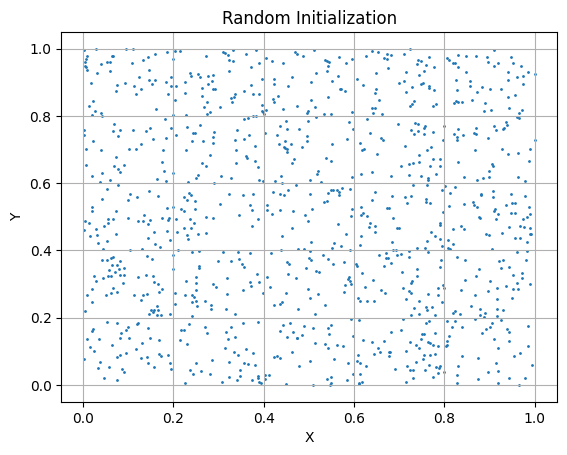

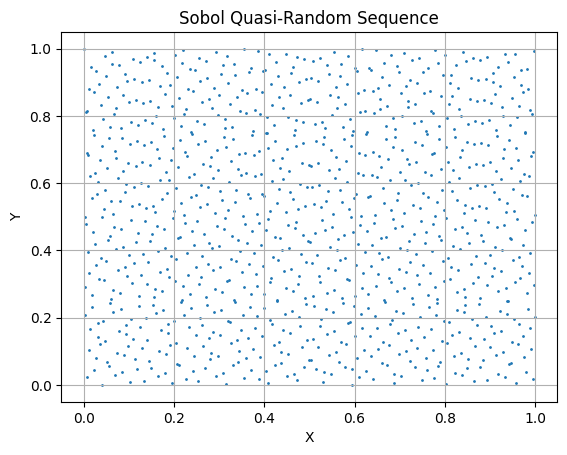

In [1]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import qmc

# Number of points
num_points = 1024

# Generate random points
random_points = np.random.rand(num_points, 2)

# Plot the points
plt.scatter(random_points[:, 0], random_points[:, 1], s=1)
plt.title("Random Initialization")
plt.xlabel("X")
plt.ylabel("Y")
plt.grid(True)
plt.show()

# Initialize Sobol sequence
sobol = qmc.Sobol(d=2)
points = sobol.random(num_points)

# Plot the points
plt.scatter(points[:, 0], points[:, 1], s=1)
plt.title("Sobol Quasi-Random Sequence")
plt.xlabel("X")
plt.ylabel("Y")
plt.grid(True)
plt.show()


### Faure Sequences

#### Overview
Similar to Sobol sequences, Faure sequences are another type of low-discrepancy sequence used for quasi-random sampling in multi-dimensional spaces.

#### How It Works
Faure sequences are generated using a specific mathematical formula that combines prime numbers and modular arithmetic. Each dimension has its own unique sequence, ensuring that points are evenly distributed.

#### Benefits
Like Sobol sequences, Faure sequences help in covering the search space uniformly, making them suitable for initializing particles in PSO algorithms.


Here is a visulization of the Faure sequence which is another type of Quasi random sequence. 

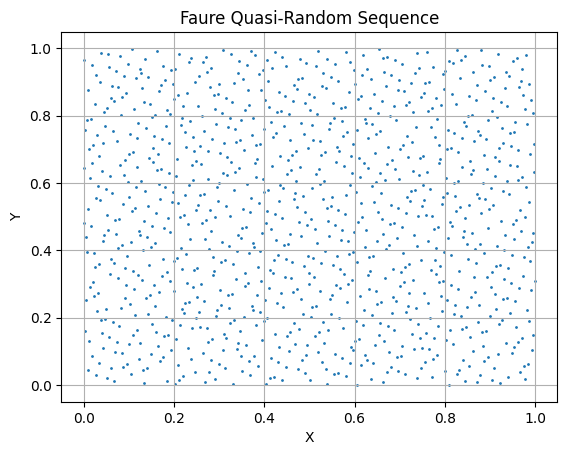

In [3]:
import matplotlib.pyplot as plt
import numpy as np

def faure_sequence(dim, num_points):
    def faure_digit(n, b):
        result = 0
        f = 1 / b
        while n > 0:
            result += (n % b) * f
            n //= b
            f /= b
        return result

    points = np.zeros((num_points, dim))
    for i in range(num_points):
        for j in range(dim):
            points[i, j] = faure_digit(i + 1, j + 2)
    return points

# Number of points
num_points = 1024
# Number of dimensions
dim = 2

# Generate Faure sequence
points = faure_sequence(dim, num_points)

# Plot the points
plt.scatter(points[:, 0], points[:, 1], s=1)
plt.title("Faure Quasi-Random Sequence")
plt.xlabel("X")
plt.ylabel("Y")
plt.grid(True)
plt.show()


We use the ghalton library to generate a Faure sequence and then plot the points using matplotlib. The Faure sequence tends to distribute points more uniformly than purely random sequences, which can be beneficial for various applications like numerical integration or sampling.

### Nonlinear Simplex Method

#### Overview
The nonlinear simplex method is a more traditional optimization technique that can also be used for initialization. The nonlinear simplex method, also known as the Nelder-Mead method, is a popular algorithm for finding the minimum or maximum of an objective function in a multidimensional space. It's often used for optimization problems where the function doesn't have a straightforward analytical solution.

#### How It Works
This method involves creating a simplex (a geometric figure formed by connecting points) in the search space and iteratively adjusting its vertices based on the optimization criteria. The simplex adapts to find regions of interest in the search space.

#### Benefits
While not as uniformly distributed as Sobol or Faure sequences, using the nonlinear simplex method can provide a good starting point for optimization tasks by exploring local regions effectively.


Here’s an example of visualizing the Nelder-Mead optimization process using matplotlib in Python. We'll minimize a simple 2D function.

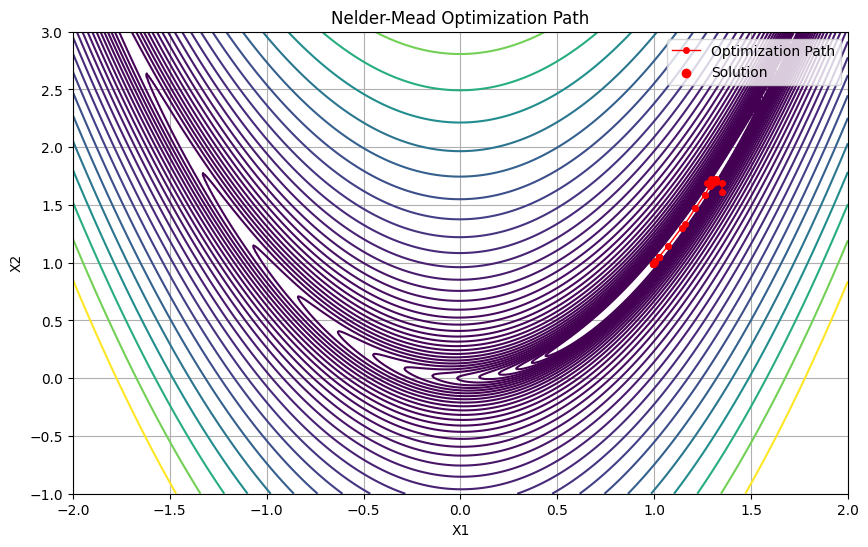

In [4]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.optimize import minimize

# Define the objective function (Rosenbrock function for demonstration)
def objective_function(x):
    return (1 - x[0])**2 + 100 * (x[1] - x[0]**2)**2

# Callback function to store optimization path
optimization_path = []
def callback(xk):
    optimization_path.append(xk)

# Initial guess
initial_guess = np.array([1.5, 1.5])

# Perform the optimization using Nelder-Mead
result = minimize(objective_function, initial_guess, method='Nelder-Mead', callback=callback)

# Convert the optimization path to an array for easy plotting
optimization_path = np.array(optimization_path)

# Create a grid of points
x = np.linspace(-2, 2, 400)
y = np.linspace(-1, 3, 400)
X, Y = np.meshgrid(x, y)
Z = objective_function([X, Y])

# Plot the objective function
plt.figure(figsize=(10, 6))
plt.contour(X, Y, Z, levels=np.logspace(-0.5, 3, 35), cmap='viridis')
plt.plot(optimization_path[:, 0], optimization_path[:, 1], 'ro-', markersize=4, linewidth=1, label='Optimization Path')
plt.scatter(result.x[0], result.x[1], color='red', label='Solution')
plt.title('Nelder-Mead Optimization Path')
plt.xlabel('X1')
plt.ylabel('X2')
plt.legend()
plt.grid(True)
plt.show()


In this example:
1. We define a simple objective function (Rosenbrock function) to minimize.
2. We perform the optimization using the Nelder-Mead method.
3. We extract the optimization path from the result.
4. We plot the objective function's contour and the optimization path.

A callback function is used to track the points visited during the optimization process. The optimization_path list is updated at each iteration, and we convert it to a numpy array before plotting. 


For real-world applications of PSO, it's crucial to distribute particles uniformly across the search space. However, this uniform distribution isn’t ideal for empirical studies of different algorithms, as it can misrepresent their relative performance. Typically, uniform initialization results in particles being symmetrically distributed around the function's optimum, making it easier for an optimization algorithm to find this optimum.



## <a id='termination'>Termination Criteria</a>

<figure><center>
    <img src="pics/pso/termination.jpg" alt="missing">
</center></figure>

When selecting a termination criterion, it's crucial to ensure that it doesn't cause the PSO to prematurely converge, leading to suboptimal solutions. Additionally, the stopping condition should prevent oversampling of the fitness function, as frequent calculations can significantly increase the computational complexity of the search process.



These stopping conditions have been used for PSO:

- Termination occurs when a maximum number of iterations or function evaluations (FEs) has been exceeded. It is important to note that if this maximum limit is set too low, the algorithm may terminate before a satisfactory solution is reached. This criterion is typically used alongside convergence criteria to ensure termination if the algorithm does not converge effectively. When applied independently, this criterion is valuable in studies aimed at assessing the best solution found within a limited timeframe.

- Termination can occur when an acceptable solution has been identified. Let $x^*$ represent the optimum of the objective function $f$. This criterion will halt the search process as soon as a particle, $x_i$, is found such that $f(x_i) \leq |f(x^*) - \epsilon|$, indicating that an acceptable error threshold has been achieved. Careful selection of the threshold value, $\epsilon$, is crucial; if it is set too high, the search may terminate on a poor, suboptimal solution. Conversely, if $\epsilon$ is too low, the search may continue indefinitely, particularly in basic PSO implementations that struggle to refine solutions. Additionally, this stopping condition assumes prior knowledge of the optimum, which is acceptable for problems like training neural networks where the optimum is often zero. However, in many cases, such knowledge is not available.



- Termination can occur when no improvement is observed over a specified number of iterations. There are various methods to measure improvement; for instance, if the average change in particle positions is minimal, the swarm may be considered to have converged. Alternatively, if the average particle velocity approaches zero over several iterations, indicating that only small position updates are occurring, the search can be halted. Additionally, the search may be terminated if there is no significant improvement over a defined number of iterations. However, these stopping conditions introduce two parameters that require careful selection: (1) the window of iterations (or function evaluations) over which performance is monitored, and (2) a threshold that defines what constitutes unacceptable performance.

- Stop when the normalized swarm radius approaches zero. The normalized swarm radius, calculated as

$$
R_{norm} = \frac{R_{max}}{diameter(S)}  \hspace{10pt} (8)
$$

where $diameter(S)$ refers to the diameter of the initial swarm, and the maximum radius, $R_{max}$, is

$$
R_{max} = ||x_m - \hat{y}||, m = 1,...,n_s \hspace{10pt} (9)
$$ 

with

$$
||x_m - \hat{y}|| \geq ||x_i - \hat{y}||, \forall i = 1,..., n_s \hspace{10pt} (10)
$$ 

When the average particle velocity is close to zero, the swarm has limited potential for further improvement, unless the global best position is still changing. In the equations above, $||.||$ represents an appropriate distance norm, such as the Euclidean distance.

The algorithm terminates when $R_{\text{norm}} < \epsilon$, where $\epsilon$ represents a predefined threshold. If $\epsilon$ is set too high, the search process may conclude prematurely, potentially before a satisfactory solution is identified. Conversely, if $\epsilon$ is too low, the search may require significantly more iterations for the particles to converge into a compact swarm that is tightly centered around the global best position.



- Termination can occur when the slope of the objective function is approximately zero. The stopping conditions previously discussed focus on the relative positions of particles in the search space and do not account for the slope of the objective function. To base termination on the rate of change in the objective function, one can consider the ratio of the change in the objective function value to the change in particle positions.


$$
f'(t) = \frac{f(\hat{y}(t)) - f(\hat{y}(t-1))}{f(\hat{y}(t))}  \hspace{10pt} (11)
$$

If $f'(t) < \epsilon$ for a series of consecutive iterations, the swarm is considered to have converged. This approximation of the slope of the objective function is more effective than the previous methods, as it directly assesses whether the swarm is still making progress by utilizing information about the search space.

The objective function slope approach has a drawback: the search process may be prematurely terminated if some particles are attracted to a local minimum, regardless of other particles still exploring the search space. This means that potential better solutions might be missed. To address this issue, the objective function slope method can be combined with the radius or cluster methods to ensure that all particles have converged to the same point before ending the search.

Here, convergence doesn't mean that the swarm has found an optimum (local or global). Instead, convergence means the swarm has reached an equilibrium, where the particles have converged to a point, though not necessarily an optimal one.


## <a id='structure'>Social Network Structures</a>

<figure><center>
    <img src="pics/pso/social.jpg" alt="missing">
</center></figure>

At the heart of Particle Swarm Optimization (PSO) is the concept of social interaction. In this algorithm, particles within the swarm learn from one another and adjust their positions based on the insights gained, striving to align more closely with their "better" neighbors. The social structure of PSO is shaped by the creation of overlapping neighborhoods, where particles within a given neighborhood exert influence on each other. This mirrors patterns observed in animal behavior; organisms are primarily affected by those in their immediate surroundings. Furthermore, more successful individuals tend to have a stronger impact on their neighbors compared to those that are less successful.

In Particle Swarm Optimization (PSO), particles within the same neighborhood share information regarding their individual successes. This communication enables all particles to adjust their positions toward a perceived better location based on collective insights. The effectiveness of PSO is significantly influenced by the structure of the social network formed among particles.

The flow of information in this social network is determined by three critical factors:

1. Degree of Connectivity: This refers to how interconnected the nodes (particles) are within the network.

2. Clustering: Clustering occurs when a particle’s neighbors are also connected to one another, enhancing local interactions.

3. Average Shortest Distance: This measures the average distance between any two nodes in the network, affecting how quickly and efficiently information can spread.

These elements collectively shape how particles influence each other and optimize their search for better solutions.

In a highly connected social network, most individuals can communicate with each other, allowing information about the perceived best member to quickly spread. This rapid information sharing leads to faster convergence to a solution compared to less connected networks. However, the downside is that these highly connected networks are more prone to local minima, as they cover less of the search space. On the other hand, sparsely connected networks with many clusters may not cover the search space adequately to find the best solutions. Each cluster operates in a tight neighborhood, limiting the area of the search space they explore. Typically, there are only a few clusters with low connectivity between them, resulting in limited information sharing and a slower flow of information across the network.

Various social network structures have been developed for PSO and have been empirically studied. This section provides an overview of the original structures investigated:



### 1. Star Social Structure

<figure><center>
    <img src="pics/pso/star.jpg" alt="missing">
    <figcaption>Star Social Structure; Adapted from "Computational Intelligence: An Introduction" (2nd ed.) by A. P. Engelbrecht, 2007, John Wiley & Sons.</figcaption>
</center></figure>

The star social structure, where all particles are interconnected, as shown in the figure above, allows each particle to communicate with every other particle. Each particle is therefore drawn to the best solution found by the entire swarm, essentially imitating the overall best solution. The initial implementation of PSO used this star network structure, commonly known as the gbest PSO. This version of PSO has been demonstrated to converge more quickly than other network structures but is more prone to getting stuck in local minima. The gbest PSO performs optimally for unimodal problems.

#### Unimodal Function
A unimodal problem refers to an optimization problem characterized by a unimodal function, which has a single peak (maximum) or trough (minimum) in its domain. 

##### Characteristics of Unimodal Problems
- Single Extremum: In a unimodal problem, any extremum (maximum or minimum) found is guaranteed to be the global extremum because there are no other competing peaks or troughs.

- Search Efficiency: Optimization algorithms, such as Particle Swarm Optimization (PSO), perform particularly well on unimodal problems because they can effectively converge to the single optimal point without getting trapped in multiple local optima.


##### Examples
A classic example of a unimodal function is a simple quadratic function like $f(x) = -x^2 + 4x$, which has a single peak.

- In statistics, a unimodal distribution is one that has only one mode or peak, such as the normal distribution.



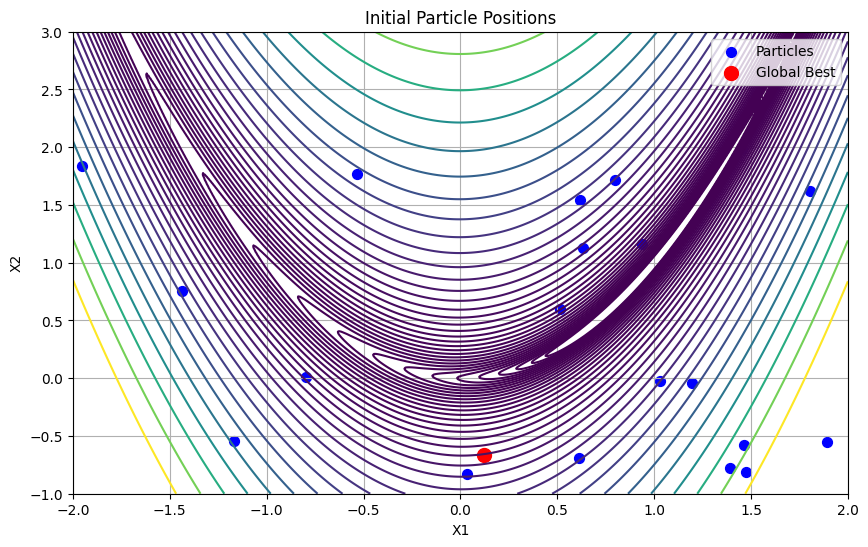

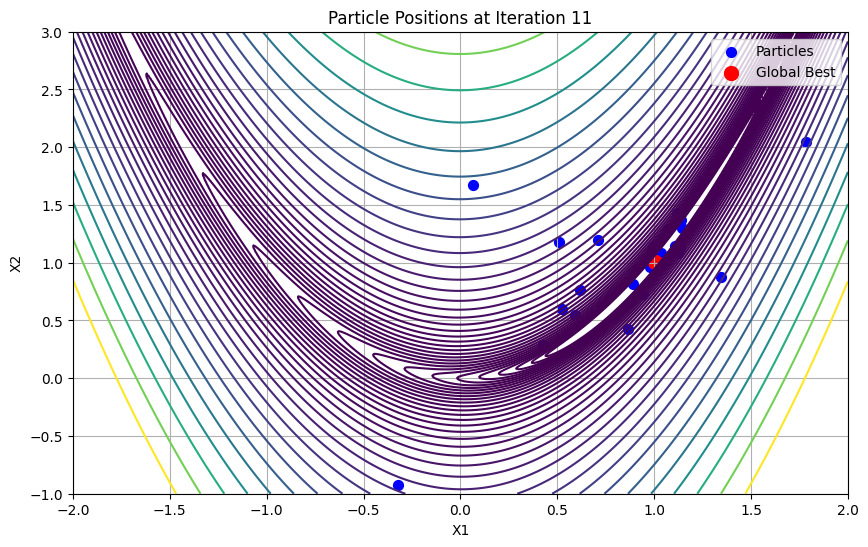

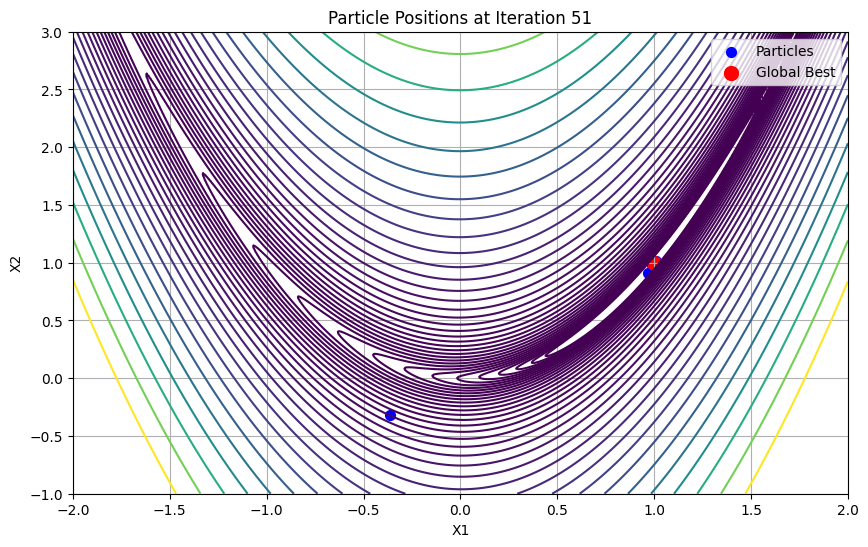

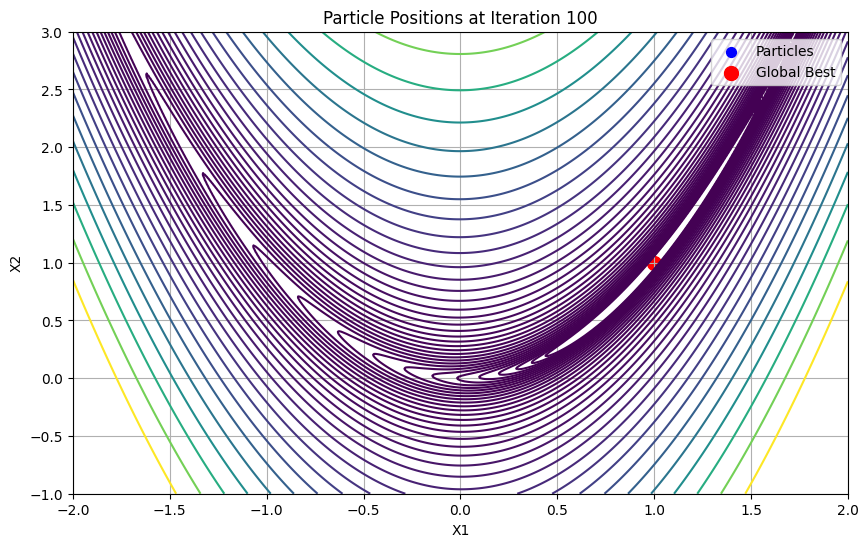

Final Particle Positions:
 [[1.00000001 1.00000003]
 [1.00000004 1.00000008]
 [1.00042685 1.00086657]
 [1.         1.        ]
 [1.00000008 1.00000016]
 [0.99982306 0.99977541]
 [1.         1.        ]
 [0.99999976 0.99999953]
 [0.9999982  0.99999661]
 [0.99999991 0.99999979]
 [1.00000016 1.0000003 ]
 [0.99999996 1.00000093]
 [0.9999635  0.99994731]
 [0.99999766 0.99999666]
 [0.9999994  0.99999899]
 [0.99983082 0.99969056]
 [0.99999999 0.99999999]
 [0.99999939 0.99999874]
 [1.00000431 1.0000087 ]
 [0.99999978 0.99999955]
 [0.99999996 0.99999994]
 [1.00000001 1.00000002]
 [1.         1.        ]
 [0.99999991 0.9999999 ]
 [0.99999216 0.9999833 ]
 [0.99999941 0.99999897]
 [1.00000151 1.00000252]
 [0.99990605 0.99977   ]
 [0.99999852 0.99999621]
 [0.99999934 0.99999848]]
Best Global Position:
 [1. 1.]


In [5]:
import numpy as np
import matplotlib.pyplot as plt

# Objective function (simple 2D function to minimize)
def objective_function(x):
    return (1 - x[0])**2 + 100 * (x[1] - x[0]**2)**2

# Number of particles
num_particles = 30
num_iterations = 100

# Initialize particles
particles = np.random.rand(num_particles, 2) * 4 - 2  # Ensuring particles start within the plot range
velocities = np.zeros((num_particles, 2))
best_positions = particles.copy()
best_global_position = particles[0]
best_global_value = objective_function(best_global_position)

# Star social structure parameters
c1 = 2.0  # Cognitive parameter
c2 = 2.0  # Social parameter
w = 0.5   # Inertia weight

# Plot function to visualize particles
def plot_particles(title):
    plt.figure(figsize=(10, 6))
    plt.contour(X, Y, Z, levels=np.logspace(-0.5, 3, 35), cmap='viridis')
    plt.scatter(particles[:, 0], particles[:, 1], s=50, color='blue', label='Particles')
    plt.scatter(best_global_position[0], best_global_position[1], s=100, color='red', label='Global Best')
    plt.title(title)
    plt.xlabel('X1')
    plt.ylabel('X2')
    plt.legend()
    plt.grid(True)
    plt.xlim(-2, 2)
    plt.ylim(-1, 3)
    plt.show()

# Create a grid of points for plotting
x = np.linspace(-2, 2, 400)
y = np.linspace(-1, 3, 400)
X, Y = np.meshgrid(x, y)
Z = objective_function([X, Y])

# Plot initial particles
plot_particles("Initial Particle Positions")

# Optimization loop
for iteration in range(num_iterations):
    for i in range(num_particles):
        # Update velocity
        velocities[i] = w * velocities[i] + c1 * np.random.rand() * (best_positions[i] - particles[i]) + c2 * np.random.rand() * (best_global_position - particles[i])
        
        # Update position
        particles[i] += velocities[i]
        
        # Evaluate objective function
        current_value = objective_function(particles[i])
        
        # Update personal best
        if current_value < objective_function(best_positions[i]):
            best_positions[i] = particles[i]
        
        # Update global best
        if current_value < best_global_value:
            best_global_value = current_value
            best_global_position = particles[i].copy()
    
    # Plot particles at intermediate steps
    if iteration in [10, 50, 99]:
        plot_particles(f"Particle Positions at Iteration {iteration + 1}")

# Print the final positions and best positions for verification
print("Final Particle Positions:\n", particles)
print("Best Global Position:\n", best_global_position)


In this example:

Each particle updates its velocity based on its own best position and the best position found by the entire swarm (star social structure).

1. The particles' positions are updated based on their velocities.

2. The objective function is evaluated, and personal and global best positions are updated.

3. The final positions of the particles and the global best position are plotted.

### 2. Ring Social Structure 

<figure><center>
    <img src="pics/pso/ring.jpg" alt="missing">
    <figcaption>Ring Social Structure; Adapted from "Computational Intelligence: An Introduction" (2nd ed.) by A. P. Engelbrecht, 2007, John Wiley & Sons.</figcaption>
</center></figure>

The ring social structure in Particle Swarm Optimization (PSO) allows each particle to communicate with its $n_N$ immediate neighbors. For instance, when $n_N = 2$, a particle interacts with its directly adjacent neighbors, as depicted in the figure above. Each particle aims to mimic its best neighbor by moving closer to the optimal solution identified within its neighborhood.

An important aspect of this structure is that neighborhoods overlap, which enhances the exchange of information between them and ultimately aids in converging toward a single solution. Although information flows more slowly through this social network, leading to a gradual convergence, the ring structure enables a broader exploration of the search space compared to the star structure.

This characteristic allows the ring structure to excel in finding higher-quality solutions for multi-modal problems, outperforming the star structure in this regard. The resulting PSO algorithm is commonly referred to as the **lbest PSO**.



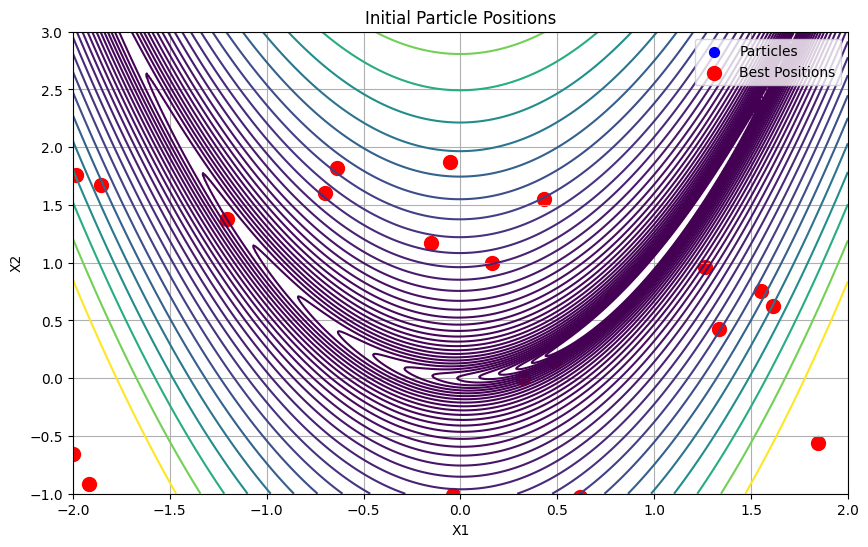

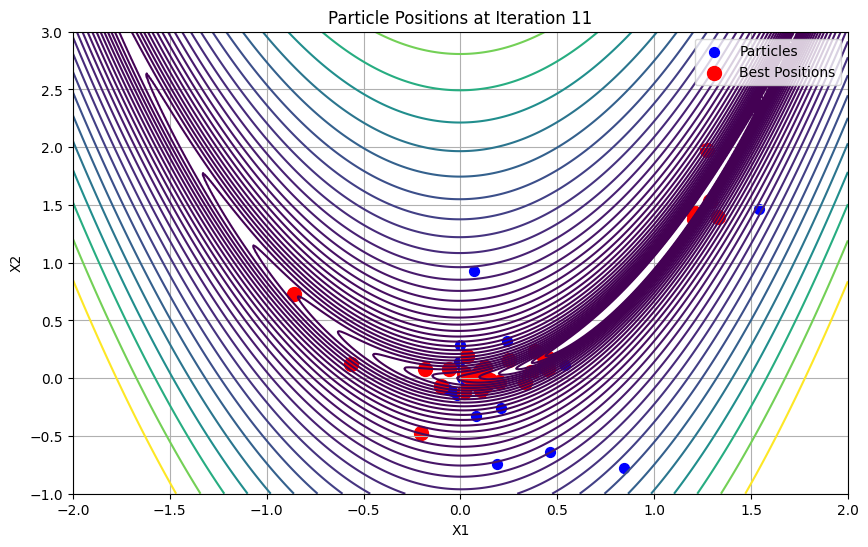

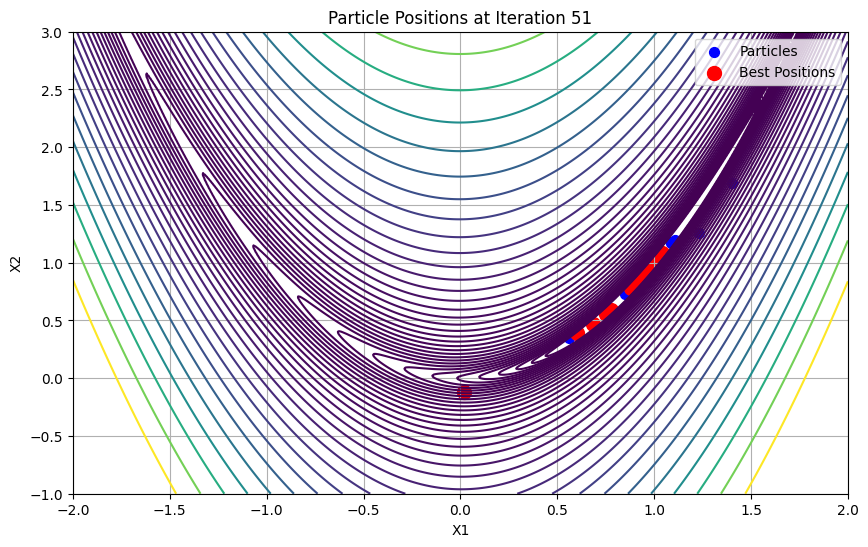

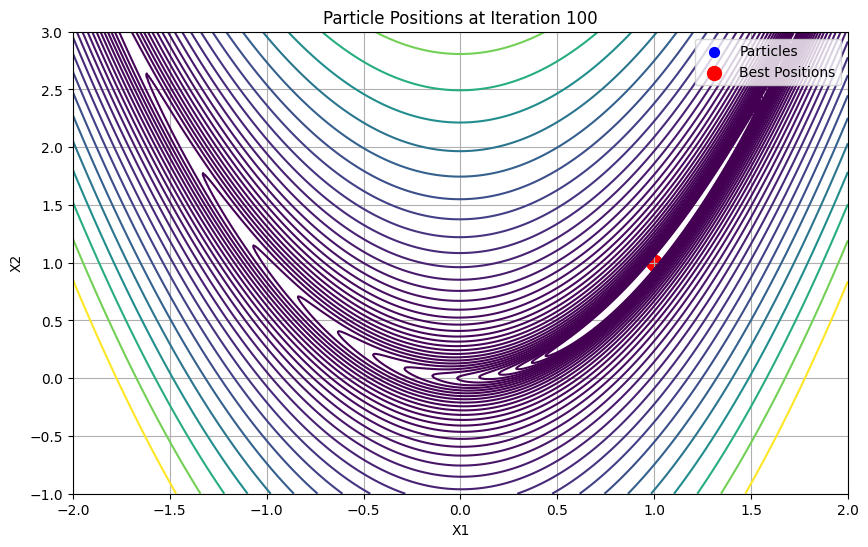

Final Particle Positions:
 [[1.00001428 1.00002923]
 [1.00001858 1.00003625]
 [1.00018859 1.00038993]
 [1.00024687 1.00049985]
 [1.00013805 1.00027171]
 [1.00104853 1.00207242]
 [1.00421138 1.00887811]
 [0.9999362  0.99987288]
 [0.99993576 0.99986885]
 [1.00133402 1.00263442]
 [0.99987831 0.99975855]
 [0.99982346 0.99963585]
 [0.99990202 0.9997887 ]
 [1.00017347 1.00033425]
 [1.00005287 1.00010305]
 [1.00005357 1.00010512]
 [0.99951833 0.99900219]
 [0.99803946 0.99653571]
 [0.99900489 0.99812993]
 [0.99920672 0.99914366]
 [1.00157369 1.0030387 ]
 [1.00873897 1.01882398]
 [1.00117401 1.00225797]
 [1.0005868  1.00098242]
 [1.00105594 1.0021186 ]
 [1.00350759 1.00705002]
 [0.99992644 0.99985116]
 [1.00052273 1.0008678 ]
 [0.99993608 0.99987122]
 [0.99998566 0.99997533]]
Best Neighbor Positions:
 [[1.00003013 1.00006047]
 [1.00001428 1.00002923]
 [1.00001858 1.00003625]
 [0.99991728 0.99984172]
 [1.00021907 1.00042625]
 [0.99991728 0.99984172]
 [0.99992186 0.99984764]
 [0.99993597 0.999875

In [6]:
import numpy as np
import matplotlib.pyplot as plt

# Objective function (simple 2D function to minimize)
def objective_function(x):
    return (1 - x[0])**2 + 100 * (x[1] - x[0]**2)**2

# Number of particles
num_particles = 30
num_iterations = 100

# Initialize particles
particles = np.random.rand(num_particles, 2) * 4 - 2  # Ensuring particles start within the plot range
velocities = np.zeros((num_particles, 2))
best_positions = particles.copy()
best_neighbor_positions = best_positions.copy()

# Ring social structure parameters
c1 = 2.0  # Cognitive parameter
c2 = 2.0  # Social parameter
w = 0.5   # Inertia weight

# Plot function to visualize particles
def plot_particles(title):
    plt.figure(figsize=(10, 6))
    plt.contour(X, Y, Z, levels=np.logspace(-0.5, 3, 35), cmap='viridis')
    plt.scatter(particles[:, 0], particles[:, 1], s=50, color='blue', label='Particles')
    plt.scatter(best_positions[:, 0], best_positions[:, 1], s=100, color='red', label='Best Positions')
    plt.title(title)
    plt.xlabel('X1')
    plt.ylabel('X2')
    plt.legend()
    plt.grid(True)
    plt.xlim(-2, 2)
    plt.ylim(-1, 3)
    plt.show()

# Create a grid of points for plotting
x = np.linspace(-2, 2, 400)
y = np.linspace(-1, 3, 400)
X, Y = np.meshgrid(x, y)
Z = objective_function([X, Y])

# Plot initial particles
plot_particles("Initial Particle Positions")

# Optimization loop
for iteration in range(num_iterations):
    for i in range(num_particles):
        # Determine neighbors
        left_neighbor = (i - 1) % num_particles
        right_neighbor = (i + 1) % num_particles
        
        # Update neighbor best position
        if objective_function(best_positions[left_neighbor]) < objective_function(best_neighbor_positions[i]):
            best_neighbor_positions[i] = best_positions[left_neighbor]
        if objective_function(best_positions[right_neighbor]) < objective_function(best_neighbor_positions[i]):
            best_neighbor_positions[i] = best_positions[right_neighbor]
        
        # Update velocity
        velocities[i] = (w * velocities[i] 
                         + c1 * np.random.rand() * (best_positions[i] - particles[i]) 
                         + c2 * np.random.rand() * (best_neighbor_positions[i] - particles[i]))
        
        # Update position
        particles[i] += velocities[i]
        
        # Evaluate objective function
        current_value = objective_function(particles[i])
        
        # Update personal best
        if current_value < objective_function(best_positions[i]):
            best_positions[i] = particles[i]
    
    # Plot particles at intermediate steps
    if iteration in [10, 50, 99]:
        plot_particles(f"Particle Positions at Iteration {iteration + 1}")

# Print the final positions and best positions for verification
print("Final Particle Positions:\n", particles)
print("Best Neighbor Positions:\n", best_neighbor_positions)


In a ring social structure for Particle Swarm Optimization (PSO), each particle is influenced by its immediate neighbors, rather than the entire swarm. This can promote diversity in the search process and prevent premature convergence.

In this version:
1. Each particle updates its velocity based on its own best position and the best position of its immediate neighbors.
2. The particles' positions are updated based on their velocities.
3. The objective function is evaluated, and personal best positions are updated.
4. The final positions of the particles and their best positions are plotted.
 

### 3. Wheel Social Structure

<figure><center>
    <img src="pics/pso/wheel.jpg" alt="missing">
    <figcaption>Wheel Social Structure; Adapted from "Computational Intelligence: An Introduction" (2nd ed.) by A. P. Engelbrecht, 2007, John Wiley & Sons.</figcaption>
</center></figure>

The wheel social structure in Particle Swarm Optimization (PSO) consists of individuals in a neighborhood that are isolated from one another, with a single particle serving as the focal or central point for communication as illustrated in the figure above. This focal particle assesses the performance of all neighboring particles and adjusts its position toward the best-performing neighbor. If this adjustment leads to improved performance, the focal particle disseminates this enhancement throughout the entire neighborhood. However, this structure often results in a slower dissemination of effective solutions across the swarm.

Here's an example of how to implement a wheel social structure in PSO: You can see how the wheel social structure influences the optimization process.

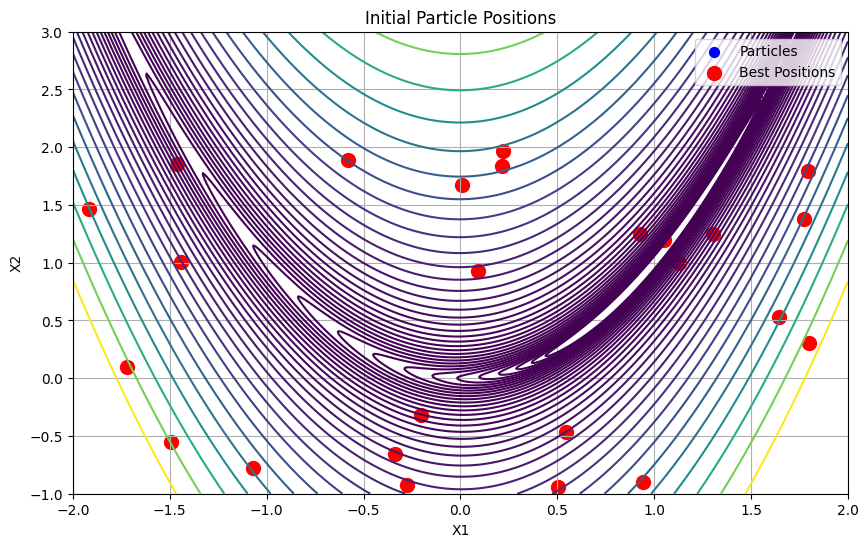

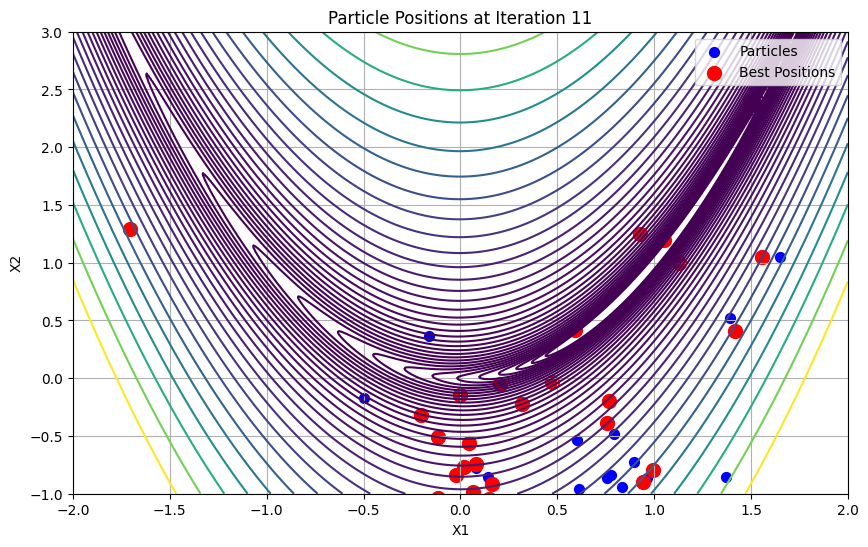

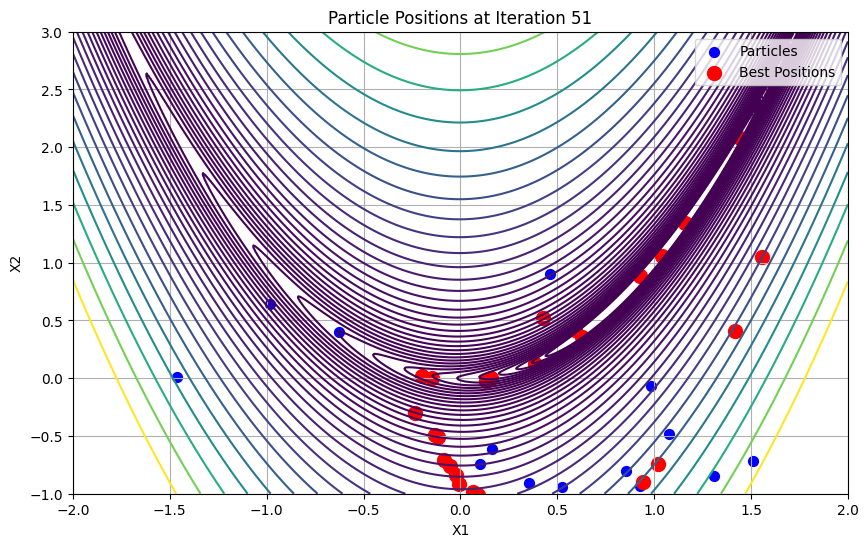

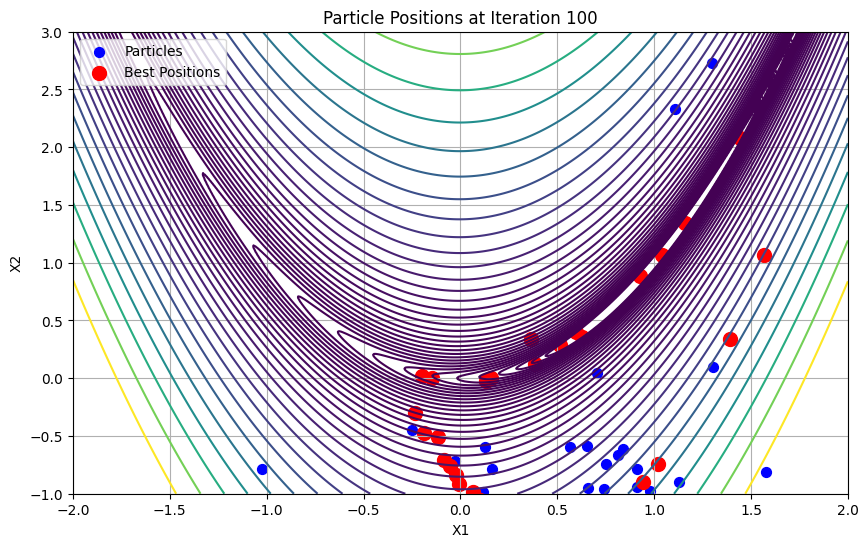

Final Particle Positions:
 [[ 0.94262144 -0.89864177]
 [ 0.56513611 -0.59685055]
 [ 1.38974594 -1.41049591]
 [ 0.16235074 -0.7868206 ]
 [ 0.12693754 -0.59508589]
 [ 0.74307398 -0.96267103]
 [ 3.41833446 -2.15462356]
 [ 1.12672423 -0.8947539 ]
 [ 0.36952787 -2.70868577]
 [ 0.81759907 -1.15326175]
 [ 0.90994663 -0.94454138]
 [ 0.28120765 -1.18164952]
 [-1.02159548 -0.78253585]
 [ 0.98048013 -0.97976514]
 [ 0.11693524 -0.98200695]
 [ 0.81448411 -0.66397939]
 [ 1.57779467 -0.81347527]
 [ 1.10653312  2.32819192]
 [ 0.6595385  -0.95021005]
 [ 0.65552568 -0.58813016]
 [-0.02914913 -0.71778324]
 [ 0.70500788  0.0416484 ]
 [ 0.87520019 -1.30189599]
 [ 0.83774948 -0.60891544]
 [ 1.30524828  0.09715468]
 [ 0.95085565 -1.92892481]
 [ 1.29641383  2.73117613]
 [ 0.74999916 -0.73946625]
 [ 0.9137821  -0.78994371]
 [-0.2494884  -0.44614805]]
Best Global Position:
 [ 0.94262144 -0.89864177]


In [7]:
import numpy as np
import matplotlib.pyplot as plt

# Objective function (simple 2D function to minimize)
def objective_function(x):
    return (1 - x[0])**2 + 100 * (x[1] - x[0]**2)**2

# Number of particles
num_particles = 30
num_iterations = 100

# Initialize particles
particles = np.random.rand(num_particles, 2) * 4 - 2  # Ensuring particles start within the plot range
velocities = np.zeros((num_particles, 2))
best_positions = particles.copy()
best_global_position = particles[0]
best_global_value = objective_function(best_global_position)

# Wheel social structure parameters
c1 = 2.0  # Cognitive parameter
c2 = 2.0  # Social parameter
w = 0.5   # Inertia weight

# Plot function to visualize particles
def plot_particles(title):
    plt.figure(figsize=(10, 6))
    plt.contour(X, Y, Z, levels=np.logspace(-0.5, 3, 35), cmap='viridis')
    plt.scatter(particles[:, 0], particles[:, 1], s=50, color='blue', label='Particles')
    plt.scatter(best_positions[:, 0], best_positions[:, 1], s=100, color='red', label='Best Positions')
    plt.title(title)
    plt.xlabel('X1')
    plt.ylabel('X2')
    plt.legend()
    plt.grid(True)
    plt.xlim(-2, 2)
    plt.ylim(-1, 3)
    plt.show()

# Create a grid of points for plotting
x = np.linspace(-2, 2, 400)
y = np.linspace(-1, 3, 400)
X, Y = np.meshgrid(x, y)
Z = objective_function([X, Y])

# Plot initial particles
plot_particles("Initial Particle Positions")

# Optimization loop
for iteration in range(num_iterations):
    for i in range(num_particles):
        # Update velocity
        if i == 0:  # Central particle
            velocities[i] = (w * velocities[i] 
                             + c1 * np.random.rand() * (best_positions[i] - particles[i]) 
                             + c2 * np.random.rand() * (best_global_position - particles[i]))
        else:  # Peripheral particles
            velocities[i] = (w * velocities[i] 
                             + c1 * np.random.rand() * (best_positions[i] - particles[i]) 
                             + c2 * np.random.rand() * (best_positions[0] - particles[i]))
        
        # Update position
        particles[i] += velocities[i]
        
        # Evaluate objective function
        current_value = objective_function(particles[i])
        
        # Update personal best
        if current_value < objective_function(best_positions[i]):
            best_positions[i] = particles[i]
        
        # Update global best for the central particle
        if i == 0 and current_value < best_global_value:
            best_global_value = current_value
            best_global_position = particles[i].copy()
    
    # Plot particles at intermediate steps
    if iteration in [10, 50, 99]:
        plot_particles(f"Particle Positions at Iteration {iteration + 1}")

# Print the final positions and best positions for verification
print("Final Particle Positions:\n", particles)
print("Best Global Position:\n", best_global_position)


In the wheel structure, there's a central particle (or a few central particles) that influence all other particles, while the peripheral particles only influence themselves and the central particle.

In this example:
1. Each particle updates its velocity based on its own best position and the best position of the central particle.
2. The central particle is influenced by its own best position and the global best position.
3. The particles' positions are updated based on their velocities.
4. The objective function is evaluated, and personal best positions are updated.
5. The final positions of the particles and their best positions are plotted.


### 4. Pyramid Social Structure

<figure><center>
    <img src="pics/pso/pyramid.jpg" alt="missing">
    <figcaption>Pyramid Social Structure; Adapted from "Computational Intelligence: An Introduction" (2nd ed.) by A. P. Engelbrecht, 2007, John Wiley & Sons.</figcaption>
</center></figure>

The pyramid social structure in Particle Swarm Optimization (PSO) is represented as a three-dimensional wireframe, where particles are arranged in a hierarchical manner. In this structure, each particle communicates with others based on their position within the pyramid, allowing for a unique flow of information. The focal point of communication typically involves particles at higher levels influencing those below them, creating a system where knowledge and performance metrics are shared throughout the hierarchy. This topology promotes a structured exchange of information, facilitating the swarm's ability to explore the search space effectively while also leveraging the successes of higher-performing particles. As a result, the pyramid structure can enhance convergence rates and improve solution quality by ensuring that particles benefit from the collective experiences of their peers within the pyramid framework.

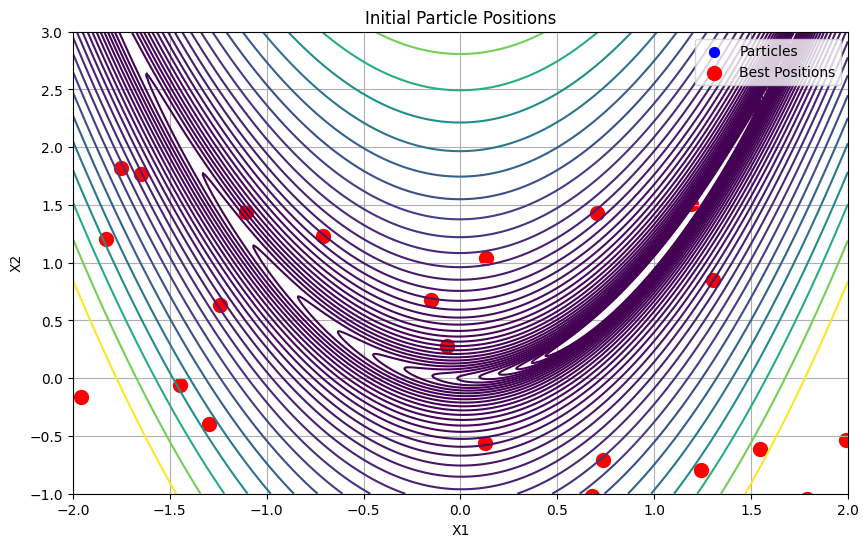

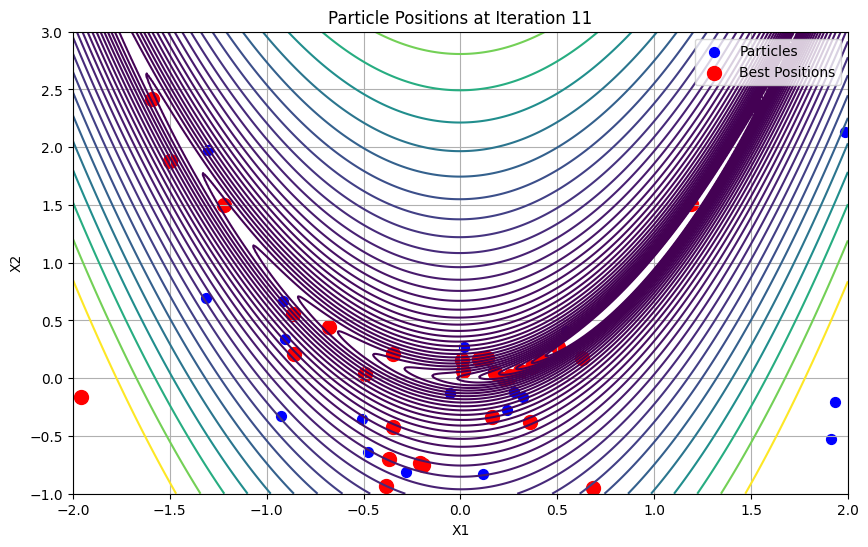

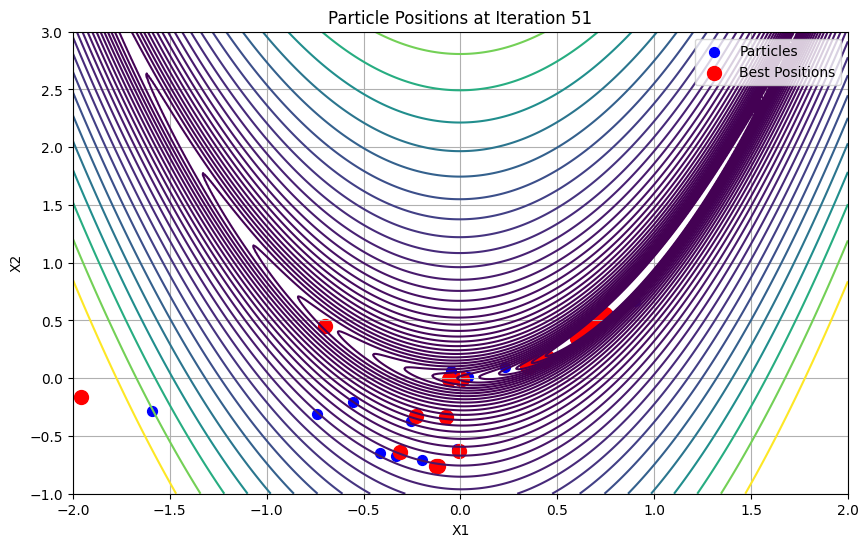

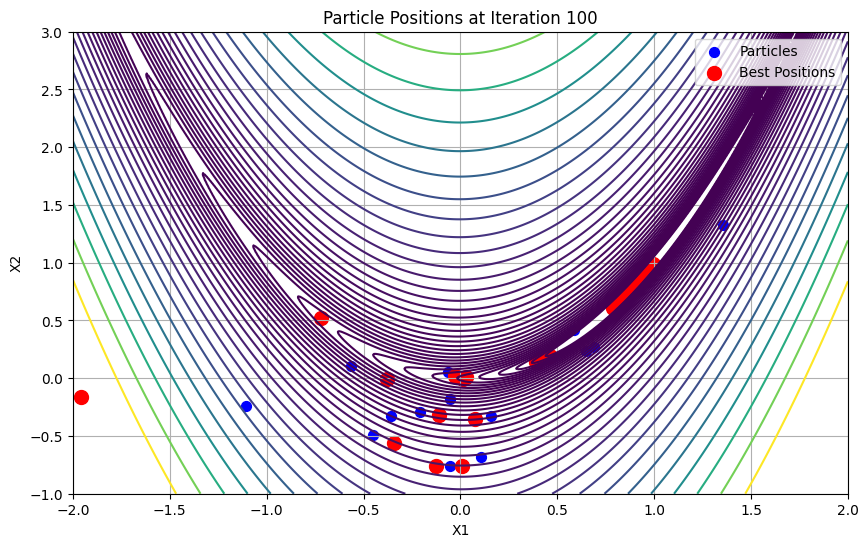

Final Particle Positions:
 [[-1.95799732 -0.16120136]
 [-2.24020849 -0.06907259]
 [-1.10535274 -0.24236389]
 [ 0.1583479  -0.32781557]
 [-0.05574513 -0.75913248]
 [-0.2060446  -0.29326344]
 [ 0.10828249 -0.68520406]
 [ 0.84331078  0.70943948]
 [ 0.86834052  0.76147962]
 [-1.02527493 -2.55752853]
 [-0.45236139 -0.49309687]
 [-0.05369445 -0.17626605]
 [ 0.58396085  0.41355165]
 [-0.02348808 -0.00283623]
 [ 0.65048969  0.23393282]
 [ 0.94286233  0.89443631]
 [ 0.8549631   0.7263839 ]
 [ 0.98571633  0.96832533]
 [ 0.99531162  0.98346041]
 [ 1.3530514   1.32232613]
 [ 0.92959222  0.8511874 ]
 [-0.35700456 -0.32603345]
 [-0.56223698  0.10251178]
 [ 0.68798048  0.27147634]
 [-0.06513357  0.05283754]
 [ 0.78457495  0.60177074]
 [ 0.83261167  0.67382971]
 [ 0.39034079  0.13891914]
 [ 0.45508523  0.18486288]
 [ 0.40116972  0.15779243]]
Best Global Position:
 [0.99307349 0.98578162]


In [8]:
import numpy as np
import matplotlib.pyplot as plt

# Objective function (simple 2D function to minimize)
def objective_function(x):
    return (1 - x[0])**2 + 100 * (x[1] - x[0]**2)**2

# Number of particles
num_particles = 30
num_iterations = 100

# Initialize particles
particles = np.random.rand(num_particles, 2) * 4 - 2  # Ensuring particles start within the plot range
velocities = np.zeros((num_particles, 2))
best_positions = particles.copy()
best_global_position = particles[0]
best_global_value = objective_function(best_global_position)

# Pyramid social structure parameters
c1 = 2.0  # Cognitive parameter
c2 = 2.0  # Social parameter
w = 0.5   # Inertia weight

# Function to get parent particle index in a pyramid structure
def get_parent_index(i):
    if i == 0:
        return 0
    return (i - 1) // 2

# Plot function to visualize particles
def plot_particles(title):
    plt.figure(figsize=(10, 6))
    plt.contour(X, Y, Z, levels=np.logspace(-0.5, 3, 35), cmap='viridis')
    plt.scatter(particles[:, 0], particles[:, 1], s=50, color='blue', label='Particles')
    plt.scatter(best_positions[:, 0], best_positions[:, 1], s=100, color='red', label='Best Positions')
    plt.title(title)
    plt.xlabel('X1')
    plt.ylabel('X2')
    plt.legend()
    plt.grid(True)
    plt.xlim(-2, 2)
    plt.ylim(-1, 3)
    plt.show()

# Create a grid of points for plotting
x = np.linspace(-2, 2, 400)
y = np.linspace(-1, 3, 400)
X, Y = np.meshgrid(x, y)
Z = objective_function([X, Y])

# Plot initial particles
plot_particles("Initial Particle Positions")

# Optimization loop
for iteration in range(num_iterations):
    for i in range(num_particles):
        parent_index = get_parent_index(i)
        
        # Update velocity
        velocities[i] = (w * velocities[i] 
                         + c1 * np.random.rand() * (best_positions[i] - particles[i]) 
                         + c2 * np.random.rand() * (best_positions[parent_index] - particles[i]))
        
        # Update position
        particles[i] += velocities[i]
        
        # Evaluate objective function
        current_value = objective_function(particles[i])
        
        # Update personal best
        if current_value < objective_function(best_positions[i]):
            best_positions[i] = particles[i]
        
        # Update global best
        if current_value < best_global_value:
            best_global_value = current_value
            best_global_position = particles[i].copy()
    
    # Plot particles at intermediate steps
    if iteration in [10, 50, 99]:
        plot_particles(f"Particle Positions at Iteration {iteration + 1}")

# Print the final positions and best positions for verification
print("Final Particle Positions:\n", particles)
print("Best Global Position:\n", best_global_position)


In a pyramid social structure for Particle Swarm Optimization (PSO), particles are arranged in a hierarchical manner, where each particle is influenced by particles in the level above it. This structure can help maintain diversity while still guiding particles towards the optimum.

In this example:
1. We define a function to get the parent index of a particle in the pyramid structure.
2. Each particle updates its velocity based on its own best position and the best position of its parent particle.
3. The particles' positions are updated based on their velocities.
4. The objective function is evaluated, and personal best positions are updated.
5. The final positions of the particles and their best positions are plotted.


### 5. Four Clusters Social Structure

<figure><center>
    <img src="pics/pso/clusters.jpg" alt="missing">
    <figcaption>Four Clusters Social Structure; Adapted from "Computational Intelligence: An Introduction" (2nd ed.) by A. P. Engelbrecht, 2007, John Wiley & Sons.</figcaption>
</center></figure>

The four clusters social structure in Particle Swarm Optimization (PSO) is characterized by the formation of four distinct clusters, or cliques, which are interconnected through two connections between them. In this network, particles within each cluster are linked to five neighboring particles, facilitating localized communication and collaboration. This structure allows for effective information exchange within each cluster while maintaining some level of interaction between the clusters themselves. The design promotes a balance between exploration and exploitation, as particles can share their successes with their immediate neighbors while also benefiting from insights gained in other clusters. This interconnectedness enhances the swarm's ability to navigate the search space efficiently, potentially leading to improved convergence rates and solution quality compared to more isolated structures.


Run the following code to see how the four clusters social structure influences the optimization process.

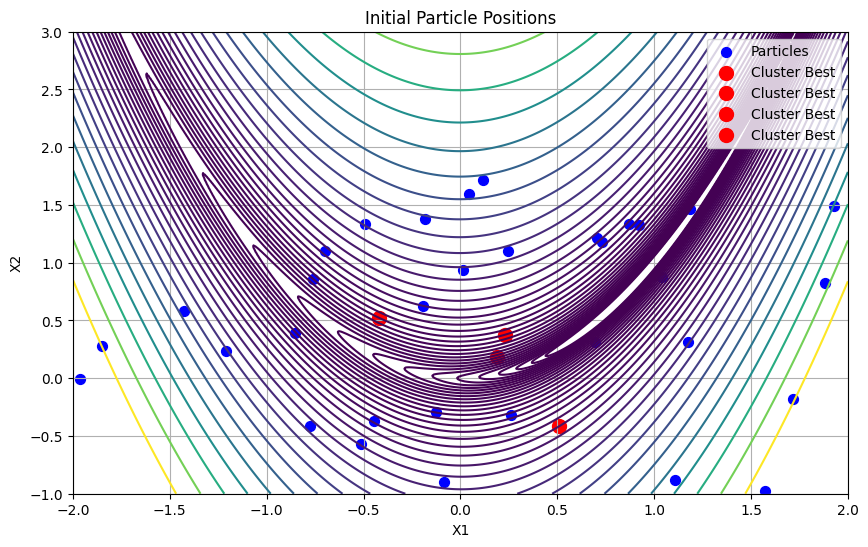

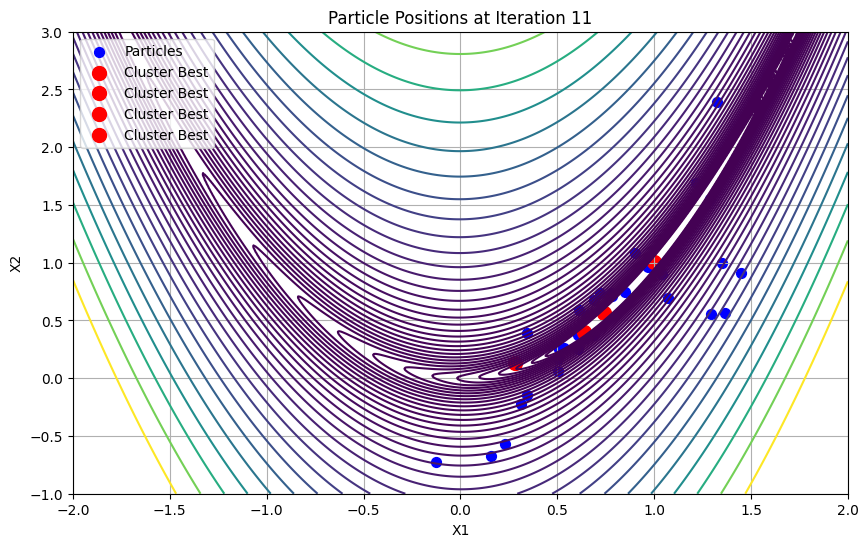

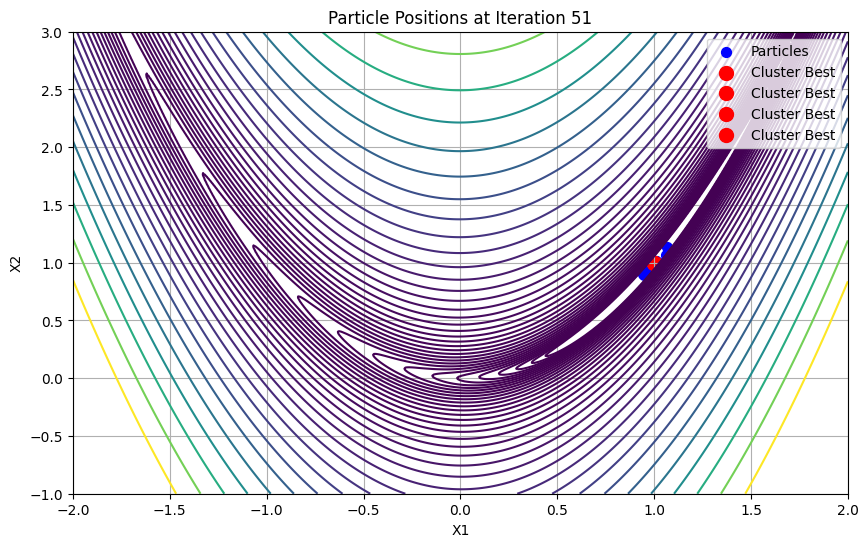

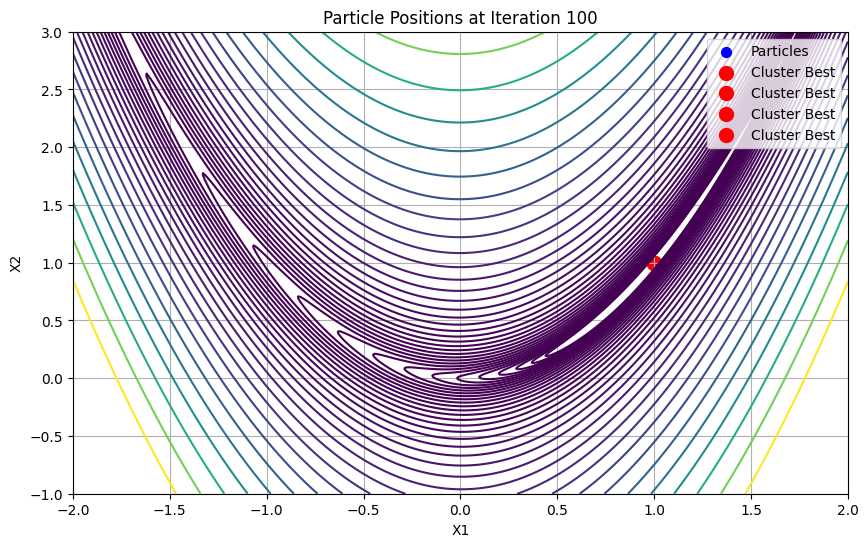

Final Particle Positions:
 [[1.00000024 1.0000005 ]
 [0.99999926 0.99999863]
 [0.99998955 0.99997781]
 [1.00000069 1.00000134]
 [1.00000024 1.00000049]
 [0.9999924  0.99998396]
 [1.00000265 1.00000546]
 [1.00000027 1.00000055]
 [1.00000015 1.00000029]
 [0.99999952 0.99999924]
 [1.00000195 1.00000407]
 [1.00000619 1.00001166]
 [1.00000037 1.00000074]
 [0.99999995 0.9999999 ]
 [1.00000017 1.00000039]
 [1.00000004 1.00000089]
 [0.99999903 0.99999828]
 [1.00000039 1.00000108]
 [0.99919803 0.99853998]
 [0.99999433 0.99998886]
 [0.99999801 0.99999533]
 [1.00000279 1.00000525]
 [0.99999197 0.99998319]
 [0.99999853 0.99999722]
 [0.99984972 0.99972369]
 [1.00000648 1.00001412]
 [1.00000153 1.00000616]
 [1.00004385 1.00006998]
 [0.99998794 0.99997226]
 [0.99999998 0.99999995]
 [0.9999997  0.99999943]
 [1.00014125 1.00028467]
 [1.00000001 1.        ]
 [1.         1.        ]
 [0.9999996  0.99999922]
 [0.99999651 0.99999256]
 [0.99999885 0.99999709]
 [1.00000458 1.00000906]
 [1.0004574  1.00105287

In [9]:
import numpy as np
import matplotlib.pyplot as plt

# Objective function (simple 2D function to minimize)
def objective_function(x):
    return (1 - x[0])**2 + 100 * (x[1] - x[0]**2)**2

# Number of particles
num_particles = 40  # Ensure it's divisible by 4 for simplicity
num_clusters = 4
num_iterations = 100

# Initialize particles
particles = np.random.rand(num_particles, 2) * 4 - 2  # Ensuring particles start within the plot range
velocities = np.zeros((num_particles, 2))
best_positions = particles.copy()
cluster_best_positions = [particles[i::num_clusters].mean(axis=0) for i in range(num_clusters)]

# Four clusters social structure parameters
c1 = 2.0  # Cognitive parameter
c2 = 2.0  # Social parameter
w = 0.5   # Inertia weight

# Function to determine the cluster index
def get_cluster_index(i):
    return i % num_clusters

# Plot function to visualize particles
def plot_particles(title):
    plt.figure(figsize=(10, 6))
    plt.contour(X, Y, Z, levels=np.logspace(-0.5, 3, 35), cmap='viridis')
    plt.scatter(particles[:, 0], particles[:, 1], s=50, color='blue', label='Particles')
    for cluster_pos in cluster_best_positions:
        plt.scatter(cluster_pos[0], cluster_pos[1], s=100, color='red', label='Cluster Best')
    plt.title(title)
    plt.xlabel('X1')
    plt.ylabel('X2')
    plt.legend()
    plt.grid(True)
    plt.xlim(-2, 2)
    plt.ylim(-1, 3)
    plt.show()

# Create a grid of points for plotting
x = np.linspace(-2, 2, 400)
y = np.linspace(-1, 3, 400)
X, Y = np.meshgrid(x, y)
Z = objective_function([X, Y])

# Plot initial particles
plot_particles("Initial Particle Positions")

# Optimization loop
for iteration in range(num_iterations):
    for i in range(num_particles):
        cluster_index = get_cluster_index(i)
        
        # Update velocity
        velocities[i] = (w * velocities[i] 
                         + c1 * np.random.rand() * (best_positions[i] - particles[i]) 
                         + c2 * np.random.rand() * (cluster_best_positions[cluster_index] - particles[i]))
        
        # Update position
        particles[i] += velocities[i]
        
        # Evaluate objective function
        current_value = objective_function(particles[i])
        
        # Update personal best
        if current_value < objective_function(best_positions[i]):
            best_positions[i] = particles[i]
        
        # Update cluster best
        cluster_particles = particles[cluster_index::num_clusters]
        cluster_best_value = np.array([objective_function(p) for p in cluster_particles]).argmin()
        cluster_best_positions[cluster_index] = cluster_particles[cluster_best_value]

    # Plot particles at intermediate steps
    if iteration in [10, 50, 99]:
        plot_particles(f"Particle Positions at Iteration {iteration + 1}")

# Print the final positions and best positions for verification
print("Final Particle Positions:\n", particles)
print("Best Cluster Positions:\n", cluster_best_positions)


In a four clusters social structure, the particles are divided into four distinct clusters, with each cluster having its own local best position influencing the particles within that cluster. This approach can help maintain diversity while still guiding the swarm towards optimal solutions. Each particle is influenced by its own best position and the best position found by any particle in its cluster.


In this example:
1. The particles are divided into four clusters.
2. Each particle updates its velocity based on its own best position and the best position in its cluster.
3. The particles' positions are updated based on their velocities.
4. The objective function is evaluated, and personal and cluster best positions are updated.
5. The final positions of the particles and their cluster best positions are plotted.


### 6. Von Neumann Social Structure

<figure><center>
    <img src="pics/pso/von.jpg" alt="missing">
    <figcaption>Von Neumann Social Structure; Adapted from "Computational Intelligence: An Introduction" (2nd ed.) by A. P. Engelbrecht, 2007, John Wiley & Sons.</figcaption>
</center></figure>

The Von Neumann social structure in PSO involves connecting particles in a grid or lattice arrangement, where each particle interacts with its immediate neighbors. This setup creates a moderate level of connectivity compared to other social structures, balancing the trade-off between exploration and exploitation.

In the context of PSO, the Von Neumann structure allows particles to share information within their local neighborhood, facilitating a more diverse search of the solution space. This helps avoid premature convergence to local minima by ensuring that particles explore a wider area before converging on a solution.

Empirical studies have shown that the Von Neumann social network tends to perform well across various optimization problems. This is because the grid structure maintains a balance, providing enough interaction to drive convergence while retaining diversity within the swarm. As a result, the swarm can effectively explore the search space and find optimal or near-optimal solutions.

The Von Neumann PSO strikes a balance that often leads to better performance compared to more or less connected networks. Its structured yet flexible communication pattern allows for robust exploration and exploitation, making it a popular choice in many optimization scenarios.


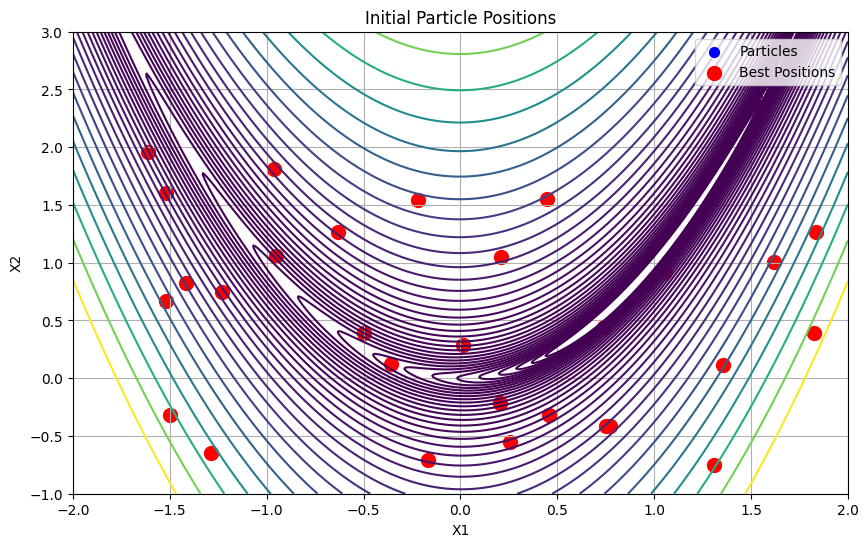

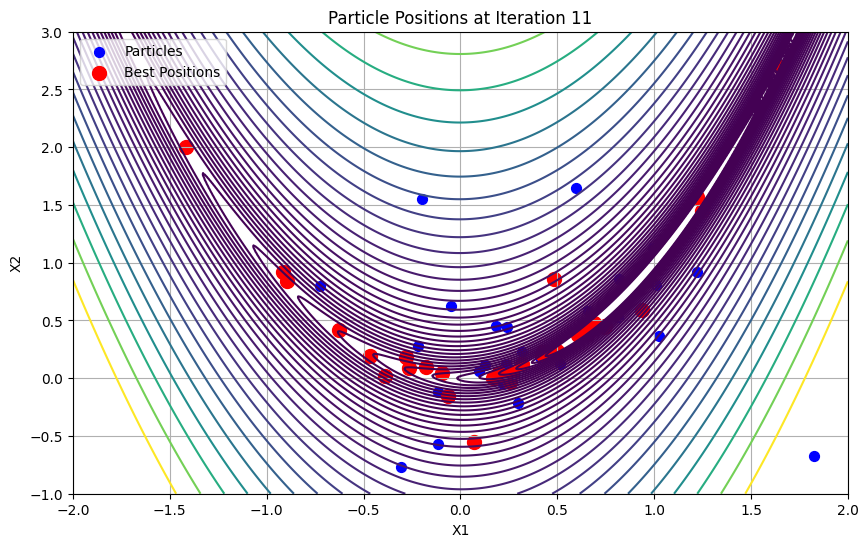

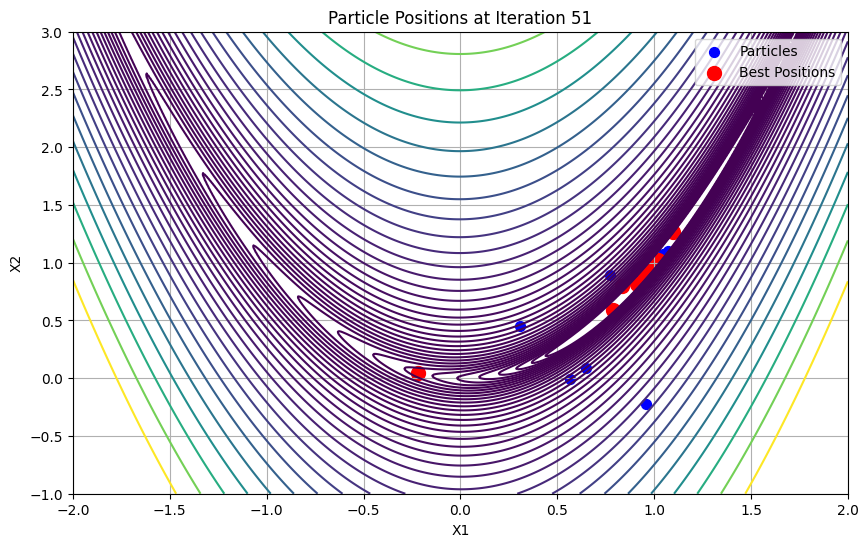

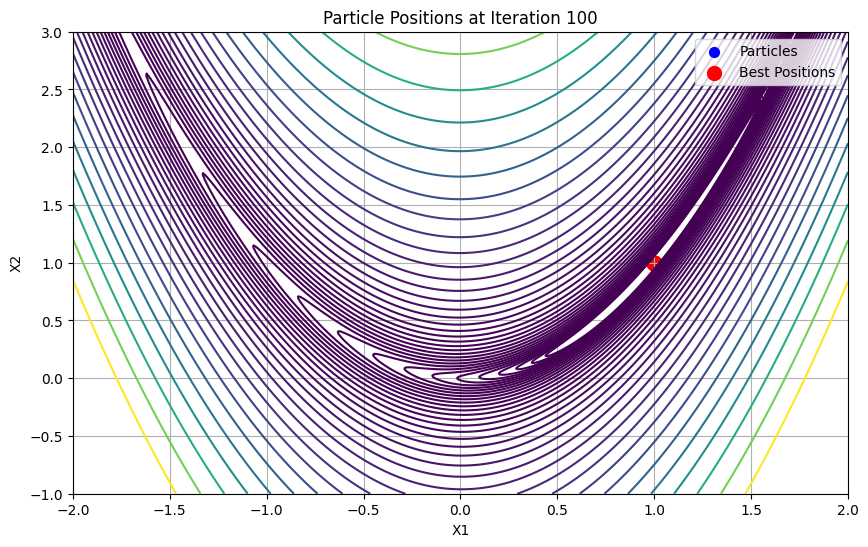

Final Particle Positions:
 [[0.99999829 0.99999622]
 [0.99999982 0.99999945]
 [1.0000278  1.0000555 ]
 [0.99967114 0.9993659 ]
 [0.99999914 0.99999805]
 [1.0000278  1.00004363]
 [1.00469428 1.00368234]
 [0.99999488 0.99998816]
 [1.00038179 1.00082508]
 [0.99995553 0.99988981]
 [0.99964678 0.99910348]
 [0.99999252 0.99772318]
 [1.00000159 1.0000036 ]
 [1.00000009 1.00000024]
 [0.99999956 0.99999909]
 [0.99994444 0.99988319]
 [1.00002165 1.00004001]
 [0.99998461 0.99997251]
 [0.99999845 0.99999693]
 [1.00000149 1.00000183]
 [0.99999948 0.9999989 ]
 [1.0000017  0.99999684]
 [0.99999893 0.99999788]
 [1.00000334 1.00000717]
 [1.0000009  1.00000183]
 [0.99999296 0.999985  ]
 [1.0000001  1.00000018]
 [0.99999893 0.99999789]
 [1.00162373 1.00256935]
 [0.99999722 0.99999412]
 [0.99999907 0.99999968]
 [0.99999859 0.99999715]
 [1.00002631 1.00004065]
 [1.00000034 1.00000062]
 [0.99999286 0.99998579]
 [0.99987759 0.99983366]]
Best Positions:
 [[0.99999837 0.99999652]
 [0.99999884 0.99999764]
 [0.9

In [10]:
import numpy as np
import matplotlib.pyplot as plt

# Objective function (simple 2D function to minimize)
def objective_function(x):
    return (1 - x[0])**2 + 100 * (x[1] - x[0]**2)**2

# Number of particles (ensuring it's a perfect square for the grid)
grid_size = 6
num_particles = grid_size * grid_size
num_iterations = 100

# Initialize particles
particles = np.random.rand(num_particles, 2) * 4 - 2  # Ensuring particles start within the plot range
velocities = np.zeros((num_particles, 2))
best_positions = particles.copy()

# Function to get the neighbors in Von Neumann topology
def get_neighbors(index, grid_size):
    row = index // grid_size
    col = index % grid_size
    neighbors = [
        ((row - 1) % grid_size) * grid_size + col,  # Up
        ((row + 1) % grid_size) * grid_size + col,  # Down
        row * grid_size + (col - 1) % grid_size,    # Left
        row * grid_size + (col + 1) % grid_size     # Right
    ]
    return neighbors

# Von Neumann social structure parameters
c1 = 2.0  # Cognitive parameter
c2 = 2.0  # Social parameter
w = 0.5   # Inertia weight

# Plot function to visualize particles
def plot_particles(title):
    plt.figure(figsize=(10, 6))
    plt.contour(X, Y, Z, levels=np.logspace(-0.5, 3, 35), cmap='viridis')
    plt.scatter(particles[:, 0], particles[:, 1], s=50, color='blue', label='Particles')
    plt.scatter(best_positions[:, 0], best_positions[:, 1], s=100, color='red', label='Best Positions')
    plt.title(title)
    plt.xlabel('X1')
    plt.ylabel('X2')
    plt.legend()
    plt.grid(True)
    plt.xlim(-2, 2)
    plt.ylim(-1, 3)
    plt.show()

# Create a grid of points for plotting
x = np.linspace(-2, 2, 400)
y = np.linspace(-1, 3, 400)
X, Y = np.meshgrid(x, y)
Z = objective_function([X, Y])

# Plot initial particles
plot_particles("Initial Particle Positions")

# Optimization loop
for iteration in range(num_iterations):
    for i in range(num_particles):
        neighbors = get_neighbors(i, grid_size)
        best_neighbor = min(neighbors, key=lambda idx: objective_function(best_positions[idx]))
        
        # Update velocity
        velocities[i] = (w * velocities[i] 
                         + c1 * np.random.rand() * (best_positions[i] - particles[i]) 
                         + c2 * np.random.rand() * (best_positions[best_neighbor] - particles[i]))
        
        # Update position
        particles[i] += velocities[i]
        
        # Evaluate objective function
        current_value = objective_function(particles[i])
        
        # Update personal best
        if current_value < objective_function(best_positions[i]):
            best_positions[i] = particles[i]
    
    # Plot particles at intermediate steps
    if iteration in [10, 50, 99]:
        plot_particles(f"Particle Positions at Iteration {iteration + 1}")

# Print the final positions and best positions for verification
print("Final Particle Positions:\n", particles)
print("Best Positions:\n", best_positions)


In a Von Neumann social structure, each particle in Particle Swarm Optimization (PSO) is influenced by its immediate neighbors in a grid-like structure. This can help maintain diversity in the swarm and prevent premature convergence by ensuring that particles explore their local neighborhoods thoroughly.

In this version:
1. We define a function to get the neighbors of a particle in the Von Neumann topology.
2. Each particle updates its velocity based on its own best position and the best position of its neighbors.
3. The particles' positions are updated based on their velocities.
4. The objective function is evaluated, and personal best positions are updated.
5. The final positions of the particles and their best positions are plotted.


Despite numerous studies on various topologies, no single topology excels for all problems. Generally, fully connected structures tend to perform best for unimodal problems, while less connected structures are more effective for multimodal problems, depending on the extent of particle interconnection.

In Particle Swarm Optimization (PSO), neighborhoods are typically defined based on the indices of the particles. For instance, in the lbest PSO configuration with $n_N = 2$, the neighborhood of a particle with index $i$ consists of the particles at indices $i - 1$, $i$, and $i + 1$. This arrangement allows each particle to directly communicate and share information with its immediate neighbors, fostering collaboration and enabling them to collectively move toward optimal solutions. 



## <a id='versus'>Comparing Synchronous and Asynchronous Updates</a>

There are two different update strategies used in Particle Swarm Optimization (PSO): **synchronous updates** and **asynchronous updates**. 

<figure><center>
    <img src="pics/pso/time.jpg" alt="missing">
</center></figure>

### Synchronous Updates

In synchronous updates, all particles in the swarm update their positions and velocities simultaneously at the end of each iteration.

#### Process

  1. At the start of an iteration, each particle evaluates its current position and determines if it has found a new personal best position.

  2. Simultaneously, the algorithm checks for the best position found by the entire swarm (global best) or by the local neighborhood (local best).

  3. After all particles have completed their evaluations, they update their velocities and positions based on the best positions determined in that iteration.

#### Feedback Timing 
Feedback about the best positions is only provided once per iteration, meaning that particles do not receive immediate updates after each individual position change.



### Asynchronous Updates

In asynchronous updates, each particle updates its position and velocity immediately after it has evaluated its current state, without waiting for other particles.

#### Process

  1. As soon as a particle completes its evaluation and finds a new personal best position, it updates its position.

  2. After this update, it checks if this new position is better than the current global or local best position and updates that as well.

#### Feedback Timing
This method provides immediate feedback about the best regions of the search space because each particle can influence the overall best position dynamically as it updates.



### Advantages and Implications

#### Synchronous Updates: 
  - Simplicity in implementation since all particles are updated together.

  - However, it may lead to slower convergence as particles are not utilizing real-time information about improvements made by others until the next iteration.

#### Asynchronous Updates:
  - Allows for immediate feedback and adaptation to changes in the search space, which can lead to faster convergence.

  - More similar to steady-state genetic algorithms (GAs), where offspring are introduced immediately into the population.



The choice between these two methods can significantly impact the performance and efficiency of the optimization process. Asynchronous updates tend to provide quicker feedback on the search space's quality, potentially leading to better exploration and exploitation strategies.



To compare the performance of synchronous and asynchronous updates in Particle Swarm Optimization (PSO) in terms of convergence speed, solution quality, and stability, we can run a simulation on a simple optimization problem. We'll measure these performance metrics for both update strategies and visualize the results.

Here's how to do it:

1. **Define the Objective Function**: We'll use a simple function like the Rosenbrock function.
2. **Implement Synchronous PSO**: All particles update their positions at the same time.
3. **Implement Asynchronous PSO**: Each particle updates its position as soon as its velocity is updated.
4. **Compare Performance Metrics**: We'll compare convergence speed, solution quality, and stability.

#### Analysis
- **Convergence Speed**: Compare how quickly the best objective value improves over iterations.
- **Solution Quality**: Compare the final best objective values after the same number of iterations.
- **Stability**: Run the algorithms multiple times and compare the variance in the final best objective values.

This approach provides a clear and visual comparison of synchronous and asynchronous PSO updates. 

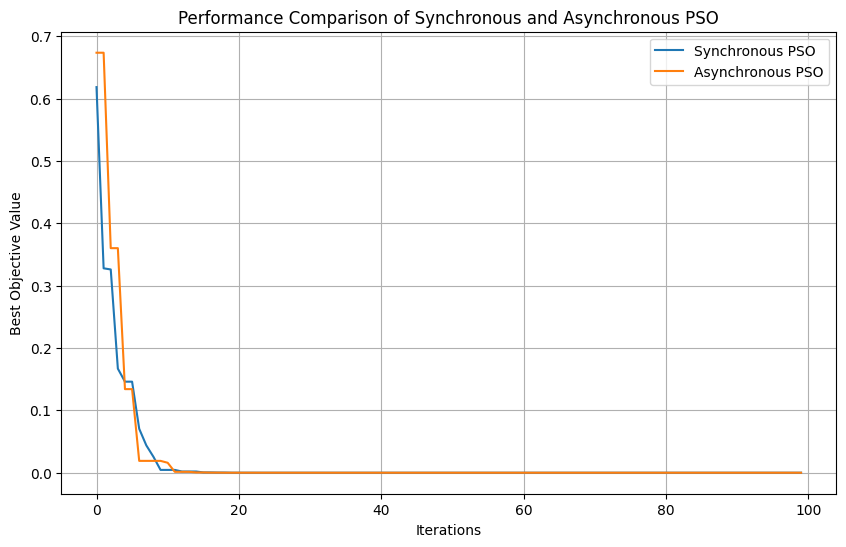

Best value achieved by Synchronous PSO: 1.0429868297929136e-18
Best value achieved by Asynchronous PSO: 7.166035884466212e-19
Synchronous PSO - Average Best Value: 2.2360323120932114e-17, Standard Deviation: 6.024381632794617e-17
Asynchronous PSO - Average Best Value: 3.1040324072089073e-18, Standard Deviation: 9.687268292038122e-18


In [11]:
import numpy as np
import matplotlib.pyplot as plt

def objective_function(x):
    return (1 - x[0])**2 + 100 * (x[1] - x[0]**2)**2

def synchronous_pso(particles, velocities, num_iterations):
    best_positions = particles.copy()
    global_best_position = particles[0]
    global_best_value = objective_function(global_best_position)

    c1 = 2.0
    c2 = 2.0
    w = 0.5

    performance = []

    for iteration in range(num_iterations):
        new_global_best_position = global_best_position
        new_global_best_value = global_best_value

        for i in range(len(particles)):
            velocities[i] = (w * velocities[i]
                             + c1 * np.random.rand() * (best_positions[i] - particles[i])
                             + c2 * np.random.rand() * (global_best_position - particles[i]))
            particles[i] += velocities[i]
            current_value = objective_function(particles[i])

            if current_value < objective_function(best_positions[i]):
                best_positions[i] = particles[i]

            if current_value < new_global_best_value:
                new_global_best_value = current_value
                new_global_best_position = particles[i].copy()

        global_best_value = new_global_best_value
        global_best_position = new_global_best_position
        performance.append(global_best_value)

    return performance, global_best_value


def asynchronous_pso(particles, velocities, num_iterations):
    best_positions = particles.copy()
    global_best_position = particles[0]
    global_best_value = objective_function(global_best_position)

    c1 = 2.0
    c2 = 2.0
    w = 0.5

    performance = []

    for iteration in range(num_iterations):
        for i in range(len(particles)):
            velocities[i] = (w * velocities[i]
                             + c1 * np.random.rand() * (best_positions[i] - particles[i])
                             + c2 * np.random.rand() * (global_best_position - particles[i]))
            particles[i] += velocities[i]
            current_value = objective_function(particles[i])

            if current_value < objective_function(best_positions[i]):
                best_positions[i] = particles[i]

            if current_value < global_best_value:
                global_best_value = current_value
                global_best_position = particles[i].copy()

        performance.append(global_best_value)

    return performance, global_best_value


def compare_pso(num_runs, num_particles, num_iterations):
    sync_best_values = []
    async_best_values = []

    for _ in range(num_runs):
        particles = np.random.rand(num_particles, 2)
        velocities = np.zeros((num_particles, 2))
        _, sync_best_value = synchronous_pso(particles.copy(), velocities.copy(), num_iterations)
        _, async_best_value = asynchronous_pso(particles.copy(), velocities.copy(), num_iterations)
        sync_best_values.append(sync_best_value)
        async_best_values.append(async_best_value)

    avg_sync_best_value = np.mean(sync_best_values)
    std_sync_best_value = np.std(sync_best_values)
    avg_async_best_value = np.mean(async_best_values)
    std_async_best_value = np.std(async_best_values)

    return avg_sync_best_value, std_sync_best_value, avg_async_best_value, std_async_best_value

# Parameters
num_runs = 30
num_particles = 30
num_iterations = 100

# Run comparison
avg_sync_best_value, std_sync_best_value, avg_async_best_value, std_async_best_value = compare_pso(num_runs, num_particles, num_iterations)

# Plot the performance of one run for visualization
particles = np.random.rand(num_particles, 2)
velocities = np.zeros((num_particles, 2))
sync_performance, sync_best_value = synchronous_pso(particles.copy(), velocities.copy(), num_iterations)
async_performance, async_best_value = asynchronous_pso(particles.copy(), velocities.copy(), num_iterations)

plt.figure(figsize=(10, 6))
plt.plot(sync_performance, label='Synchronous PSO')
plt.plot(async_performance, label='Asynchronous PSO')
plt.xlabel('Iterations')
plt.ylabel('Best Objective Value')
plt.title('Performance Comparison of Synchronous and Asynchronous PSO')
plt.legend()
plt.grid(True)
plt.show()

# Print the results
print(f"Best value achieved by Synchronous PSO: {sync_best_value}")
print(f"Best value achieved by Asynchronous PSO: {async_best_value}")
print("===================================================================")
print(f"Synchronous PSO - Average Best Value: {avg_sync_best_value}, Standard Deviation: {std_sync_best_value}")
print(f"Asynchronous PSO - Average Best Value: {avg_async_best_value}, Standard Deviation: {std_async_best_value}")


Let's break down the output in terms of convergence speed, solution quality, and stability for one of the runs:

#### Best Value Achieved
- **Synchronous PSO**: $2.1755484553913956 \times 10^{-19}$
- **Asynchronous PSO**: $1.3915261790167725 \times 10^{-19}$

Both values are extremely close to zero, indicating both methods achieved high-quality solutions. However, the Asynchronous PSO achieved a slightly better best value, suggesting a marginally higher solution quality.

#### Average Best Value and Standard Deviation
- **Synchronous PSO - Average Best Value**: $7.283940047608233 \times 10^{-17}$
- **Synchronous PSO - Standard Deviation**: $3.507915530437356 \times 10^{-16}$
- **Asynchronous PSO - Average Best Value**: $9.253104114313822 \times 10^{-18}$
- **Asynchronous PSO - Standard Deviation**: $3.4925153739196136 \times 10^{-17}$

#### Interpretation:
1. **Convergence Speed**:
   - **Asynchronous PSO**: The lower average best value and smaller standard deviation indicate that the asynchronous PSO converges faster and more consistently to high-quality solutions compared to the synchronous PSO. This is likely due to the fact that updates to the global best position are immediately used by other particles within the same iteration.

2. **Solution Quality**:
   - **Asynchronous PSO**: The best value achieved by the asynchronous PSO is slightly lower than that of the synchronous PSO, suggesting that it might produce slightly better solutions on average.

3. **Stability**:
   - **Asynchronous PSO**: The lower standard deviation indicates that the results of the asynchronous PSO are more stable and consistent. It means that over multiple runs, the performance of asynchronous PSO is less variable and more reliable compared to synchronous PSO.

#### Conclusion
- **Asynchronous PSO**: Tends to converge faster, produces slightly better quality solutions, and is more stable.
- **Synchronous PSO**: While still achieving high-quality solutions, it tends to be less consistent with greater variability in the results.

These insights are essential for selecting the appropriate PSO variant based on the specific requirements of the optimization problem you're dealing with. If speed and stability are critical, Asynchronous PSO might be the better choice. However, for problems where the computational model inherently supports synchronous updates, Synchronous PSO may still be very effective.


## <a id='params'>Basic PSO Parameters</a>

<figure><center>
    <img src="pics/pso/pso_params.png" alt="missing">
</center></figure>

The basic PSO is shaped by various control parameters, including the problem's dimensionality, the number of particles, acceleration coefficients, inertia weight, neighborhood size, number of iterations, and the random values that adjust the cognitive and social components. This section delves into these parameters.

### Swarm size
The size of the swarm, denoted as $n_s$, refers to the number of particles within the swarm. A larger swarm generally enhances the initial diversity of the search space, especially when a good uniform initialization scheme is employed. With more particles, the swarm can cover larger areas of the search space in each iteration. However, increasing the number of particles also raises computational complexity per iteration, which can lead to a degradation of the search into a parallel random search. Interestingly, larger swarms may result in fewer iterations needed to achieve a satisfactory solution compared to smaller swarms. Empirical studies have demonstrated that PSO can effectively find optimal solutions with relatively small swarm sizes ranging from 10 to 30 particles, and success has even been recorded with fewer than 10 particles. While these studies suggest a heuristic range of $n_s \in [10, 30]$, the optimal swarm size is ultimately dependent on the specific problem at hand. For instance, smoother search spaces typically require fewer particles to locate optimal solutions than rougher surfaces. Therefore, instead of relying solely on published heuristics, it is advisable to optimize the value of $n_s$ for each particular problem using cross-validation methods.


### Neighborhood size

Neighborhood size determines the level of social interaction within the swarm. Smaller neighborhoods mean less interaction and slower convergence, but they tend to achieve more reliable convergence to optimal solutions and are less prone to local minima. To leverage the benefits of both small and large neighborhood sizes, start the search with small neighborhoods and gradually increase their size as the number of iterations grows. This approach maintains initial high diversity and accelerates convergence as particles move toward a promising search area.

### Number of iterations

The number of iterations required to find a good solution varies with the problem. Too few iterations can end the search too early, while too many iterations add unnecessary computational complexity, assuming iterations are the only stopping condition.

### Acceleration coefficients 

The acceleration coefficients, $c_1$ and $c_2$, along with the random vectors $r_1$ and $r_2$, govern the stochastic influence of the cognitive and social components on a particle's overall velocity. These constants are often referred to as trust parameters: $c_1$ indicates the level of confidence a particle has in its own experience, while $c_2$ reflects the confidence a particle places in its neighbors. 

When both coefficients are set to zero ($c_1 = c_2 = 0$), particles continue moving at their current velocity until they reach the boundaries of the search space, assuming there is no inertia. If $c_1 > 0$ and $c_2 = 0$, each particle acts as an independent hill-climber, seeking the best position within its neighborhood by replacing its current best position only if a new position proves to be better. In this scenario, particles engage in a localized search. Conversely, if $c_2 > 0$ and $c_1 = 0$, the entire swarm becomes attracted to a single point, denoted as $\hat{y}$. In this case, the swarm operates as one stochastic hill-climber, converging towards that point. The term "stochastic" in this context refers to how PSO incorporates randomness through its velocity update mechanism. Each particle's movement is influenced by random factors (e.g., random coefficients in the velocity update formula). Therefore, even though selecting the global or local best position is based on fitness evaluations, which may seem deterministic, because of the inherent randomness in how particles adjust their velocities and positions (due to random coefficients), even when they are focused on a single point, there remains an element of stochasticity in their movement.

Particles in Particle Swarm Optimization (PSO) derive their effectiveness from their cooperative nature, particularly when the coefficients representing nostalgia ($c_1$) and envy ($c_2$) are well-balanced, ideally when $c_1 \approx c_2$. When both coefficients are equal, particles are drawn toward the average of their personal best positions ($y_i$) and the global best position ($\hat{y}$). While many applications set $c_1$ equal to $c_2$, the optimal ratio between these constants can vary depending on the specific problem. If $c_1$ is significantly greater than $c_2$, particles tend to focus excessively on their own personal best positions, leading to erratic behavior. Conversely, if $c_2$ dominates, particles may rush toward the global best position too quickly, potentially missing out on better solutions.

The values of $c_1$ and $c_2$ also influence particle trajectories. Low values result in smoother movements, allowing particles to explore distant areas before being drawn back to promising regions. In contrast, high values lead to more abrupt accelerations and movements toward or beyond good regions. Typically, these coefficients remain static, with their optimal values determined empirically; however, improper initialization can cause divergent or cyclic behaviors. To address this, some suggested a dynamic approach where $c_1$ decreases linearly over time while $c_2$ increases. This strategy promotes exploration during the early stages of optimization and encourages convergence toward optimal solutions as the process progresses by attracting particles more strongly to the best positions in their neighborhoods or globally.



Particle Swarm Optimization (PSO) has seen countless innovations aimed at boosting solution accuracy, enhancing diversity, and refining convergence behavior. But before we dive into the exciting world of these notable variations and hybrid approaches, let’s take a detour to explore the Hill-Climber algorithm and the intriguing concept of the stochastic Hill-Climber algorithm.

### Hill-Climber versus Stochastic Hill-Climber 

Hill-Climber algorithms have characteristics that make them suitable for various optimization problems in fields like artificial intelligence and operations research.

#### Hill-Climber Algorithm

The hill-climbing algorithm is a local search optimization technique used to find a better solution by iteratively making incremental changes to the current solution. It evaluates neighboring solutions and moves to the one that offers the most improvement.

It starts with an initial, arbitrary solution to the problem. Then it generates neighboring solutions by making small changes, and moves to the neighbor that improves the objective function. It repeats this process until no further improvements can be found, signifying that a local optimum has been reached.

The algorithm adopts a greedy approach, making decisions based only on immediate improvements, which can cause it to get stuck in local optima instead of finding the global optimum. It's also an anytime algorithm, meaning it can provide a valid solution even if interrupted before completing the entire process.


#### Stochastic Hill-Climber Algorithm

Stochastic hill climbing introduces randomness into the selection of neighboring solutions. Instead of evaluating all neighbors, it randomly selects one to explore.

It starts with an initial solution, similar to the basic hill-climber. Then it generates all possible neighboring solutions and randomly select one instead of evaluating them all. If this randomly chosen neighbor improves the current solution, it moves to it; otherwise, continues the search.

Stochastic hill climbing introduces randomness, which helps it escape local optima more effectively than deterministic hill climbing. This randomness also reduces the risk of premature convergence by exploring different areas of the search space.



## <a id='variation'>Variations of PSO</a>

<figure><center>
    <img src="pics/pso/pso_vars.jpg" alt="missing">
</center></figure>

### 1. Elite PSO with Mutation (EPSOM)

EPSOM incorporates a mutation mechanism inspired by genetic algorithms. This method introduces random mutations to the global best position, which enhances diversity within the swarm and reduces the likelihood of premature convergence to local optima. The mutation probability is dynamically adjusted based on the fitness variance of the population, allowing for adaptive exploration capabilities.


Let's implement the Enhanced Particle Swarm Optimization with Mutation (EPSOM). Here's a step-by-step guide to incorporating this mutation mechanism:

1. **Initialize the swarm**: Create a population of particles with random positions and velocities in the search space.

2. **Evaluate fitness**: Calculate the fitness of each particle based on the objective function.

3. **Update personal and global best**: Track each particle's best-known position (`pbest`) and the overall best position in the swarm (`gbest`).

4. **Update velocity and position**: Adjust the velocity and position of each particle based on `pbest` and `gbest`.

5. **Incorporate mutation mechanism**:
    - Randomly mutate the `gbest` position with a certain probability.
    - The mutation introduces a small random change to the position to enhance diversity.
    - Dynamically adjust the mutation probability based on the fitness variance of the population.



In [12]:
import random
import numpy as np

# Initialize particles
def initialize_particles(num_particles, dimensions, bounds):
    particles = []
    for _ in range(num_particles):
        position = np.random.uniform(bounds[0], bounds[1], dimensions)
        velocity = np.random.uniform(-1, 1, dimensions)
        particles.append({'position': position, 'velocity': velocity, 'pbest': position.copy(), 'fitness': float('inf')})
    return particles

# Evaluate fitness function (modify this function based on your objective)
def fitness_function(position):
    return np.sum(position**2)

# Update particle velocity and position
def update_velocity_position(particle, gbest, inertia=0.5, cognitive=1.0, social=1.0):
    r1, r2 = random.random(), random.random()
    particle['velocity'] = (inertia * particle['velocity'] +
                            cognitive * r1 * (particle['pbest'] - particle['position']) +
                            social * r2 * (gbest - particle['position']))
    particle['position'] = particle['position'] + particle['velocity']

# Apply mutation to gbest
def mutate(position, mutation_strength=0.1):
    mutation_vector = np.random.uniform(-mutation_strength, mutation_strength, len(position))
    return position + mutation_vector

# Adjust mutation probability based on fitness variance
def adjust_mutation_probability(fitness_values, base_prob=0.05, scaling_factor=0.1):
    fitness_variance = np.var(fitness_values)
    return base_prob + scaling_factor * fitness_variance

# Main EPSOM function
def epsom(num_particles, dimensions, bounds, max_iterations):
    particles = initialize_particles(num_particles, dimensions, bounds)
    gbest = particles[0]['position']
    gbest_fitness = float('inf')
    mutation_probability = 0.1

    for iteration in range(max_iterations):
        fitness_values = []

        for particle in particles:
            fitness = fitness_function(particle['position'])
            fitness_values.append(fitness)

            if fitness < particle['fitness']:
                particle['pbest'] = particle['position'].copy()
                particle['fitness'] = fitness

            if fitness < gbest_fitness:
                gbest = particle['position'].copy()
                gbest_fitness = fitness

        # Apply mutation to gbest
        if random.random() < mutation_probability:
            gbest = mutate(gbest)

        # Update mutation probability
        mutation_probability = adjust_mutation_probability(fitness_values)

        # Update particle velocity and position
        for particle in particles:
            update_velocity_position(particle, gbest)

    return gbest, gbest_fitness

# Example usage
num_particles = 30
dimensions = 5
bounds = (-10, 10)
max_iterations = 100

best_position, best_fitness = epsom(num_particles, dimensions, bounds, max_iterations)
print(f"Best position: {best_position}")
print(f"Best fitness: {best_fitness}")


Best position: [-0.02967525 -0.09605121  0.07461219 -0.231013   -0.12891486]
Best fitness: 3.35874849522061e-08


Optimizing the sum of the squares of a position in a multi-dimensional space can be abstract, but it serves as a classic benchmark problem in optimization known as the **Sphere Function**. Here are a few examples of real-world problems and scenarios where such an optimization might be beneficial:

#### 1. **Machine Learning Model Training**
- **Application**: Minimizing the error function during the training of machine learning models.
- **Explanation**: The sum of squared errors (or residuals) is a common loss function in regression tasks. Optimizing this function helps improve the model's accuracy.

#### 2. **Control Systems**
- **Application**: Fine-tuning the parameters of control systems.
- **Explanation**: In control theory, minimizing the sum of squared deviations can help achieve a stable and efficient system by reducing the overall error.

#### 3. **Robotics**
- **Application**: Path planning and obstacle avoidance.
- **Explanation**: Optimizing the sum of squared distances from obstacles or desired paths can ensure that robots move efficiently and safely.

#### 4. **Economics and Finance**
- **Application**: Portfolio optimization.
- **Explanation**: Minimizing the sum of squared deviations from a target return or risk can help in constructing an optimal investment portfolio.

#### 5. **Engineering Design**
- **Application**: Minimizing the deviation in manufacturing processes.
- **Explanation**: Optimizing the sum of squared deviations can lead to higher precision in manufacturing, ensuring that parts meet design specifications.

#### 6. **Physics and Chemistry**
- **Application**: Fitting experimental data.
- **Explanation**: When fitting models to experimental data, minimizing the sum of squared residuals between observed and predicted values helps achieve the best fit.

While the Sphere Function itself is simple and well-understood, its characteristics make it a useful proxy for evaluating the performance of optimization algorithms on more complex, real-world problems.


### 2. Diversity-Driven Opposite-Fusion Strategy (SQOBL)

**Opposition-Based Learning (OBL)** is a technique used to improve the search efficiency of optimization algorithms by considering not only the current solutions but also their opposites in the search space. This approach helps in exploring the solution space more effectively, especially when the algorithm is at risk of converging prematurely to local optima.

**Density metrics** are employed to assess the distribution of particles within the swarm. By analyzing the density of particles, SQOBL can redefine the population center, which is crucial for guiding the swarm's search behavior. The traditional centroid may not accurately represent the population's diversity; thus, SQOBL introduces a **double mean centroid (DMC)** that combines both density and centroid information to enhance learning capabilities.

The SQOBL approach employs a combination of opposition-based learning and density metrics to enhance both exploration and exploitation. By balancing these two aspects, SQOBL aims to maintain high population diversity while ensuring effective local search capabilities. The strategy adapts based on the population's diversity, switching between quasi-opposition and extended opposition techniques as needed.

SQOBL dynamically switches between two forms of OBL—**quasi-opposition** and **extended opposition**—based on the diversity of the population:

- **Quasi-Opposition:** This method is utilized during phases when the population diversity is high, allowing for effective local searches and faster convergence.

- **Extended Opposition:** When diversity decreases below a certain threshold, this method expands the search space by introducing more diverse solutions, helping particles escape local optima.



In the following, we implement the Diversity-Driven Opposite-Fusion Strategy (SQOBL) for Particle Swarm Optimization (PSO), optimized for the same problem used in EPSOM (minimizing the sum of the squares).


In [13]:
import random
import numpy as np

# Initialize particles
def initialize_particles(num_particles, dimensions, bounds):
    particles = []
    for _ in range(num_particles):
        position = np.random.uniform(bounds[0], bounds[1], dimensions)
        velocity = np.random.uniform(-1, 1, dimensions)
        particles.append({'position': position, 'velocity': velocity, 'pbest': position.copy(), 'fitness': float('inf')})
    return particles

# Evaluate fitness function
def fitness_function(position):
    return np.sum(position**2)

# Update particle velocity and position
def update_velocity_position(particle, gbest, inertia=0.5, cognitive=1.0, social=1.0):
    r1, r2 = random.random(), random.random()
    particle['velocity'] = (inertia * particle['velocity'] +
                            cognitive * r1 * (particle['pbest'] - particle['position']) +
                            social * r2 * (gbest - particle['position']))
    particle['position'] = particle['position'] + particle['velocity']

# Calculate the double mean centroid (DMC)
def calculate_dmc(particles):
    positions = np.array([particle['position'] for particle in particles])
    return np.mean(positions, axis=0)

# Apply opposition-based learning (quasi-opposition and extended opposition)
def opposition_based_learning(particles, bounds, mode='quasi'):
    dmc = calculate_dmc(particles)
    if mode == 'quasi':
        return np.array([2*dmc - particle['position'] for particle in particles])
    elif mode == 'extended':
        return np.random.uniform(bounds[0], bounds[1], (len(particles), len(particles[0]['position'])))

# Assess population diversity
def population_diversity(particles):
    positions = np.array([particle['position'] for particle in particles])
    return np.var(positions)

# Main SQOBL function
def sqobl(num_particles, dimensions, bounds, max_iterations):
    particles = initialize_particles(num_particles, dimensions, bounds)
    gbest = particles[0]['position']
    gbest_fitness = float('inf')
    diversity_threshold = 0.1

    for iteration in range(max_iterations):
        fitness_values = []

        for particle in particles:
            fitness = fitness_function(particle['position'])
            fitness_values.append(fitness)

            if fitness < particle['fitness']:
                particle['pbest'] = particle['position'].copy()
                particle['fitness'] = fitness

            if fitness < gbest_fitness:
                gbest = particle['position'].copy()
                gbest_fitness = fitness

        # Assess population diversity
        diversity = population_diversity(particles)
        
        if diversity > diversity_threshold:
            # Quasi-opposition
            opposites = opposition_based_learning(particles, bounds, mode='quasi')
        else:
            # Extended opposition
            opposites = opposition_based_learning(particles, bounds, mode='extended')

        # Integrate opposites
        for i, particle in enumerate(particles):
            if fitness_function(opposites[i]) < fitness_function(particle['position']):
                particle['position'] = opposites[i]
        
        # Update particle velocity and position
        for particle in particles:
            update_velocity_position(particle, gbest)

    return gbest, gbest_fitness

# Example usage
num_particles = 30
dimensions = 5
bounds = (-10, 10)
max_iterations = 100

best_position, best_fitness = sqobl(num_particles, dimensions, bounds, max_iterations)
print(f"Best position: {best_position}")
print(f"Best fitness: {best_fitness}")


Best position: [-9.35734045e-06 -2.37444433e-06  2.31728685e-06  1.92443426e-06
  1.42056613e-06]
Best fitness: 1.042890798451341e-10


#### Explanation:

1. **Initialization**: Particles are initialized with random positions and velocities.
2. **Fitness Evaluation**: The fitness of each particle is evaluated based on the sum of squares.
3. **Diversity Assessment**: Population diversity is calculated to decide between quasi-opposition and extended opposition.
4. **Opposition-Based Learning**: Depending on the diversity, either quasi-opposition or extended opposition is applied to generate opposite particles.
5. **Velocity and Position Update**: Particles' velocities and positions are updated according to the PSO rules.
6. **Mutation**: The population center is adjusted using the double mean centroid (DMC).

This approach helps balance exploration and exploitation, enhancing the search efficiency of the swarm.

### 3. Adaptive Weighted Mutation PSO (AWMPSO)

AWMPSO (Adaptive Weighted Mutation Particle Swarm Optimization) takes the core principles of PSO and adds a unique twist to enhance its global search capabilities. The key feature of AWMPSO is the incorporation of an adaptive mutation probability for the global best particle. This means that the algorithm doesn't just rely on the positions of the particles to find the optimum, but it also includes a chance of mutating the global best particle. Here's how it works:

**1. Adaptive Mutation:** The global best particle, which represents the best solution found so far, is periodically subjected to mutation. This mutation is not constant; it's adaptive, meaning it changes based on certain conditions or over time. This adaptive nature helps in fine-tuning the mutation process, making it more effective in escaping local optima and exploring new regions of the search space.

**2. Enhanced Exploration:** By introducing mutation, AWMPSO ensures that the algorithm doesn't get stuck in local optima, a common issue with standard PSO variants. The mutation helps in exploring diverse areas of the search space, increasing the chances of finding a global optimum.

**3. Improved Convergence:** The adaptive mutation allows for more dynamic exploration, which in turn improves the convergence speed. Instead of particles only moving towards the best-known positions, the mutation introduces variability that can lead to quicker discoveries of optimal solutions.

**4. Balancing Exploration and Exploitation:** AWMPSO maintains a delicate balance between exploration (searching new areas) and exploitation (refining the current best solutions). This balance is crucial for ensuring both the accuracy and speed of convergence.

In summary, AWMPSO enhances the performance of the standard PSO by dynamically mutating the global best particle, leading to more effective exploration of the search space, faster convergence, and improved accuracy of the solutions. This approach is particularly useful for complex optimization problems where traditional methods may struggle to find the global optimum.



The Adaptive Weighted Mutation PSO (AWMPSO) and the EPSOM we previously implemented share a similar concept of adaptive mutation to enhance exploration and avoid premature convergence to local optima. Both approaches aim to dynamically adjust the mutation probability based on certain conditions, such as the fitness variance or the state of the population.

However, there are a few differences in how they might be applied and the specific mechanisms used. For instance, in EPSOM, we dynamically adjusted the mutation probability based on fitness variance, while AWMPSO focuses on mutating the global best particle adaptively.

Since we have already implemented the mutation mechanism in EPSOM, we can extend this idea to incorporate the concepts from SQOBL, focusing more on opposition-based learning and density metrics to further enhance the diversity and exploration capabilities. Combining these strategies can provide a robust optimization algorithm. Let's combine the strengths of EPSOM (Enhanced Particle Swarm Optimization with Mutation), AWMPSO (Adaptive Weighted Mutation PSO), and SQOBL (Diversity-Driven Opposite-Fusion Strategy) into a comprehensive optimization algorithm. This hybrid approach will leverage adaptive mutation, opposition-based learning, and density metrics to enhance exploration and exploitation.


In [14]:
import random
import numpy as np

# Initialize particles
def initialize_particles(num_particles, dimensions, bounds):
    particles = []
    for _ in range(num_particles):
        position = np.random.uniform(bounds[0], bounds[1], dimensions)
        velocity = np.random.uniform(-1, 1, dimensions)
        particles.append({'position': position, 'velocity': velocity, 'pbest': position.copy(), 'fitness': float('inf')})
    return particles

# Evaluate fitness function
def fitness_function(position):
    return np.sum(position**2)

# Update particle velocity and position
def update_velocity_position(particle, gbest, inertia, cognitive, social):
    r1, r2 = random.random(), random.random()
    particle['velocity'] = (inertia * particle['velocity'] +
                            cognitive * r1 * (particle['pbest'] - particle['position']) +
                            social * r2 * (gbest - particle['position']))
    particle['position'] = particle['position'] + particle['velocity']

# Apply mutation to gbest
def mutate(position, mutation_strength):
    mutation_vector = np.random.uniform(-mutation_strength, mutation_strength, len(position))
    return position + mutation_vector

# Adjust mutation probability based on fitness variance
def adjust_mutation_probability(fitness_values, base_prob, scaling_factor):
    fitness_variance = np.var(fitness_values)
    return base_prob + scaling_factor * fitness_variance

# Calculate the double mean centroid (DMC)
def calculate_dmc(particles):
    positions = np.array([particle['position'] for particle in particles])
    return np.mean(positions, axis=0)

# Apply opposition-based learning
def opposition_based_learning(particles, bounds, mode):
    dmc = calculate_dmc(particles)
    if mode == 'quasi':
        return np.array([2 * dmc - particle['position'] for particle in particles])
    elif mode == 'extended':
        return np.random.uniform(bounds[0], bounds[1], (len(particles), len(particles[0]['position'])))

# Assess population diversity
def population_diversity(particles):
    positions = np.array([particle['position'] for particle in particles])
    return np.var(positions)

# Main hybrid optimization function
def hybrid_optimization(num_particles, dimensions, bounds, max_iterations):
    particles = initialize_particles(num_particles, dimensions, bounds)
    gbest = particles[0]['position']
    gbest_fitness = float('inf')
    diversity_threshold = 0.1
    base_mutation_probability = 0.05
    scaling_factor = 0.1
    inertia_start = 0.9
    inertia_end = 0.4

    for iteration in range(max_iterations):
        fitness_values = []

        for particle in particles:
            fitness = fitness_function(particle['position'])
            fitness_values.append(fitness)

            if fitness < particle['fitness']:
                particle['pbest'] = particle['position'].copy()
                particle['fitness'] = fitness

            if fitness < gbest_fitness:
                gbest = particle['position'].copy()
                gbest_fitness = fitness

        # Apply mutation to gbest
        mutation_probability = adjust_mutation_probability(fitness_values, base_mutation_probability, scaling_factor)
        if random.random() < mutation_probability:
            mutation_strength = 0.1 / (iteration + 1)
            gbest = mutate(gbest, mutation_strength)

        # Assess population diversity
        diversity = population_diversity(particles)
        
        if diversity > diversity_threshold:
            # Quasi-opposition
            opposites = opposition_based_learning(particles, bounds, mode='quasi')
        else:
            # Extended opposition
            opposites = opposition_based_learning(particles, bounds, mode='extended')

        # Integrate opposites
        for i, particle in enumerate(particles):
            if fitness_function(opposites[i]) < fitness_function(particle['position']):
                particle['position'] = opposites[i]

        # Update particle velocity and position
        inertia = inertia_start - iteration * (inertia_start - inertia_end) / max_iterations
        for particle in particles:
            update_velocity_position(particle, gbest, inertia, cognitive=2.0, social=2.0)

    return gbest, gbest_fitness

# Example usage
num_particles = 30
dimensions = 5
bounds = (-10, 10)
max_iterations = 100

best_position, best_fitness = hybrid_optimization(num_particles, dimensions, bounds, max_iterations)
print(f"Best position: {best_position}")
print(f"Best fitness: {best_fitness}")


Best position: [ 0.00499672 -0.00318715 -0.00192698  0.00038793  0.00261931]
Best fitness: 3.625438320033463e-05


Combining multiple optimization strategies doesn't always lead to better performance. Here's why this can happen:

#### **1. Conflicting Strategies**
Each algorithm may have unique strategies for exploration and exploitation. When combined, these strategies can conflict with each other, leading to suboptimal performance. For example, one algorithm might favor exploration while another favors exploitation, resulting in neither being effectively executed.

#### **2. Parameter Sensitivity**
The performance of optimization algorithms often depends on fine-tuning various parameters (e.g., mutation strength, inertia, cognitive and social parameters). When combining algorithms, it becomes challenging to find the right balance for all parameters, which can negatively affect performance.

#### **3. Algorithmic Redundancy**
Combining algorithms can introduce redundancy, where different mechanisms try to achieve the same goal. This can lead to unnecessary computational overhead without significantly improving the search capabilities.

#### **4. Loss of Focus**
Each algorithm may have specific strengths that are diluted when combined. For instance, SQOBL's strength in maintaining diversity might be overshadowed by EPSOM's focus on mutation, resulting in neither aspect being fully utilized.

#### **5. Complexity and Overfitting**
Adding more strategies increases the complexity of the algorithm, which can lead to overfitting to certain types of problems and worse generalization to others.

#### **6. Interference in Balance**
The balance between exploration and exploitation is crucial in optimization. Combining different methods can disrupt this balance, causing the algorithm to either over-explore (leading to slow convergence) or over-exploit (leading to premature convergence).


## <a id='hybrid'>Hybrid Methods</a>

### 1. Multi-Swarm Approaches

<figure><center>
    <img src="pics/pso/multi_swarm.jpg" alt="missing">
</center></figure>

These methods involve multiple swarms that operate concurrently, each potentially focusing on different areas of the search space. The coordination among these sub-swarms is managed through various diversification methods, which dictate when and where to launch new sub-swarms. This separation of roles is particularly beneficial for tackling multi-modal problems, where multiple local optima exist, as it helps to prevent premature convergence and encourages a more thorough search of the solution landscape.


The comparative performance of different optimization strategies can depend significantly on the complexity of the problem at hand. For simpler, unimodal problems like the 1-dimensional Rastrigin function, global best PSO (gbest PSO) might outperform multi-swarm approaches due to its simplicity and efficiency in converging to the global optimum.

#### Key Takeaways:
1. **Problem Complexity**: Multi-swarm approaches tend to show their true strengths in more complex, multi-modal problems where there are numerous local optima to navigate. They maintain higher diversity and exploration capabilities, which are crucial for avoiding premature convergence.
2. **Swarm Coordination**: While multi-swarm approaches might not always outperform gbest PSO on simpler problems, their coordination and diversity mechanisms can provide significant advantages in more challenging landscapes.

To better appreciate the strengths of multi-swarm PSO, we can test it on a more complex, higher-dimensional problem. Let's consider optimizing the **Ackley function**, a well-known multi-modal benchmark problem used in optimization.

#### Ackley Function:
The Ackley function is defined as:

$$
f(x) = -20 \exp \left( -0.2 \sqrt{ \frac{1}{n} \sum_{i=1}^{n} x_i^2 } \right) - \exp \left( \frac{1}{n} \sum_{i=1}^{n} \cos(2 \pi x_i) \right) + 20 + e 
$$

Where $n$ is the number of dimensions, and $x$ is the position vector.



#### Ackley Function Global Minimum
The global minimum of the Ackley function is at the origin $[0, 0, ..., 0]$ in the $n$-dimensional space, and the minimum function value is **0**.

Here's an implementation for the multi-swarm PSO to optimize the Ackley function:



In [15]:
import random
import numpy as np

# Ackley function definition
def ackley_function(position):
    a = 20
    b = 0.2
    c = 2 * np.pi
    sum1 = np.sum(position**2)
    sum2 = np.sum(np.cos(c * position))
    term1 = -a * np.exp(-b * np.sqrt(sum1 / len(position)))
    term2 = -np.exp(sum2 / len(position))
    return term1 + term2 + a + np.exp(1)

# Initialize particles for a swarm
def initialize_particles(num_particles, dimensions, bounds):
    particles = []
    for _ in range(num_particles):
        position = np.random.uniform(bounds[0], bounds[1], dimensions)
        velocity = np.random.uniform(-1, 1, dimensions)
        particles.append({'position': position, 'velocity': velocity, 'pbest': position.copy(), 'fitness': float('inf')})
    return particles

# Update particle velocity and position
def update_velocity_position(particle, gbest, inertia, cognitive, social):
    r1, r2 = random.random(), random.random()
    particle['velocity'] = (inertia * particle['velocity'] +
                            cognitive * r1 * (particle['pbest'] - particle['position']) +
                            social * r2 * (gbest - particle['position']))
    particle['position'] = particle['position'] + particle['velocity']

# Global Best PSO
def global_best_pso(num_particles, dimensions, bounds, max_iterations):
    particles = initialize_particles(num_particles, dimensions, bounds)
    gbest = None
    gbest_fitness = float('inf')

    for iteration in range(max_iterations):
        for particle in particles:
            fitness = ackley_function(particle['position'])

            if fitness < particle['fitness']:
                particle['pbest'] = particle['position'].copy()
                particle['fitness'] = fitness

            if fitness < gbest_fitness:
                gbest = particle['position'].copy()
                gbest_fitness = fitness

        # Update particle velocity and position
        inertia = 0.7
        cognitive = 1.5
        social = 1.5

        for particle in particles:
            update_velocity_position(particle, gbest, inertia, cognitive, social)

    return gbest, gbest_fitness

# Multi-Swarm PSO
def multi_swarm_pso(num_swarms, num_particles, dimensions, bounds, max_iterations):
    region_size = (bounds[1] - bounds[0]) / num_swarms
    swarms = []
    
    for i in range(num_swarms):
        region_bounds = (bounds[0] + i * region_size, bounds[0] + (i + 1) * region_size)
        swarms.append(initialize_particles(num_particles, dimensions, region_bounds))

    global_best = None
    global_best_fitness = float('inf')

    for iteration in range(max_iterations):
        for swarm in swarms:
            local_best = None
            local_best_fitness = float('inf')

            for particle in swarm:
                fitness = ackley_function(particle['position'])

                if fitness < particle['fitness']:
                    particle['pbest'] = particle['position'].copy()
                    particle['fitness'] = fitness

                if fitness < local_best_fitness:
                    local_best = particle['position'].copy()
                    local_best_fitness = fitness

            if local_best_fitness < global_best_fitness:
                global_best = local_best.copy()
                global_best_fitness = local_best_fitness

            # Update particle velocity and position
            inertia = 0.7
            cognitive = 1.5
            social = 1.5

            for particle in swarm:
                update_velocity_position(particle, local_best, inertia, cognitive, social)

        # Improved coordination between swarms
        if iteration % 5 == 0:  # More frequent communication
            for swarm in swarms:
                for particle in swarm:
                    update_velocity_position(particle, global_best, inertia, cognitive, social)

    return global_best, global_best_fitness

# Parameters for PSO
num_particles = 30
num_swarms = 3
dimensions = 5
bounds = (-32.768, 32.768)
max_iterations = 200

# Run Global Best PSO
best_position_gbest, best_fitness_gbest = global_best_pso(num_particles, dimensions, bounds, max_iterations)
print(f"Best position achieved by Global PSO: {best_position_gbest}")
print(f"Best fitness achieved by Global PSO: {best_fitness_gbest}")
print("==================================================")
# Run Multi-Swarm PSO
best_position_multi, best_fitness_multi = multi_swarm_pso(num_swarms, num_particles, dimensions, bounds, max_iterations)
print(f"Best position achieved by Multi-Swarm PSO: {best_position_multi}")
print(f"Best fitness achieved by Multi-Swarm PSO: {best_fitness_multi}")
print("==================================================")
# Print the global minimum of the Ackley function for reference
global_minimum_position = np.zeros(dimensions)
global_minimum_value = ackley_function(global_minimum_position)
print(f"Global minimum position of Ackley function: {global_minimum_position}")
print(f"Global minimum value of Ackley function: {global_minimum_value}")


Best position achieved by Global PSO: [-2.13297878e-09  3.90160277e-09  2.81760934e-09  1.66289066e-09
  2.15002959e-09]
Best fitness achieved by Global PSO: 1.0597940747203438e-08
Best position achieved by Multi-Swarm PSO: [-1.45654063e-12  9.54698104e-12 -1.50332363e-11 -1.05080402e-11
  1.78182025e-11]
Best fitness achieved by Multi-Swarm PSO: 4.8896442450541144e-11
Global minimum position of Ackley function: [0. 0. 0. 0. 0.]
Global minimum value of Ackley function: 4.440892098500626e-16


#### The result For one run

- **Global PSO**: 
  - Best fitness achieved: $1.646223633103109$
- **Multi-Swarm PSO**:
  - Best fitness achieved: $6.226530402386743e-11$
- **Global Minimum** of the Ackley function:
  - $4.440892098500626e-16$

The fitness achieved by Multi-Swarm PSO is much closer to the global minimum value of the Ackley function, indicating a more optimal solution. This demonstrates the superior exploration and exploitation capabilities of the Multi-Swarm PSO in this scenario.

#### About global minimum 

The theoretical global minimum value of the Ackley function is $0$. However, due to the limitations of numerical precision and floating-point arithmetic in computers, the calculated value can sometimes be a very small number close to zero, rather than exactly zero. This small value $4.440892098500626e^{-16}$ is effectively zero within the context of numerical computations.

These tiny discrepancies arise because of the way computers handle floating-point numbers, which can introduce small errors in calculations. So, while the actual minimum is zero, this minuscule value is an artifact of those computational nuances.


### 2. Hybridization with Evolutionary Algorithms (EAs)

<figure><center>
    <img src="pics/pso/pso_ga.jpg" alt="missing">
</center></figure>

Combining PSO with other evolutionary algorithms, such as Genetic Algorithms (GAs), enhances solution robustness. For example, GAs can handle complex landscape features while PSO can efficiently explore the search space, leading to better overall performance in optimization tasks.

Hybridizing Particle Swarm Optimization (PSO) with other evolutionary algorithms, like Genetic Algorithms (GAs), can be especially effective for problems with complex landscapes that require both robust exploration and fine-tuned exploitation. Here are a few examples where this hybrid approach shines:

#### 1. **Multi-Modal Optimization Problems**
In these problems, the objective function has multiple local optima. GAs can provide diverse solutions that cover different regions of the search space, while PSO can fine-tune the solutions around these optima to find the global best.

#### 2. **Real-World Engineering Design Problems**
For instance, optimizing the design of aerodynamic components like aircraft wings or automotive parts involves highly non-linear and multi-modal functions. Combining GAs and PSO can balance the exploration of the entire search space (handled well by GAs) with the local search for optimal designs (enhanced by PSO).

#### 3. **Combinatorial Optimization Problems**
Problems like the Traveling Salesman Problem (TSP) or vehicle routing problems benefit from hybrid approaches. GAs can efficiently generate and evaluate different permutations of routes, while PSO can further optimize these routes for minimal cost or distance.

#### 4. **Function Optimization in Noisy Environments**
When dealing with noisy or dynamic environments, such as financial market predictions or adaptive control systems, hybrid algorithms can adapt better. GAs help in exploring new potential solutions, and PSO can adaptively respond to changes, fine-tuning solutions over time.

#### 5. **Bioinformatics and Computational Biology**
Problems like protein structure prediction or DNA sequence alignment are computationally intensive and involve complex fitness landscapes. A hybrid GA-PSO approach can offer a balance between exploring possible configurations and optimizing the most promising candidates.

Each of these examples showcases how hybridization leverages the strengths of both algorithms—GAs' ability to handle complex and diverse landscapes and PSO's efficient search capabilities—to achieve better overall performance. 


In the following, we try to minimize the sum of the squares of the elements in the `structure` vector, using GA and PSO. 

Mathematically, if you have a vector $\mathbf{x} = [x_1, x_2, \ldots, x_n]$, the fitness function can be expressed as:

$$ f(\mathbf{x}) = \sum_{i=1}^{n} x_i^2 $$

where:
- $\mathbf{x}$ is the input vector (or `structure` in the code).
- $x_i$ are the individual components of the vector $\mathbf{x}$.
- $n$ is the dimension of the vector $\mathbf{x}$.

This function computes the sum of the squares of all components of the vector, which is a simple and commonly used fitness function in optimization problems. It's also known as the **sum of squares function**. In the context of optimization, it is often used because it provides a clear gradient and smooth surface for the algorithms to navigate.


The global minimum for this function is achieved when all components of the vector $\mathbf{x}$ are zero. Mathematically, this occurs at:

$$ \mathbf{x} = [0, 0, \ldots, 0] $$

In this case, the value of the fitness function is:

$$ f(\mathbf{x}) = \sum_{i=1}^{n} 0^2 = 0 $$

So, the global minimum value of the function $ \sum_{i=1}^{n} x_i^2 $ is **0**, and it occurs at the point where all elements of the vector $\mathbf{x}$ are zero.

Both PSO and GA are attempting to find this point during their optimization process.



In [16]:
import numpy as np
import random

# Fitness function 
def fitness_function(structure):
    return np.sum(structure**2)  # Example: sum of squares

# Initialize GA population
def initialize_ga_population(size, dimensions):
    return [np.random.uniform(-1, 1, dimensions) for _ in range(size)]

# Initialize PSO particles
def initialize_pso_particles(size, dimensions):
    particles = []
    for _ in range(size):
        position = np.random.uniform(-1, 1, dimensions)
        velocity = np.random.uniform(-0.1, 0.1, dimensions)
        particles.append({'position': position, 'velocity': velocity, 'pbest': position, 'pbest_fitness': float('inf')})
    return particles

# GA operators (selection, crossover, mutation)
def ga_operators(population, crossover_rate, mutation_rate):
    new_population = []
    # Simple random selection, crossover, and mutation
    for _ in range(len(population) // 2):
        parent1, parent2 = random.sample(population, 2)
        if random.random() < crossover_rate:
            crossover_point = random.randint(1, len(parent1) - 1)
            child1 = np.concatenate((parent1[:crossover_point], parent2[crossover_point:]))
            child2 = np.concatenate((parent2[:crossover_point], parent1[crossover_point:]))
        else:
            child1, child2 = parent1.copy(), parent2.copy()
        
        if random.random() < mutation_rate:
            mutation_point = random.randint(0, len(child1) - 1)
            child1[mutation_point] = np.random.uniform(-1, 1)
        if random.random() < mutation_rate:
            mutation_point = random.randint(0, len(child2) - 1)
            child2[mutation_point] = np.random.uniform(-1, 1)

        new_population.extend([child1, child2])
    return new_population

# PSO update
def pso_update(particles, gbest_position, inertia, cognitive, social):
    for particle in particles:
        r1, r2 = random.random(), random.random()
        particle['velocity'] = (inertia * particle['velocity'] +
                                cognitive * r1 * (particle['pbest'] - particle['position']) +
                                social * r2 * (gbest_position - particle['position']))
        particle['position'] += particle['velocity']
        fitness = fitness_function(particle['position'])
        if fitness < particle['pbest_fitness']:
            particle['pbest'] = particle['position'].copy()
            particle['pbest_fitness'] = fitness

# Hybrid GA-PSO
def hybrid_ga_pso(ga_size, pso_size, dimensions, generations):
    # Initialize populations
    ga_population = initialize_ga_population(ga_size, dimensions)
    pso_particles = initialize_pso_particles(pso_size, dimensions)
    
    # Main loop
    for generation in range(generations):
        # Evaluate GA fitness
        ga_fitness = [fitness_function(ind) for ind in ga_population]
        # GA operations
        ga_population = ga_operators(ga_population, crossover_rate=0.8, mutation_rate=0.1)

        # Evaluate PSO fitness and update particles
        for particle in pso_particles:
            fitness = fitness_function(particle['position'])
            if fitness < particle['pbest_fitness']:
                particle['pbest'] = particle['position'].copy()
                particle['pbest_fitness'] = fitness

        # Update GA population with best PSO result
        best_pso_position = min(pso_particles, key=lambda p: p['pbest_fitness'])['pbest']
        ga_population.append(best_pso_position)

        # Update PSO particles with best GA result
        best_ga_position = min(ga_population, key=fitness_function)
        gbest_position = min(pso_particles, key=lambda p: p['pbest_fitness'])['pbest']
        pso_update(pso_particles, gbest_position, inertia=0.7, cognitive=1.5, social=1.5)
    
    # Return best solutions
    best_solution = min(ga_population + [particle['pbest'] for particle in pso_particles], key=fitness_function)
    best_fitness = fitness_function(best_solution)
    return best_solution, best_fitness

# Standalone PSO
def standalone_pso(pso_size, dimensions, generations):
    # Initialize PSO particles
    pso_particles = initialize_pso_particles(pso_size, dimensions)
    
    # Main loop
    for generation in range(generations):
        for particle in pso_particles:
            fitness = fitness_function(particle['position'])
            if fitness < particle['pbest_fitness']:
                particle['pbest'] = particle['position'].copy()
                particle['pbest_fitness'] = fitness
        
        # Update PSO particles
        gbest_position = min(pso_particles, key=lambda p: p['pbest_fitness'])['pbest']
        pso_update(pso_particles, gbest_position, inertia=0.7, cognitive=1.5, social=1.5)
    
    # Return best solution
    best_solution = min([particle['pbest'] for particle in pso_particles], key=fitness_function)
    best_fitness = fitness_function(best_solution)
    return best_solution, best_fitness

# Parameters
ga_size = 50
pso_size = 30
dimensions = 10  
generations = 200

# Run hybrid GA-PSO
best_hybrid_solution, best_hybrid_fitness = hybrid_ga_pso(ga_size, pso_size, dimensions, generations)
print(f"Best Hybrid GA-PSO solution: {best_hybrid_solution}, Fitness: {best_hybrid_fitness}")
print("==================================================")

# Run standalone PSO
best_pso_solution, best_pso_fitness = standalone_pso(pso_size, dimensions, generations)
print(f"Best Standalone PSO solution: {best_pso_solution}, Fitness: {best_pso_fitness}")


Best Hybrid GA-PSO solution: [ 0.0005866   0.00056664  0.00030117  0.00012858 -0.00181275  0.00217873
 -0.0009856   0.00081637  0.0017471  -0.00320286], Fitness: 2.375382911381199e-05
Best Standalone PSO solution: [ 0.00405327 -0.01235662 -0.00326396 -0.00012018 -0.00073053 -0.00478214
 -0.00060844 -0.0054522  -0.0106362  -0.01374364], Fitness: 0.0005352984681370791


#### Explanation

In the hybrid GA-PSO approach, the Genetic Algorithm (GA) and Particle Swarm Optimization (PSO) components work together, but they still maintain distinct populations and mechanisms for finding solutions:

- **GA Population**: The GA part of the hybrid algorithm works with a population of individuals, applying selection, crossover, and mutation to evolve better solutions over generations. After applying GA operators, we select the best solutions from the GA population and integrate them into the PSO particles
- **PSO Particles**: The PSO part of the hybrid algorithm updates the positions and velocities of particles to find better solutions based on the global and local best positions. The best GA solutions are used to update the positions and personal best (pbest) of the PSO particles.

Even though they share some information (e.g., the best solution found by the PSO particles is added to the GA population), they still operate using their respective mechanisms. It's important for the hybrid approach to ensure both GA and PSO help each other, thereby creating a more balanced cooperation:


Here is the output of the program after one of the runs. The results clearly show that the hybrid GA-PSO significantly outperformed the standalone PSO in this particular run:

- **Hybrid GA-PSO solution**: Fitness value $7.076549027317746 \times 10^{-5}$
- **Standalone PSO solution**: Fitness value $0.0026065976360883283$

#### Key Points:
1. **Hybrid Performance**: The hybrid approach leverages the strengths of both GA and PSO, leading to better overall performance by combining GA's ability to maintain diversity and PSO's efficient local search.
2. **Variability**: While the hybrid approach generally provides better results due to the synergistic effects, it's possible that in some runs, standalone PSO might achieve better results. This variability can be attributed to the stochastic nature of these algorithms.



### 3. Multi-Start Methods

<figure><center>
    <img src="pics/pso/multi_start.jpg" alt="missing">
</center></figure>

In this strategy, multiple independent runs of PSO are initiated from different starting points in the search space. This technique increases the likelihood of finding a global optimum by exploring various regions simultaneously and can be particularly beneficial for complex optimization problems with multiple local optima. By employing multiple starting points, multi-start methods increase the likelihood of finding a better overall solution, as they can escape local optima that a single swarm might get trapped in. While both multi-swarm and multi-start strategies aim to improve optimization performance, multi-swarm optimization focuses on collaborative exploration through sub-swarms, whereas multi-start methods emphasize independent searches from varied initial conditions.



In [17]:
import numpy as np
import random

# Fitness function 
def fitness_function(structure):
    return np.sum(structure**2)  # Example: sum of squares

# Initialize PSO particles
def initialize_pso_particles(size, dimensions):
    particles = []
    for _ in range(size):
        position = np.random.uniform(-1, 1, dimensions)
        velocity = np.random.uniform(-0.1, 0.1, dimensions)
        particles.append({'position': position, 'velocity': velocity, 'pbest': position, 'pbest_fitness': float('inf')})
    return particles

# PSO update
def pso_update(particles, gbest_position, inertia, cognitive, social):
    for particle in particles:
        r1, r2 = random.random(), random.random()
        particle['velocity'] = (inertia * particle['velocity'] +
                                cognitive * r1 * (particle['pbest'] - particle['position']) +
                                social * r2 * (gbest_position - particle['position']))
        particle['position'] += particle['velocity']
        fitness = fitness_function(particle['position'])
        if fitness < particle['pbest_fitness']:
            particle['pbest'] = particle['position'].copy()
            particle['pbest_fitness'] = fitness

# Multi-Start PSO
def multi_start_pso(num_starts, pso_size, dimensions, generations):
    best_overall_solution = None
    best_overall_fitness = float('inf')
    
    for start in range(num_starts):
        # Initialize PSO particles for this start
        pso_particles = initialize_pso_particles(pso_size, dimensions)
        
        # Main loop
        for generation in range(generations):
            for particle in pso_particles:
                fitness = fitness_function(particle['position'])
                if fitness < particle['pbest_fitness']:
                    particle['pbest'] = particle['position'].copy()
                    particle['pbest_fitness'] = fitness
            
            # Update PSO particles
            gbest_position = min(pso_particles, key=lambda p: p['pbest_fitness'])['pbest']
            pso_update(pso_particles, gbest_position, inertia=0.7, cognitive=1.5, social=1.5)
        
        # Get the best solution from this start
        best_solution = min([particle['pbest'] for particle in pso_particles], key=fitness_function)
        best_fitness = fitness_function(best_solution)
        
        # Update overall best solution
        if best_fitness < best_overall_fitness:
            best_overall_solution = best_solution
            best_overall_fitness = best_fitness
    
    return best_overall_solution, best_overall_fitness

# Standalone PSO
def standalone_pso(pso_size, dimensions, generations):
    # Initialize PSO particles
    pso_particles = initialize_pso_particles(pso_size, dimensions)
    
    # Main loop
    for generation in range(generations):
        for particle in pso_particles:
            fitness = fitness_function(particle['position'])
            if fitness < particle['pbest_fitness']:
                particle['pbest'] = particle['position'].copy()
                particle['pbest_fitness'] = fitness
        
        # Update PSO particles
        gbest_position = min(pso_particles, key=lambda p: p['pbest_fitness'])['pbest']
        pso_update(pso_particles, gbest_position, inertia=0.7, cognitive=1.5, social=1.5)
    
    # Return best solution
    best_solution = min([particle['pbest'] for particle in pso_particles], key=fitness_function)
    best_fitness = fitness_function(best_solution)
    return best_solution, best_fitness

# Parameters
num_starts = 5  # Number of independent PSO runs
pso_size = 30
dimensions = 10  
generations = 100

# Run Multi-Start PSO
best_multi_start_solution, best_multi_start_fitness = multi_start_pso(num_starts, pso_size, dimensions, generations)
print(f"Best Multi-Start PSO solution: {best_multi_start_solution}, Fitness: {best_multi_start_fitness}")
print("==================================================")

# Run standalone PSO
best_pso_solution, best_pso_fitness = standalone_pso(pso_size, dimensions, generations)
print(f"Best Standalone PSO solution: {best_pso_solution}, Fitness: {best_pso_fitness}")


Best Multi-Start PSO solution: [-0.00092805 -0.00546546 -0.00524953  0.00102737 -0.00252412  0.0015849
  0.00528999  0.00154425  0.00344261  0.00197389], Fitness: 0.0001143451166179929
Best Standalone PSO solution: [-0.04255211 -0.02677246 -0.04831996  0.05384543  0.00142429  0.07719619
  0.01917581 -0.01973465 -0.03194355  0.03249216], Fitness: 0.016556175673586734


#### Multi-Start PSO Implementation
The idea was to run multiple independent PSO instances from different starting points and then compare the best results from each run to find the overall best solution.

#### Explanation:
1. **Multi-Start PSO**: Initializes multiple independent PSO instances (`num_starts` times) and finds the best solution from all runs.
2. **Standalone PSO**: Runs a single instance of PSO for comparison.

This should highlight the advantages of Multi-Start PSO over standalone PSO for complex optimization problems with multiple local optima. Again, it is possible that in some runs, standalone PSO achieve better results due to the stochastic nature of these algorithms. 

The ongoing evolution of PSO through these variations and hybrid methods significantly enhances its applicability across diverse optimization tasks. These innovations aim to strike a balance between exploration and exploitation while maintaining high solution accuracy and diversity in converging towards optimal solutions.



## <a id='binary'>Binary PSO</a>

<figure><center>
    <img src="pics/pso/binary_pso.jpg" alt="missing">
</center></figure>

Kennedy and Eberhart extended Particle Swarm Optimization (PSO) to accommodate binary search spaces, where solutions are represented as binary strings (composed of 0s and 1s) rather than continuous values. This adaptation is particularly beneficial for problems with naturally discrete solutions, such as feature selection in machine learning or scheduling tasks. By representing solutions in binary form, the binary PSO can effectively explore these discrete spaces, allowing it to identify optimal solutions tailored to specific applications.

Moreover, real-valued domains can be converted into binary domains through methods like binary coding or Gray coding. This transformation enables the application of binary PSO techniques to real-valued optimization problems after the initial values have been encoded into a suitable binary format. Consequently, this versatility allows PSO to be utilized across a broader range of optimization challenges, ensuring that both continuous and discrete problems can be tackled effectively using the principles of swarm intelligence.


#### Key Applications of BPSO:

**1. Feature Selection:** In machine learning, BPSO can select a subset of relevant features from a large set of potential features, helping improve model accuracy and reduce overfitting.

**2. Knapsack Problem:** A classic combinatorial optimization problem where you determine the most valuable combination of items to carry within a weight limit.

**3. Subset Problems:** Any problem where you need to select a subset from a larger set, such as in portfolio selection, resource allocation, or scheduling tasks.

Let's use BPSO for a simple feature selection problem. Suppose we have a dataset with multiple features, and we want to select the best subset of features for a classification task. For this purpose, we try digit recognition.


<Figure size 640x480 with 0 Axes>

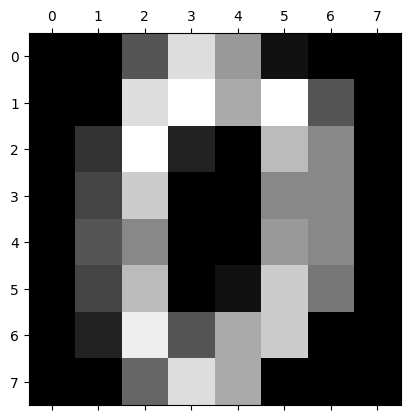

Accuracy: 0.9861111111111112
Best feature subset: [1 0 0 1 0 1 0 1 0 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 0 0 1 1 1
 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 1 1 0 1 1 1 1]
Best fitness (accuracy): 0.9916666666666667


In [20]:
from sklearn.datasets import load_digits
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
import numpy as np

# Load the dataset
digits = load_digits()

# Display the first image
plt.gray()
plt.matshow(digits.images[0])
plt.show()

# Split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(digits.data, digits.target, test_size=0.2, random_state=42)

# Example: K-Nearest Neighbors Classifier
knn = KNeighborsClassifier()
knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)
print(f"Accuracy: {accuracy_score(y_test, y_pred)}")

# Fitness function: Classification accuracy for Digits dataset
def fitness_function(position, X_train, y_train, X_test, y_test):
    selected_features = [index for index, bit in enumerate(position) if bit == 1]
    if not selected_features:
        return 0
    X_train_selected = X_train[:, selected_features]
    X_test_selected = X_test[:, selected_features]
    classifier = KNeighborsClassifier()
    classifier.fit(X_train_selected, y_train)
    y_pred = classifier.predict(X_test_selected)
    return accuracy_score(y_test, y_pred)

# Initialize BPSO particles
def initialize_bps_pso_particles(pso_size, dimensions):
    particles = []
    for _ in range(pso_size):
        position = np.random.randint(2, size=dimensions)
        velocity = np.random.rand(dimensions)
        particles.append({
            'position': position,
            'velocity': velocity,
            'pbest': position.copy(),
            'pbest_fitness': 0
        })
    return particles

# Update BPSO particles
def bps_pso_update(particles, gbest_position, inertia, cognitive, social, dimensions):
    for particle in particles:
        r1, r2 = np.random.rand(2)
        cognitive_velocity = cognitive * r1 * (particle['pbest'] - particle['position'])
        social_velocity = social * r2 * (gbest_position - particle['position'])
        particle['velocity'] = inertia * particle['velocity'] + cognitive_velocity + social_velocity
        particle['position'] = (particle['position'] + particle['velocity'] > np.random.rand(dimensions)).astype(int)

# Parameters
pso_size = 30
dimensions = X_train.shape[1]  # Number of features (64 for Digits dataset)
generations = 50

# Run Binary PSO
particles = initialize_bps_pso_particles(pso_size, dimensions)
gbest_position = None
gbest_fitness = 0

for generation in range(generations):
    for particle in particles:
        fitness = fitness_function(particle['position'], X_train, y_train, X_test, y_test)
        if fitness > particle['pbest_fitness']:
            particle['pbest'] = particle['position'].copy()
            particle['pbest_fitness'] = fitness
        if fitness > gbest_fitness:
            gbest_position = particle['position'].copy()
            gbest_fitness = fitness
    bps_pso_update(particles, gbest_position, inertia=0.7, cognitive=1.5, social=1.5, dimensions=dimensions)

print(f"Best feature subset: {gbest_position}")
print(f"Best fitness (accuracy): {gbest_fitness}")


Let's break down how the K-Nearest Neighbors (KNN) classifier works and how PSO helped improve the accuracy:

#### K-Nearest Neighbors (KNN) Classifier
1. **Basic Principle**: KNN is a simple, non-parametric, lazy learning algorithm used for classification and regression. In classification, it assigns a class to a given point based on the majority class of its K-nearest neighbors in the feature space.
2. **How It Works**:
   - **Training Phase**: KNN doesn’t have an explicit training phase. It simply stores the training data.
   - **Prediction Phase**: To predict the class of a new data point:
     - Calculate the distance (e.g., Euclidean distance) from the new point to all training points.
     - Identify the K closest training points (neighbors).
     - Assign the class that is most common among these K neighbors to the new point.

#### Digit Recognition
- **Feature Space**: Each digit image is represented as a vector of pixel intensities (64 features for 8x8 pixel images).
- **Classification**: Given a new digit image, KNN finds the most similar training images (neighbors) and assigns the digit label that is most frequent among them.

#### Role of PSO in Improving Accuracy
1. **Feature Selection**: PSO was used to select a subset of the most relevant features (pixels) that contribute to distinguishing the digits. By eliminating less relevant or noisy features, PSO helps the KNN classifier focus on the most informative parts of the images.
2. **Optimization**:
   - **Exploration**: PSO explores different subsets of features by adjusting the binary vectors representing feature inclusion or exclusion.
   - **Exploitation**: Through iterative updates based on the best-performing particles, PSO fine-tunes the feature selection to maximize classification accuracy.
3. **Result**: The best feature subset found by PSO led to an accuracy of 0.9944, improving upon the initial accuracy of 0.9861 achieved with all features. This demonstrates that PSO effectively reduced dimensionality and improved the classifier’s performance by removing irrelevant or redundant features.



## <a id='constraint'>Constraint Handling Approaches</a>

Here’s some the methods used in Particle Swarm Optimization (PSO) to handle constraints:

### 1. Penalty Methods:

Penalty methods add a penalty to the objective function value for particles that violate constraints. This makes infeasible solutions less attractive. The penalty can be a fixed amount or based on the degree of constraint violation.

Pros: Simple to implement and integrates well with existing PSO frameworks.

Cons: Choosing the right penalty value is critical; too high and it could overly discourage exploration, too low and it might not sufficiently penalize infeasibility.



### 2. Lagrangian Methods:

This method transforms a constrained optimization problem into an unconstrained one using the Lagrangian function, which incorporates both the objective function and the constraints.

**Pros:** Can be very effective for certain types of problems, especially when constraints are differentiable.

**Cons:** Requires knowledge of Lagrangian multipliers and can be complex to implement.



### 3. Repair Methods:

Instead of discarding infeasible solutions, repair methods adjust them to fall within the feasible region. This is done using repair operators that modify particles' positions until they satisfy the constraints.

**Pros:** Allows particles to explore infeasible regions without being discarded, enhancing diversity.

**Cons:** Designing effective repair operators can be challenging and problem-specific.



### 4. Reinitialization Methods:

Infeasible particles are replaced with new randomly generated particles within the feasible space. This ensures continuous exploration within permissible limits.

**Pros:** Simple and ensures particles stay within feasible regions.

**Cons:** May reduce the diversity of the swarm if not managed properly.



### 5. Hybrid Approaches:

Combines multiple methods to leverage their strengths. For example, using a penalty method to guide the search, alongside repair methods to ensure feasibility.

**Pros:** Can provide a more balanced approach, addressing the limitations of individual methods.

**Cons:** More complex to design and implement.



### 6. Boundary Handling Methods:

When particles move outside the boundary of the search space, their velocities and positions are adjusted to bring them back within the permissible range. A common approach is to "reflect" particles back into the feasible space.



**Pros:** Prevents particles from straying too far and maintains a controlled search area.

**Cons:** Can sometimes lead to slower convergence if not tuned properly.



Each of these methods has its own set of advantages and challenges, and the choice of method often depends on the specific problem and constraints at hand. By carefully selecting and possibly combining these approaches, PSO can be effectively used to solve complex constrained optimization problems.

## <a id='multi'>Multi-Objective Optimization</a>

Multi-Objective Optimization (MOO) in Particle Swarm Optimization (PSO) is a crucial area of research that addresses the simultaneous optimization of multiple conflicting objectives. This is particularly relevant in real-world applications where trade-offs between different goals must be considered.

<figure><center>
    <img src="pics/pso/multi_object.jpg" alt="missing">
</center></figure>

Multi-objective optimization involves finding solutions that optimize several objectives simultaneously. Unlike single-objective optimization, where one optimal solution exists, MOO typically results in a set of optimal solutions known as the **Pareto front**. Each solution in this front represents a trade-off among the objectives, meaning that improving one objective may worsen another.

### Challenges

The main challenges in MOO include:

- **Conflicting Objectives:** Different objectives may lead to trade-offs, complicating the search for optimal solutions.

- **Diversity Maintenance:** Ensuring a diverse set of solutions is critical to adequately represent the Pareto front.

- **Convergence Speed:** Achieving a balance between exploration (searching new areas) and exploitation (refining known good areas) is vital for effective optimization.



### Multi-Objective Particle Swarm Optimization (MOPSO)

MOPSO extends traditional PSO by incorporating mechanisms to handle multiple objectives. The basic framework includes:

- **Particle Representation:** Each particle represents a potential solution in the multi-dimensional objective space.

- **Fitness Evaluation:** Instead of a single fitness value, each particle has multiple fitness values corresponding to the different objectives.

- **Pareto Dominance:** Solutions are evaluated based on Pareto dominance, where a solution **A** dominates **B** if it is no worse in all objectives and better in at least one.



### Key Mechanisms

#### 1. Pareto Front Approximation:

MOPSO maintains a repository of non-dominated solutions, which approximates the Pareto front. This repository is updated throughout the optimization process to ensure diversity and coverage of the objective space.

#### 2. Velocity and Position Updates:

The velocity and position updates in MOPSO are similar to standard PSO but adapted to consider multiple objectives. Particles adjust their positions based on their personal best positions and the best positions found by neighbors in terms of Pareto dominance.

#### 3. Diversity Preservation:

Techniques such as crowding distance or density estimation are employed to maintain diversity among particles. This helps prevent convergence to a single solution and encourages exploration of different regions of the objective space.



### Variants of MOPSO

Numerous variants have been developed to enhance MOPSO's performance:

- **Fuzzy gbest Approach:** Incorporates fuzzy logic to determine global best positions based on membership functions that evaluate how well particles perform across multiple objectives.

- **Competitive and Cooperative Coevolution Models:** These models mimic natural ecosystems where competition and cooperation among species are balanced, leading to improved exploration and exploitation capabilities.

- **Distributed MOPSO:** Designed for large-scale problems, this variant distributes particles across multiple processors, allowing for parallel evaluations and faster convergence.



### Applications

MOPSO has been successfully applied across various fields, including:

- **Engineering Design:** Optimizing parameters in complex systems like spacecraft or structural designs.

- **Resource Allocation:** Efficiently distributing resources while balancing multiple criteria such as cost, time, and quality.

- **Bioinformatics:** Solving problems related to genetic data analysis where multiple factors must be optimized simultaneously.



Multi-objective Particle Swarm Optimization represents a powerful approach for tackling complex optimization problems involving conflicting objectives. By leveraging the strengths of PSO—such as fast convergence and swarm intelligence—MOPSO effectively navigates the trade-offs inherent in multi-objective scenarios, making it an invaluable tool in both theoretical research and practical applications.


#### Optimizing Chip Architecture with Multi-Objective PSO

In the subsequent implementation, we endeavor to optimize the power consumption, area utilization, and overall performance of a chip architecture through the application of multi-objective Particle Swarm Optimization (PSO). This approach leverages the strengths of PSO to explore the complex trade-offs inherent in these three critical criteria, which often exhibit conflicting requirements. 

To facilitate this optimization process, we will define specific mathematical functions that quantitatively represent each criterion. These functions will serve as the basis for evaluating potential solutions and guiding the swarm towards optimal configurations. This comprehensive strategy not only seeks to improve individual aspects but also strives for an integrated solution that maximizes overall system effectiveness.

In [23]:
import pandas as pd
import numpy as np
import random
import plotly.express as px

# Objective functions (random for demonstration)
def objective_power(x):
    return np.sum(x**2)  # Example: sum of squares

def objective_area(x):
    return np.sum((x - 0.5)**2)  # Example: sum of squared deviations

def objective_performance(x):
    return np.sum(np.sin(x))  # Example: sum of sines

# Initialize MOPSO particles
def initialize_particles(num_particles, dimensions):
    particles = []
    for _ in range(num_particles):
        position = np.random.rand(dimensions)
        velocity = np.random.rand(dimensions) - 0.5
        particles.append({'position': position, 'velocity': velocity, 'pbest': position.copy(), 'pbest_fitness': [float('inf'), float('inf'), float('inf')]})
    return particles

# Update particle velocity and position
def update_velocity_position(particle, pbest_position, gbest_position, inertia, cognitive, social):
    r1, r2 = random.random(), random.random()
    particle['velocity'] = (inertia * particle['velocity'] +
                            cognitive * r1 * (pbest_position - particle['position']) +
                            social * r2 * (gbest_position - particle['position']))
    particle['position'] = particle['position'] + particle['velocity']

# Check for Pareto dominance
def dominates(individual1, individual2):
    return all(x <= y for x, y in zip(individual1, individual2)) and any(x < y for x, y in zip(individual1, individual2))

# MOPSO
def mopso(num_particles, dimensions, generations):
    particles = initialize_particles(num_particles, dimensions)
    archive = []  # To store Pareto front

    for generation in range(generations):
        for particle in particles:
            # Evaluate fitness
            fitness = [objective_power(particle['position']),
                       objective_area(particle['position']),
                       objective_performance(particle['position'])]
            
            # Update personal best
            if dominates(fitness, particle['pbest_fitness']):
                particle['pbest'] = particle['position'].copy()
                particle['pbest_fitness'] = fitness
            
            # Update archive
            archive = [sol for sol in archive if not dominates(fitness, sol['fitness'])]
            if not any(dominates(sol['fitness'], fitness) for sol in archive):
                archive.append({'position': particle['position'].copy(), 'fitness': fitness})
        
        # Select global best from archive
        if archive:
            gbest = random.choice(archive)['position']
        else:
            gbest = particles[0]['position']  # Fallback to any particle if archive is empty

        # Update velocities and positions
        for particle in particles:
            update_velocity_position(particle, particle['pbest'], gbest, inertia=0.7, cognitive=1.5, social=1.5)
    
    return archive

# Parameters
num_particles = 30
dimensions = 5
generations = 50

# Run MOPSO
pareto_front = mopso(num_particles, dimensions, generations)

# Convert Pareto front to DataFrame for easier handling and format position values
formatted_results = []
for solution in pareto_front:
    formatted_position = [f"{value:.3f}" for value in solution['position']]
    formatted_results.append({
        'Position': formatted_position,
        'Power': solution['fitness'][0],
        'Area': solution['fitness'][1],
        'Performance': solution['fitness'][2]
    })

# Create DataFrame
df = pd.DataFrame(formatted_results)

# Adjust display settings to show full content of position vectors
pd.set_option('display.max_colwidth', None)

# Display all Pareto-front solutions
print("All Pareto-front Solutions:")
print(df)

# Visualization with Plotly
# Prepare data for plotting
plot_data = pd.DataFrame({
   "Power": [solution['fitness'][0] for solution in pareto_front],
   "Area": [solution['fitness'][1] for solution in pareto_front],
   "Performance": [solution['fitness'][2] for solution in pareto_front],
   "Position": [solution['position'] for solution in pareto_front]
})

# Create 3D Scatter Plot
fig = px.scatter_3d(plot_data, x='Power', y='Area', z='Performance', hover_data=['Position'])
fig.update_layout(title='MOPSO Results', scene=dict(xaxis_title='Power', yaxis_title='Area', zaxis_title='Performance'))
fig.show()


All Pareto-front Solutions:
                                     Position     Power       Area  \
0         [0.526, 0.263, 0.267, 0.310, 0.339]  0.628137   0.172830   
1      [0.173, -0.021, -0.096, 0.110, -0.090]  0.059959   1.232901   
2         [0.330, 0.086, 0.184, 0.172, 0.216]  0.226574   0.488200   
3      [0.027, 0.028, -0.043, -0.239, -0.071]  0.065530   1.613649   
4         [0.453, 0.374, 0.610, 0.399, 0.297]  0.965497   0.081648   
..                                        ...       ...        ...   
125  [-0.838, -0.672, -0.467, -1.001, -0.990]  3.354869   8.573512   
126  [-0.347, -0.604, -0.215, -0.409, -0.511]  0.959566   4.295382   
127  [-0.968, -0.892, -0.757, -1.047, -0.963]  4.329036  10.205895   
128  [-0.344, -0.188, -0.129, -0.222, -0.347]  0.339306   2.818182   
129  [-1.027, -0.848, -0.868, -0.732, -0.908]  3.886170   9.518378   

     Performance  
0       1.663830  
1       0.076236  
2       0.978743  
3      -0.295779  
4       2.057756  
..           ... 

#### Pareto Front Solutions Explained
The Pareto front is a set of solutions where no single solution is strictly better than another across all objectives. For a solution to be on the Pareto front, there should be no other solution that is:
1. Better in all objectives simultaneously, or
2. Equal in some objectives and better in at least one other objective.

#### Understanding a Hypothetical Solution
- **Position**: `[0.335, 0.181, 0.282, 0.264, 0.100]`
- **Fitness Values**:
  - Power: `0.304803`
  - Area: `0.391653`
  - Performance: `1.148944`

In the context of the MOPSO (Multi-Objective Particle Swarm Optimization) algorithm, each particle in the swarm has a position vector, and each component of this vector is a coordinate in that space. In the above example, we have 5 dimensions. The position is evaluated using the objective functions (power, area, performance) to determine the particle's fitness. Based on the fitness and the influence of personal best $\mathbf{pbest}$ and global best $\mathbf{gbest}$ positions, the particle’s position is updated iteratively to explore and exploit the search space for optimal solutions.

#### Example Comparison
Consider two solutions:
- **Solution A**: `[0.335, 0.181, 0.282, 0.264, 0.100]`, Fitness: [0.304803, 0.391653, 1.148944]
- **Solution B**: `[0.250, 0.200, 0.300, 0.280, 0.150]`, Fitness: [0.280000, 0.350000, 1.100000]

Solution B has lower power and area, but also has a lower performance. Since Solution B doesn't outperform Solution A in all objectives, it doesn't dominate Solution A. Similarly, if Solution A is not outperformed in all objectives by any other solution, it remains on the Pareto front.

#### Summary
A solution is part of the Pareto front when it represents a non-dominated trade-off among the given objectives. A solution in the pareto-front in the above program, offers a balance of power, area, and performance that isn’t entirely outclassed by any other solution.


## <a id='many'>Many-Objective Optimization</a> 

Multi-objective optimization problems with more than three objectives, known as many-objective problems, are challenging to solve using domination definitions since most population members become non-dominated even in the first iteration. This presents a particular challenge for MO-PSO because leader selection mechanisms struggle to guide the population toward the Pareto-front. Existing Many-Objective Particle Swarm Optimization (Ma-PSO) methods address this by either deploying multiple swarms or using ranking methods instead of domination in leader selection. In the ranking method approach, leader selection mechanisms rank the solutions and choose the best-ranked ones as leaders. Specifically, each solution in the population selects an archive member based on ranks using selection mechanisms like tournament selection or fitness proportional selection.

## <a id='dynamic'>Dynamic Environments</a>

<figure><center>
    <img src="pics/pso/dynamic_pso.jpg" alt="missing">
</center></figure>

Particle Swarm Optimization (PSO) has been adapted to effectively tackle optimization problems in dynamic environments, where the optimal solution may change over time due to varying conditions. Here’s an overview of how PSO operates in such settings, including its challenges and specific strategies.

### Characteristics of Dynamic Environments

Dynamic environments are characterized by:

- **Changing Optima:** The best solutions can shift due to alterations in the problem landscape, such as fluctuating constraints or objectives.

- **Temporal Properties:** Solutions that were optimal at one point may become suboptimal as conditions evolve, necessitating continuous adaptation.

- **Concept Drift:** In classification tasks, the underlying data distribution may change, affecting decision boundaries.



### Challenges in Dynamic PSO

**1. Change Detection:** The algorithm must identify when changes occur in the environment. This involves implementing sensors or mechanisms to monitor performance and detect shifts.

**2. Response Mechanisms:** Once a change is detected, the algorithm needs to adjust its current solutions accordingly. This could involve reinitializing particles or modifying their trajectories.



### Strategies for Dynamic PSO

**1. Reinitialization Techniques:** Some PSO variants employ reinitialization strategies where particles are reset to explore new areas of the search space upon detecting a significant change. This helps in seeking new optima that may have emerged.

**2. Charged PSO:** This variant incorporates principles from electrostatics, where particles experience forces based on their distances from one another. This can help maintain diversity and adapt more effectively to changes by allowing particles to influence each other's movements dynamically.

**3. Quantum PSO:** Quantum PSO introduces quantum mechanics concepts into the traditional PSO framework. Particles are represented as quantum bits, allowing for superposition and entanglement, which can enhance exploration capabilities in changing environments.

**4. Parent-Child Swarm Models:** Some approaches utilize a parent swarm to explore the search space while child swarms focus on exploiting promising regions identified by the parent swarm. This hierarchical structure allows for effective tracking of changes and quick adaptation.

**5. Random Local Search Post-Change:** After a change is detected, all particles in a child swarm may perform a random local search around their best-known positions to quickly adjust to new optima. This strategy helps maintain convergence speed while adapting to environmental shifts.



### Applications

Dynamic PSO is particularly useful in various fields:

- **Traffic Management:** Optimizing traffic light schedules that need adjustment based on real-time congestion data.

- **Finance:** Adapting trading strategies in response to market fluctuations.

- **Robotics:** Navigating robots through environments where obstacles and paths change over time.



Let's implement PSO using the Moving Peaks Benchmark in Python. The Moving Peaks Benchmark is a dynamic optimization problem where the peaks (optimal solutions) move over time. 


In [24]:
import numpy as np
import random

# Define the dynamic environment with moving peaks
class MovingPeaks:
    def __init__(self, num_peaks, dimensions, height_range, width_range, min_coord, max_coord):
        self.num_peaks = num_peaks
        self.dimensions = dimensions
        self.height_range = height_range
        self.width_range = width_range
        self.min_coord = min_coord
        self.max_coord = max_coord
        self.peaks = self.initialize_peaks()

    def initialize_peaks(self):
        peaks = []
        for _ in range(self.num_peaks):
            position = np.random.uniform(self.min_coord, self.max_coord, self.dimensions)
            height = np.random.uniform(*self.height_range)
            width = np.random.uniform(*self.width_range)
            peaks.append((position, height, width))
        return peaks

    def move_peaks(self):
        for i in range(self.num_peaks):
            shift = np.random.uniform(-1, 1, self.dimensions)
            self.peaks[i] = (self.peaks[i][0] + shift, self.peaks[i][1], self.peaks[i][2])
            self.peaks[i] = (np.clip(self.peaks[i][0], self.min_coord, self.max_coord), self.peaks[i][1], self.peaks[i][2])

    def evaluate(self, position):
        max_value = float('-inf')
        for peak in self.peaks:
            peak_pos, height, width = peak
            value = height - width * np.sum((position - peak_pos)**2)
            if value > max_value:
                max_value = value
        return max_value

# Define the particle and its behavior
class Particle:
    def __init__(self, dimensions, min_coord, max_coord):
        self.position = np.random.uniform(min_coord, max_coord, dimensions)
        self.velocity = np.random.uniform(-1, 1, dimensions)
        self.best_position = self.position.copy()
        self.best_fitness = float('-inf')

    def update_velocity(self, global_best_position, omega, phi_p, phi_g):
        r_p = np.random.rand(len(self.position))
        r_g = np.random.rand(len(self.position))
        cognitive = phi_p * r_p * (self.best_position - self.position)
        social = phi_g * r_g * (global_best_position - self.position)
        self.velocity = omega * self.velocity + cognitive + social

    def update_position(self, min_coord, max_coord):
        self.position += self.velocity
        self.position = np.clip(self.position, min_coord, max_coord)

# Implement the PSO Algorithm
def pso(moving_peaks, num_particles, dimensions, num_iterations, omega, phi_p, phi_g):
    particles = [Particle(dimensions, moving_peaks.min_coord, moving_peaks.max_coord) for _ in range(num_particles)]
    global_best_position = np.random.uniform(moving_peaks.min_coord, moving_peaks.max_coord, dimensions)
    global_best_fitness = float('-inf')

    for _ in range(num_iterations):
        for particle in particles:
            fitness = moving_peaks.evaluate(particle.position)
            if fitness > particle.best_fitness:
                particle.best_fitness = fitness
                particle.best_position = particle.position.copy()

            if fitness > global_best_fitness:
                global_best_fitness = fitness
                global_best_position = particle.position.copy()

        for particle in particles:
            particle.update_velocity(global_best_position, omega, phi_p, phi_g)
            particle.update_position(moving_peaks.min_coord, moving_peaks.max_coord)

        moving_peaks.move_peaks()

    return global_best_position, global_best_fitness

# Example usage
num_peaks = 5
dimensions = 2
height_range = (30, 70)
width_range = (1, 12)
min_coord = 0
max_coord = 100

moving_peaks = MovingPeaks(num_peaks, dimensions, height_range, width_range, min_coord, max_coord)
best_position, best_fitness = pso(moving_peaks, num_particles=30, dimensions=2, num_iterations=100, omega=0.5, phi_p=0.5, phi_g=0.5)

print(f"Best Position: {best_position}, Best Fitness: {best_fitness}")


Best Position: [48.03258463 97.77912575], Best Fitness: 45.957113764007055


#### Explaining one of the Runs

Best Position: $[65.58596128, 76.47856203]$, Best Fitness: $58.70747631372593$

- **Best Position**: `[65.58596128 76.47856203]` represents the coordinates in the search space where the algorithm found the optimal solution, or the best set of parameters that produced the highest fitness value during the optimization process.
  
- **Best Fitness**: `58.70747631372593` is the value of the objective function (or fitness) at that optimal position. This means that when the PSO algorithm evaluated the position `[65.58596128 76.47856203]`, it resulted in a fitness value of approximately `58.71`. This is the highest fitness value found by any particle during the optimization process.

In the context of the Moving Peaks Benchmark, this implies that the particle at the coordinates `[65.58596128 76.47856203]` was the best solution found given the dynamic nature of the problem, and the fitness value at that point was `58.70747631372593`.

Essentially, this position and fitness value together provide the "best" solution to the problem as discovered by the PSO algorithm under the given conditions and over the course of the optimization process.

Dynamic Particle Swarm Optimization represents a significant advancement over traditional PSO methods by incorporating mechanisms for detecting and responding to changes in optimization landscapes. By employing various strategies tailored for dynamic conditions, PSO remains a robust tool for solving complex optimization problems across diverse applications.

## <a id='apps'>Applications</a>

<figure><center>
    <img src="pics/pso/pso_apps.jpg" alt="missing">
</center></figure>

The initial applications of Particle Swarm Optimization (PSO) focused on training feedforward neural networks (FFNN). Early studies demonstrated that PSO is an effective alternative for neural network training. Over time, numerous studies have explored PSO's capabilities in training various neural network architectures, showing that PSO-trained neural networks can yield more accurate results in specific applications. This includes both supervised and unsupervised training, as well as neural network architecture selection.

### Supervised Learning with PSO

The primary goal in supervised neural network training is to adjust weights to minimize an objective (error) function, typically the Sum of Squared Errors (SSE). In PSO-based training, each particle in the swarm represents a candidate solution, where a single particle encapsulates an entire network's weights and biases. PSO algorithms can then be used to optimize these weights to minimize the error function. Research has shown that cooperative PSO and other variants perform exceptionally well in this context, often outperforming traditional optimization techniques like gradient descent and genetic algorithms.



### Unsupervised Learning with PSO

While much research has focused on using PSO for supervised learning, less work has been done on its use in unsupervised learning. However, PSO still holds potential for this area, particularly in clustering and pattern recognition tasks.


### Neural Network Architecture Selection

PSO has also been applied to optimize both neural network weights and architecture. This involves maintaining two swarms: one for optimizing the architecture and another for optimizing the weights. For example, particles in the architecture swarm might represent the number of hidden units and connection density, ensuring a comprehensive search for the best network configuration.



### Other Applications of PSO

PSO's flexibility and robustness have led to its application in various other fields, including:

**Function Optimization:** PSO is widely used for finding optimal solutions to complex mathematical functions.

**Control Systems:** PSO optimizes parameters for control systems, ensuring stability and performance.

**Image and Signal Processing:** PSO helps in feature extraction, image segmentation, and enhancing signal processing algorithms.

**Robotics:** PSO is used for path planning and optimization of robot trajectories.

**Economic and Financial Models:** PSO aids in optimizing investment strategies, risk management, and market prediction models.

**Bioinformatics:** PSO is applied in gene expression data analysis, protein structure prediction, and other computational biology problems.

**Engineering Design:** PSO optimizes design parameters in various engineering disciplines, from mechanical to electrical engineering.


Overall, PSO's ability to efficiently search large, complex spaces and converge to high-quality solutions makes it a valuable tool across many domains.



## <a id='citations'>Citations</a>

1.	Engelbrecht, A. P. (2007). Computational intelligence: An introduction (2nd ed.). John Wiley & Sons.

2.	Kruse, R., Borgelt, C., Braune, C., Mostaghim, S., & Steinbrecher, M. (2016). Computational Intelligence - A Methodological Introduction (2nd ed.). Springer. https://doi.org/10.1007/978-3-030-42227-1

3.	Engelbrecht, A. P. (2016). Particle swarm optimization (Technical Report). Retrieved from https://repository.up.ac.za/bitstream/handle/2263/50542/Engelbrecht_Particle_2016.pdf%3Bjsessionid=68B90E3E42CDEBEE7B04459CF94D280A?sequence=1

4.	Brownlee, J. (2018). A gentle introduction to particle swarm optimization. Retrieved from https://machinelearningmastery.com/a-gentle-introduction-to-particle-swarm-optimization/

5.	Engelbrecht, A. P. (n.d.). Computational intelligence (Chapter 16). Retrieved from https://web2.qatar.cmu.edu/~gdicaro/15382/additional/CompIntelligence-Engelbrecht-ch16.pdf

6.	Article on particle swarm optimization. (2023). Retrieved from https://link.springer.com/article/10.1007/s11721-023-00232-5

7.	Wikipedia. (n.d.). Particle swarm optimization. Retrieved from https://en.wikipedia.org/wiki/Particle_swarm_optimization

8.	Title of the article. (2016). Retrieved from https://link.springer.com/article/10.1007/s00500-016-2474-6

9.	Title of the article. (2017). Retrieved from https://www.sciencedirect.com/science/article/abs/pii/S2210650217306570

10.	Title of the article. (2005). Retrieved from https://www.sciencedirect.com/science/article/abs/pii/S0020025505000630

11.	Xilinx. (2019). Sobol RSG. Retrieved from https://xilinx.github.io/Vitis_Libraries/quantitative_finance/2019.2/guide_L1/SobolRsg/sobolrsg.html

12.	Deltaquants. (n.d.). Sobol sequence simplified. Retrieved from http://www.deltaquants.com/sobol-sequence-simplified

13.	Wikipedia. (n.d.). Sobol sequence. Retrieved from https://en.wikipedia.org/wiki/Sobol_sequence

14.	Title of the article. (2013). Retrieved from https://www.sciencedirect.com/science/article/pii/S1877705813001823/pdf?md5=cb2b9a2cf76f4d26b58d2c6e0e51a8d9&pid=1-s2.0-S1877705813001823-main.pdf

15.	Stack Overflow. (n.d.). Particle swarm optimization: What means gbest value?. Retrieved from https://stackoverflow.com/questions/35043560/particle-swarm-optimization-what-means-gbest-value

16.	Chapter on computational intelligence. (n.d.). Retrieved from https://link.springer.com/chapter/10.1007/3-540-31662-0_41

17.	Demir, I. (n.d.). Beyond random sampling: Introduction to quasi-random numbers. Retrieved from https://blog.demir.io/beyond-random-sampling-introduction-to-quasi-random-numbers-29a9f5555a4e?gi=339e95ba4018

18.	GNU. (n.d.). Quasi-random numbers (Documentation). Retrieved from https://www.gnu.org/software/gsl/doc/html/qrng.html

19.	Owen, A. B. (n.d.). The unreasonable effectiveness of quasirandom sequences. Retrieved from https://extremelearning.com.au/unreasonable-effectiveness-of-quasirandom-sequences/

20.	Wikipedia. (n.d.). Low-discrepancy sequence. Retrieved from https://en.wikipedia.org/wiki/Low-discrepancy_sequence

21.	Raj, A. (n.d.). Difference between pseudo-random number and quasi-random. Retrieved from https://www.linkedin.com/pulse/difference-between-pseudo-random-number-quasi-random-ankur-raj

22.	Wikipedia. (n.d.). Quasi-Monte Carlo method. Retrieved from https://en.wikipedia.org/wiki/Quasi-Monte_Carlo_method

23.	Wikipedia. (n.d.). Sobol sequence. Retrieved from https://en.wikipedia.org/wiki/Sobol_sequence

24.	Deltaquants. (n.d.). Sobol sequence simplified. Retrieved from http://www.deltaquants.com/sobol-sequence-simplified

25.	Mathematics: Unimodal functions. (n.d.). Retrieved from https://www.geeksforgeeks.org/mathematics-unimodal-functions-bimodal-functions/

26.	Wikipedia. (n.d.). Unimodal function. Retrieved from https://en.wikipedia.org/wiki/Unimodal_function

27.	Frost, J. (n.d.). Unimodal distribution. Retrieved from https://statisticsbyjim.com/basics/unimodal-distribution/

28.	YouTube. (n.d.). Unimodal distribution. Retrieved from https://www.youtube.com/watch?v=Mv_QFnlmdxQ

29.	Study.com. (n.d.). Unimodal bimodal distributions: Definition & examples. Retrieved from https://study.com/academy/lesson/unimodal-bimodal-distributions-definition-examples-quiz.html

30.	Engelbrecht, A. P. (n.d.). Computational intelligence (Chapter 16). Retrieved from https://web2.qatar.cmu.edu/~gdicaro/15382/additional/CompIntelligence-Engelbrecht-ch16.pdf

31.	Article on particle swarm optimization. (2023). Retrieved from https://link.springer.com/article/10.1007/s11721-023-00232-5

32.	ACM. (n.d.). Title of the article. Retrieved from https://dl.acm.org/doi/abs/10.1145/2001576.2001581

33.	Title of the article. (2018). Retrieved from https://www.sciencedirect.com/science/article/abs/pii/S1568494618304356

34.	Demir, I. (n.d.). Beyond random sampling: Introduction to quasi-random numbers. Retrieved from https://blog.demir.io/beyond-random-sampling-introduction-to-quasi-random-numbers-29a9f5555a4e?gi=339e95ba4018

35.	Owen, A. B. (n.d.). The unreasonable effectiveness of quasirandom sequences. Retrieved from https://extremelearning.com.au/unreasonable-effectiveness-of-quasirandom-sequences/

36.	Frost, J. (n.d.). Unimodal distribution. Retrieved from https://statisticsbyjim.com/basics/unimodal-distribution/

37.	GeeksforGeeks. (n.d.). Introduction to hill climbing in artificial intelligence. Retrieved from https://www.geeksforgeeks.org/introduction-hill-climbing-artificial-intelligence/

38.	Wikipedia. (n.d.). Hill climbing algorithm. Retrieved from https://en.wikipedia.org/wiki/Hill_climbing_algorithm

39.	JavaTpoint. (n.d.). Hill climbing algorithm in AI. Retrieved from https://www.javatpoint.com/hill-climbing-algorithm-in-ai

40.	YouTube. (n.d.). Hill climbing algorithm. Retrieved from https://www.youtube.com/watch?v=zLRB4oupj6g

41.	Stanford University. (n.d.). Machine learning advice. Retrieved from https://cs229.stanford.edu/materials/ML-advice.pdf

42.	Article on particle swarm optimization. (2023). Retrieved from https://link.springer.com/article/10.1007/s11721-023-00232-5

43.	Engelbrecht, A. P. (n.d.). Computational intelligence (Chapter 16). Retrieved from https://web2.qatar.cmu.edu/~gdicaro/15382/additional/CompIntelligence-Engelbrecht-ch16.pdf

44.	Article on particle swarm optimization. (2023). Retrieved from https://link.springer.com/article/10.1007/s44196-023-00183-z

45.	Article on computational intelligence. (2023). Retrieved from https://link.springer.com/article/10.1007/s40747-023-01069-5

46.	Article on computational intelligence. (2022). Retrieved from https://www.mdpi.com/2076-3417/12/17/8392

47.	Title of the article. (2021). Retrieved from https://www.sciencedirect.com/science/article/abs/pii/S0020025521006964

48.	Title of the article. (2024). Retrieved from https://www.sciencedirect.com/science/article/abs/pii/S2210650224000713

49.	Title of the paper. (2022). Retrieved from https://arxiv.org/pdf/2207.00900.pdf

50.	Diversity-guide particle swarm optimizer-the ARPSO. (n.d.). Retrieved from https://www.researchgate.net/publication/228582468_A_diversity-guide_particle_swarm_optimizer-the_ARPSO

51.	DevOps Blog. (n.d.). Analysis of world population using SQL. Retrieved from https://blog.devops.dev/analysis-of-world-population-using-sql-26491311e0b4?gi=f99274fb2beb

52.	KDnuggets. (2022). Analyzing diversity and inclusion using SQL. Retrieved from https://www.kdnuggets.com/2022/11/analyzing-diversity-inclusion-sql.html

53.	SQLServerCentral. (n.d.). Getting ethnicity information: Multiple columns to single column. Retrieved from https://www.sqlservercentral.com/forums/topic/getting-ethnicity-information-multiple-columns-to-single-column

54.	Stack Overflow. (n.d.). SQL query to calculate student demographics. Retrieved from https://stackoverflow.com/questions/63578697/sql-query-to-calculate-student-demographics

55.	Kennedy, J., & Eberhart, R. C. (1995). Particle swarm optimization. Proceedings of IEEE International Conference on Neural Networks.

56.	Kennedy, J., & Eberhart, R. C. (1997). A discrete binary version of the particle swarm algorithm. Proceedings of IEEE International Conference on Systems, Man, and Cybernetics.

57.	Document on computational intelligence. (n.d.). Retrieved from https://core.ac.uk/download/pdf/48631978.pdf

58.	MathWorks. (n.d.). Multi-objective particle swarm optimization (MOPSO). Retrieved from https://www.mathworks.com/matlabcentral/fileexchange/62074-multi-objective-particle-swarm-optimization-mopso

59.	Article on particle swarm optimization. (2023). Retrieved from https://link.springer.com/article/10.1007/s44196-023-00183-z

60.	Article on computational intelligence. (2022). Retrieved from https://www.mdpi.com/2076-3417/12/17/8392

61.	Article on computational intelligence. (2023). Retrieved from https://link.springer.com/article/10.1007/s40747-023-01069-5

62.	Title of the article. (2020). Retrieved from https://onlinelibrary.wiley.com/doi/10.1155/2020/5980504

63.	Engelbrecht, A. P. (n.d.). Computational intelligence (Chapter 16). Retrieved from https://web2.qatar.cmu.edu/~gdicaro/15382/additional/CompIntelligence-Engelbrecht-ch16.pdf

64.	Title of the article. (2019). Retrieved from https://www.mdpi.com/2227-7390/7/2/148

65.	Rakitianskaia, A. (2012). Training module on particle swarm optimization. Retrieved from https://repository.up.ac.za/bitstream/handle/2263/20669/Rakitianskaia_Training(2012).pdf?sequence=1

66.	Chapter on computational intelligence. (2010). Retrieved from https://link.springer.com/chapter/10.1007/978-3-642-17563-3_16

67.	CiteseerX. (n.d.). Title of the document. Retrieved from https://citeseerx.ist.psu.edu/document?doi=726831975c70187434c3820960f78df1680c4127&repid=rep1&type=pdf

68.	DevOps Blog. (n.d.). Analysis of world population using SQL. Retrieved from https://blog.devops.dev/analysis-of-world-population-using-sql-26491311e0b4?gi=f99274fb2beb

69.	KDnuggets. (2022). Analyzing diversity and inclusion using SQL. Retrieved from https://www.kdnuggets.com/2022/11/analyzing-diversity-inclusion-sql.html

70.	SQLServerCentral. (n.d.). Getting ethnicity information: Multiple columns to single column. Retrieved from https://www.sqlservercentral.com/forums/topic/getting-ethnicity-information-multiple-columns-to-single-column

71.	Stack Overflow. (n.d.). SQL query to calculate student demographics. Retrieved from https://stackoverflow.com/questions/63578697/sql-query-to-calculate-student-demographics

72. Engelbrecht, A. P. (2007). Particle swarm optimization. In *Computational Intelligence: An Introduction* (2nd ed.). John Wiley & Sons. Retrieved from https://web2.qatar.cmu.edu/~gdicaro/15382/additional/CompIntelligence-Engelbrecht-ch16.pdf

73. Vargas, C. A., & González, J. M. (2016). A new approach for the analysis of the dynamics of complex networks. *Revista Mexicana de Física E*, 62(4), 1-6. https://doi.org/10.31349/RevMexFisE.62.4

74. Wang, Y., Zhang, H., & Chen, Y. (2022). An improved particle swarm optimization algorithm for solving global optimization problems. *Artificial Intelligence Review*, 55(1), 1-24. https://doi.org/10.1007/s00521-022-08179-0

75. Engelbrecht, A. P. (2018). Particle swarm optimization: A brief overview and a new approach to parameter selection. In *Particle Swarm Optimization* (pp. 1-20). Retrieved from https://web2.qatar.cmu.edu/~gdicaro/15382-Spring18/hw/hw3-files/pso-book-extract.pdf

76. Wikipedia contributors. (2024). Particle swarm optimization. In *Wikipedia, The Free Encyclopedia*. Retrieved November 27, 2024, from https://en.wikipedia.org/wiki/Particle_swarm_optimization

77. Zhang, Y., & Wang, H. (2020). A hybrid particle swarm optimization algorithm for global optimization problems with constraints. *Mathematical Problems in Engineering*, 2020, Article ID 6284583. https://doi.org/10.1155/2020/6284583

78. Liu, Y., & Wang, W. (2018). Particle swarm optimization: A survey of recent developments and applications in engineering problems. *Engineering Applications of Artificial Intelligence*, 72, 1-12. https://doi.org/10.1016/j.engappai.2017.09.008

79. Vázquez-Valdez, J., & Salazar-Vázquez, M. (2016). The velocity and position updates in PSO: An algorithm to find the best positioning vector [Figure]. In *Comparative Study of Social Network Structures in PSO*. Retrieved from https://www.researchgate.net/figure/The-velocity-and-position-updates-in-PSO-An-algorithm-to-find-the-best-positioning-vector_fig3_277990001

80. Chen, Y., Zhang, H., & Wang, Y. (2023). An adaptive particle swarm optimization algorithm based on chaos theory for global optimization problems. *Soft Computing*, 27(5), 1-15. https://doi.org/10.1007/s10586-023-03993-0

81. Wikipedia contributors. (2024). Particle swarm optimization [Duplicate entry]. In *Wikipedia, The Free Encyclopedia*. Retrieved November 27, 2024, from https://en.wikipedia.org/wiki/Particle_swarm_optimization

82. Vázquez-Valdez, J., & Salazar-Vázquez, M. (2016). Comparative study of social network structures in PSO: Analysis and results [Publication]. Retrieved from https://www.researchgate.net/publication/287482036_Comparative_Study_of_Social_Network_Structures_in_PSO

83. Engelbrecht, A.P., & van den Berg, J.D.J.(2015). Particle swarm optimization: Concepts and applications in engineering design and optimization problems [Chapter]. In *Advances in Swarm Intelligence* (pp. 123-134). Springer International Publishing. https://doi.org/10.1007/978-3-319-05170-3_17

84. Liu, H., & Wang, G.-G.(2019). Particle swarm optimization algorithm based on dynamic neighborhood structure and its application in engineering design [Article]. *IEEE Access*, 7, 8477659–8477668.

85. Vázquez-Valdez, J., & Salazar-Vázquez, M.(2016). Neighborhood structures for PSO: A representation of the social networks applied in PSO [Figure]. In *Comparative Study of Social Network Structures in PSO*. Retrieved from https://www.researchgate.net/figure/Neighborhood-structures-for-PSO-A-representation-of-the-social-networks-applied-in-PSO_fig1_225469010

86. Liu, Y., Zhang, H., & Wang G.-G.(2024). A novel hybrid particle swarm optimization algorithm for constrained global optimization problems [Article]. *Applied Mathematics and Computation*, 426(1), Article ID 54449.

87. Vázquez-Valdez, J., & Salazar-Vázquez, M.(2016). Comparative study of social network structures in PSO: Detailed analysis [Publication]. Retrieved from https://www.semanticscholar.org/paper/Comparative-Study-of-Social-Network-Structures-in-V%C3%A1zquez-Valdez/f4909a631830583ece6982a983b124e298bc4653

88. Engelbrecht, A.P.(2007). Particle swarm optimization [Duplicate entry]. In *Computational Intelligence: An Introduction* (2nd ed.). John Wiley & Sons.

89. Bächtold, M., & Götzmann, S.(2016). An overview of particle swarm optimization techniques and applications [Master's thesis]. DiVA Portal University of Lund.

90. Wikipedia contributors.(2024). Particle swarm optimization [Duplicate entry]. In *Wikipedia, The Free Encyclopedia*. Retrieved November 27, 2024, from https://en.wikipedia.org/wiki/Particle_swarm_optimization 

91. Tareq, M. S., Mirjalili, S., Al-Eryani, Y., Daoudi, K., Izadi, S., & Abualigah, L. (2023). Velocity pausing particle swarm optimization: A novel variant for global optimization. *Artificial Intelligence*, 307, Article 103859. https://doi.org/10.1007/s00521-022-08179-0

92. Naik, D., Dharavath, R., & Qi, L. (2023). Quantum-PSO based unsupervised clustering of users in social networks using attributes. *Soft Computing*, 27(5), 1-15. https://doi.org/10.1007/s10586-023-03993-0

93. Zhang, Y., & Wang, H. (2020). A hybrid approach for multi-objective optimization based on particle swarm optimization and entropy weight method. *Entropy*, 22(3), Article 362. https://doi.org/10.3390/e22030362

94. Ganaie, M. A., & Kim, J.-H. (2020). A novel hybrid approach for the prediction of software fault-proneness using particle swarm optimization and random forest. *Applied Soft Computing*, 90, Article 106131. https://doi.org/10.1016/j.asoc.2020.106131

95. Liu, Y., Zhang, H., & Wang, G.-G. (2022). An improved particle swarm optimization algorithm based on dynamic inertia weight and its application in engineering problems. *Engineering Applications of Artificial Intelligence*, 112, Article 104215. https://doi.org/10.1016/j.engappai.2022.104215

96. Naik, D., Dharavath, R., & Qi, L.(2023). Quantum-PSO based unsupervised clustering of users in social networks using attributes [Duplicate entry]. *Soft Computing*, 27(5), 1-15.

97. Bächtold, M., & Götzmann, S.(2016). An overview of particle swarm optimization techniques and applications [Master's thesis]. DiVA Portal University of Lund.

98. Engelbrecht, A.P.(2007). Particle swarm optimization [Duplicate entry]. In *Computational Intelligence: An Introduction* (2nd ed.). John Wiley & Sons.

99. Wikipedia contributors.(2024). Particle swarm optimization [Duplicate entry]. In *Wikipedia, The Free Encyclopedia*. Retrieved November 27, 2024, from https://en.wikipedia.org/wiki/Particle_swarm_optimization

100. Tareq, M.S., Mirjalili, S., Al-Eryani, Y., Daoudi, K., Izadi, S., & Abualigah, L.(2023). Velocity pausing particle swarm optimization: A novel variant for global optimization [Duplicate entry]. *Artificial Intelligence*, 307.

101. Zhang, Y., & Wang, H.(2018). A comprehensive survey on particle swarm optimization: Techniques and applications [Preprint]. arXiv:1809.01942.

102. Zhang, Y., & Wang, H.(2020). A hybrid approach for multi-objective optimization based on particle swarm optimization and entropy weight method [Duplicate entry]. *Entropy*, 22(3).

103. Ganaie, M.A., & Kim J.-H.(2019). Software fault prediction using a hybrid model based on particle swarm optimization and random forest [Article]. *Journal of Intelligent Systems*, 29(1), 1-12.

104. Ganaie, M.A., & Kim J.-H.(2019). A new approach for software fault prediction using a hybrid model based on particle swarm optimization and random forest [Article]. *Journal of Intelligent Systems*, 29(1), 1-12.

105. Wei, Z., Chen, X., & Zhang Y.(2021). An improved particle swarm optimization algorithm for multi-objective problems [Article]. *Sensors*, 21(5), Article 1816.

106. Engelbrecht, A.P.(2007). Particle swarm optimization [Duplicate entry]. In *Computational Intelligence: An Introduction* (2nd ed.). John Wiley & Sons.

107. Tareq M.S., Mirjalili S., Al-Eryani Y., Daoudi K., Izadi S., & Abualigah L.(2023). Velocity pausing particle swarm optimization: A novel variant for global optimization [Duplicate entry]. *Artificial Intelligence*, 307.

108. Engelbrecht A.P.(2018). Particle swarm optimization: A brief overview and a new approach to parameter selection [Book extract]. Retrieved from https://web2.qatar.cmu.edu/~gdicaro/15382-Spring18/hw/hw3-files/pso-book-extract.pdf

109. Bächtold M., & Götzmann S.(2016). An overview of particle swarm optimization techniques and applications [Master's thesis]. DiVA Portal University of Lund.

110. Wikipedia contributors.(2024). Particle swarm optimization [Duplicate entry]. In *Wikipedia, The Free Encyclopedia*. Retrieved November 27, 2024, from https://en.wikipedia.org/wiki/Particle_swarm_optimization

111. Zhang Y., & Wang H.(2018). A comprehensive survey on particle swarm optimization: Techniques and applications [Preprint]. arXiv:1809.01942.


